# **Marketing Campaign Analysis**

## **Problem Definition**

### **The Context:**

 - We at Tenenbaum Data Consultants have been tasked with conducting exploratory data analysis on a customer dataset, which includes both:

 1. customer behavior (such as which campaigns a customer responded to, as well as the customer's purchase history by product and by whether they bought discounted products) and
 2. demographic information (e.g. age, income, number of children, marital status)

### **The objective:**

 - Given the budgetary limitations of the business, determine how customer segmentation can optimize return on investment in the form of added revenue from sales. Specifically, determine if there are segments of the customer base who are characteristicaly (1) more responsive to campaigns/discounts, toward who more promotional material should be targetted and similiarly (2) less responsive to campaigns/discounts, from whom marketing should curtail their resources.

### **The key questions:**

- Are there segments of the customer base more responsive to marketing campaigns?
- Are there segments of the customer base more responsive to discounts?
and for both of the questions:
- What are the characteristics of these customers and through what medium can they be reached (e.g. website, catalog, phone, etc..)?

### **The problem formulation**:

- Maximize profits for an investment of a marketing and discount budget by using data to identify clusters of customers for marketing.
 - We will use the result of the model that best identifies large but uniform segments of customers most responsive either to marketing and discounts. As such, we will prioritize locating clusters that both (A) are large in size and (B) have exceptionally strong tendencies in terms of being reachable by campaigns or discounts, but also they are they homogeneous in those tendencies.

------------------------------
## **Data Dictionary**
------------------------------

The dataset contains the following features:

1. ID: Unique ID of each customer
2. Year_Birth: Customer’s year of birth
3. Education: Customer's level of education
4. Marital_Status: Customer's marital status
5. Kidhome: Number of small children in customer's household
6. Teenhome: Number of teenagers in customer's household
7. Income: Customer's yearly household income in USD
8. Recency: Number of days since the last purchase
9. Dt_Customer: Date of customer's enrollment with the company
10. MntFishProducts: The amount spent on fish products in the last 2 years
11. MntMeatProducts: The amount spent on meat products in the last 2 years
12. MntFruits: The amount spent on fruits products in the last 2 years
13. MntSweetProducts: Amount spent on sweet products in the last 2 years
14. MntWines: The amount spent on wine products in the last 2 years
15. MntGoldProds: The amount spent on gold products in the last 2 years
16. NumDealsPurchases: Number of purchases made with discount
17. NumCatalogPurchases: Number of purchases made using a catalog (buying goods to be shipped through the mail)
18. NumStorePurchases: Number of purchases made directly in stores
19. NumWebPurchases: Number of purchases made through the company's website
20. NumWebVisitsMonth: Number of visits to the company's website in the last month
21. AcceptedCmp1: 1 if customer accepted the offer in the first campaign, 0 otherwise
22. AcceptedCmp2: 1 if customer accepted the offer in the second campaign, 0 otherwise
23. AcceptedCmp3: 1 if customer accepted the offer in the third campaign, 0 otherwise
24. AcceptedCmp4: 1 if customer accepted the offer in the fourth campaign, 0 otherwise
25. AcceptedCmp5: 1 if customer accepted the offer in the fifth campaign, 0 otherwise
26. Response: 1 if customer accepted the offer in the last campaign, 0 otherwise
27. Complain: 1 If the customer complained in the last 2 years, 0 otherwise

**Note:** You can assume that the data is collected in the year 2016.

## **Import the necessary libraries and load the data**

In [1]:
!pip install scikit-learn-extra

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 9.7 MB/s eta 0:00:00


In [2]:
import pandas as pd

import numpy as np

import matplotlib.pyplot as plt

import seaborn as sns

# To scale the data using z-score
from sklearn.preprocessing import StandardScaler

# Importing PCA and t-SNE
from sklearn.decomposition import PCA

from sklearn.manifold import TSNE

# Importing clustering algorithms
from sklearn.cluster import KMeans

from sklearn.mixture import GaussianMixture

from sklearn_extra.cluster import KMedoids

from sklearn.cluster import AgglomerativeClustering

from sklearn.cluster import DBSCAN

# Silhouette score
from sklearn.metrics import silhouette_score

from statistics import mode

import warnings
warnings.filterwarnings("ignore")

## **Data Overview**

- Reading the dataset
- Understanding the shape of the dataset
- Checking the data types
- Checking for missing values
- Checking for duplicated values
- Drop the column which has no null values

In [3]:
data=pd.read_csv("https://github.com/jesusina/clustering_PCA/blob/main/marketing_campaign.csv?raw=true")

In [4]:
data.head()


,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,10,4,7,0,0,0,0,0,0,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,1,2,5,0,0,0,0,0,0,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,2,10,4,0,0,0,0,0,0,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,0,4,6,0,0,0,0,0,0,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,3,6,5,0,0,0,0,0,0,0


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 27 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

We have 24 missing values for income.  We'll fill them in with normally distributed values matching the dataset, using median instead of mean to protect against outliers.

In [6]:
meanIncome, stdIncome=data['Income'].median(), data['Income'].std()/4
indices_to_be_updated=data[data['Income'].isnull()].index
data.loc[indices_to_be_updated, 'Income']=np.random.normal(meanIncome, stdIncome, len(indices_to_be_updated))

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 27 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2240 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

Let's check for duplicates:

In [8]:
len(data['ID'].unique())

2240

2. Find out number of unique observations in each category of categorical columns? Write your findings/observations/insights

In [9]:
data['Marital_Status'].value_counts()

Marital_Status
Married     864
Together    580
Single      480
Divorced    232
Widow        77
Alone         3
Absurd        2
YOLO          2
Name: count, dtype: int64

In [10]:
data['Education'].value_counts()

Education
Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: count, dtype: int64

Attempting to interpret these categories.

In [11]:
data.groupby('Education')['Income'].mean()

Education
2n Cycle      47722.176854
Basic         20306.259259
Graduation    52720.161614
Master        52895.744529
PhD           56123.641267
Name: Income, dtype: float64

<Axes: xlabel='Education', ylabel='Income'>

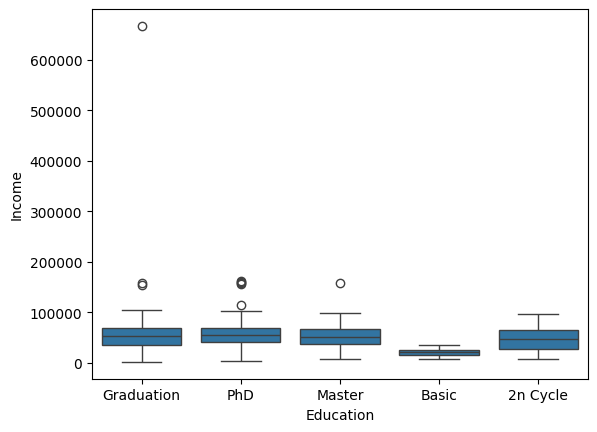

In [12]:
sns.boxplot(data, x='Education', y='Income')

We have a single outlier in income, roughly 3 times that of any other data points.  Who is this person?

In [13]:
data[data['Income']>200000]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
2233,9432,1977,Graduation,Together,666666.0,1,0,02-06-2013,23,9,...,1,3,6,0,0,0,0,0,0,0


This person was likely not reporting their income seriously.  Because this person has other data, let's keep this person, but change their income to the average for their "Graduation" education level.

In [14]:
data.at[2233,'Income']=data.groupby('Education')['Income'].median()['Graduation']

<Axes: xlabel='Education', ylabel='Income'>

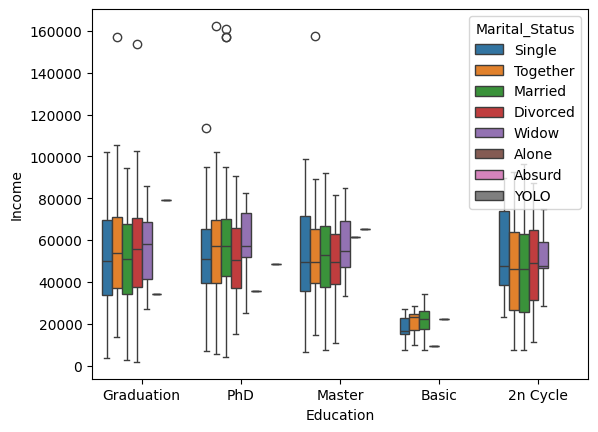

In [15]:
sns.boxplot(data, x='Education', y='Income', hue='Marital_Status')

In [16]:
data['Dt_Customer'].value_counts()

Dt_Customer
31-08-2012    12
12-09-2012    11
14-02-2013    11
12-05-2014    11
20-08-2013    10
              ..
05-08-2012     1
18-11-2012     1
25-05-2013     1
14-04-2013     1
09-01-2014     1
Name: count, Length: 663, dtype: int64

#### **Observations and Insights from the Data overview:**
From the context of these columns, we are dealing with a grocery story with an online presence, trying to determine how to spend its marketing budget to maximize profit.

There are 2240 unique customers and no missing values in the dataset. Not counting customer ID, we have 26 columns, of which 23 are numerical.  Nine of these numerical columns are dummy variables.  The remaining 3 non-numerical columns include a date string (*Dt_Customer*), education, and marital status. These need to be treated carefully.  

**Dt_Customer**: There are 663 unique dates on which our 2240 customers were acquired.

**Education**: Based on univariate analysis in income, "*Basic*" here seems to indicate less than a bachelors degree. "*2ncycle*" is the European equivalent of masters degree, though it may be worthwhile to keep around as a distinct category.

**Marital Status**: the responses given here indicate customers were permitted to fill out an "Other" category with a customer string response.  The author of this notebook would advise the data engineers to modify this to only permit the choices: married, together, single, divorced, widow, since "alone" should be taken as single and the remaining answers of "absurd" and "YOLO" are obviously not useful. We'll deal with the treatment of these below.

Converting "Alone" to "Single":

In [17]:
data['Marital_Status']=data['Marital_Status'].apply(lambda x: 'Single' if  x=='Alone' else x)
data['Marital_Status'].value_counts()

Marital_Status
Married     864
Together    580
Single      483
Divorced    232
Widow        77
Absurd        2
YOLO          2
Name: count, dtype: int64

## **Data Prepreprocessing/Exploratory Data Analysis**

Let's clean up the date column

In [18]:
data['Dt_Customer']=pd.to_datetime(data['Dt_Customer'],dayfirst=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 27 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID                   2240 non-null   int64         
 1   Year_Birth           2240 non-null   int64         
 2   Education            2240 non-null   object        
 3   Marital_Status       2240 non-null   object        
 4   Income               2240 non-null   float64       
 5   Kidhome              2240 non-null   int64         
 6   Teenhome             2240 non-null   int64         
 7   Dt_Customer          2240 non-null   datetime64[ns]
 8   Recency              2240 non-null   int64         
 9   MntWines             2240 non-null   int64         
 10  MntFruits            2240 non-null   int64         
 11  MntMeatProducts      2240 non-null   int64         
 12  MntFishProducts      2240 non-null   int64         
 13  MntSweetProducts     2240 non-nul

In [19]:
data['Year'], data['Month'], data['Day']=data['Dt_Customer'].dt.year, data['Dt_Customer'].dt.month, data['Dt_Customer'].dt.day

data=data.drop(['Dt_Customer'],axis=1)

In [20]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2240 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Recency              2240 non-null   int64  
 8   MntWines             2240 non-null   int64  
 9   MntFruits            2240 non-null   int64  
 10  MntMeatProducts      2240 non-null   int64  
 11  MntFishProducts      2240 non-null   int64  
 12  MntSweetProducts     2240 non-null   int64  
 13  MntGoldProds         2240 non-null   int64  
 14  NumDealsPurchases    2240 non-null   int64  
 15  NumWebPurchases      2240 non-null   i

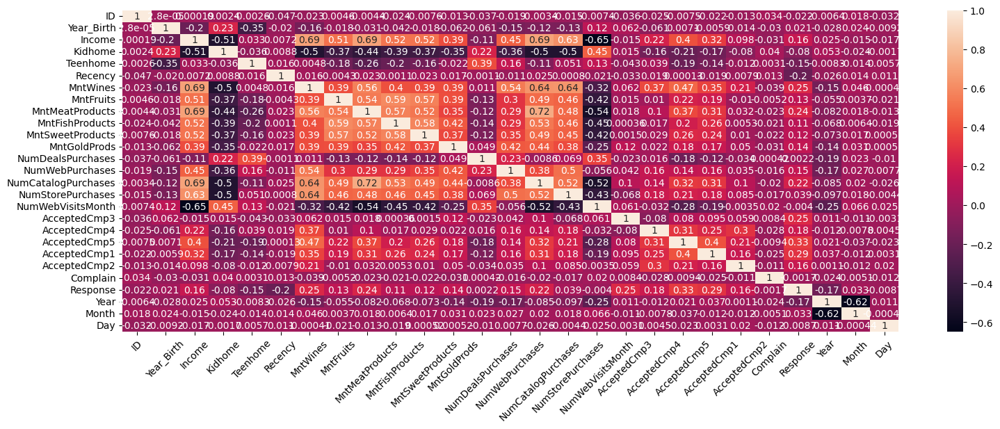

In [21]:
data_num=data.select_dtypes(include=['int', 'float'])

fig = plt.figure(figsize = (18, 6))

sns.heatmap(data_num.corr(), annot = True);

plt.xticks(rotation = 45);

Month and day of joining have minimal correlations to our other variables, excepting an interesting connection between month and year.

In [22]:
import plotly.express as px

In [23]:
px.box(data, x='Year', y='Month', points="all")

The negative correlation is purely an artifact of the time window being considered (July 2012-June 2014). Let's drop month and day.

In [24]:
data=data.drop(['Month', 'Day'],axis=1)

Let's look at our YOLO and Absurd Marital_Status points.  We note that Teenhome is the strongest correlate to birth year.

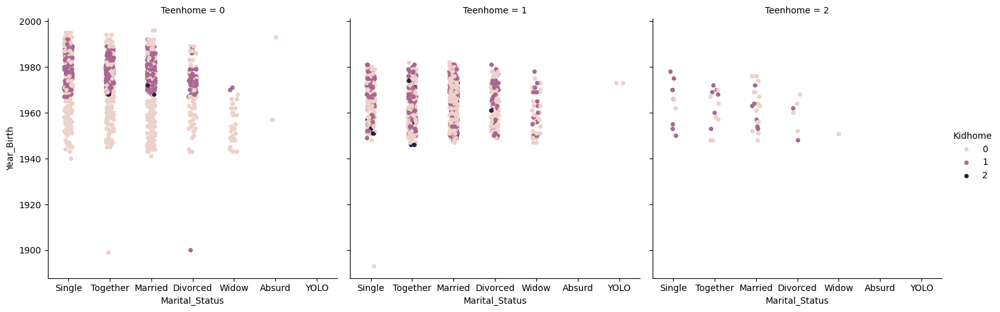

In [25]:
sns.catplot(data, y='Year_Birth', x='Marital_Status', hue='Kidhome', col='Teenhome')

Exploratory Data Analysis doesn't give much in the way of conclusions for YOLO and "Absurd" marital status. We'll assign them to be married, as the most common marital status.  Also, we note outliers in Year_Birth, which we'll assign to the average Year_Birth

In [26]:
data['Marital_Status']=data['Marital_Status'].apply(lambda x: 'Married' if  x=='YOLO' or x=="Absurd" else x)
data['Year_Birth']=data['Year_Birth'].apply(lambda x: data['Year_Birth'].mean() if  x<1920 else x)
#data['Marital_Status']=data['Marital_Status'].apply(lambda x: data.groupby('Year_Birth')['Marital_Status'].mode() if  x=='YOLO' or x=="Absurd" else x)
#data.groupby('Teenhome')['Year_Birth'].mean()[1]
#data[data['Year_Birth']<1920]['Year_Birth']
#data['Marital_Status']=data['Marital_Status'].apply(lambda x: 'Single' if  x=='Alone' else x)
#data['Year_Birth']=data['Year_Birth'].apply(lambda x: data.groupby('Teenhome')['Year_Birth'].mean() if  x<1920 else x)
#data[data['Year_Birth']<1920]['Year_Birth']=data.groupby('Kidhome')['Year_Birth'].mean()[]

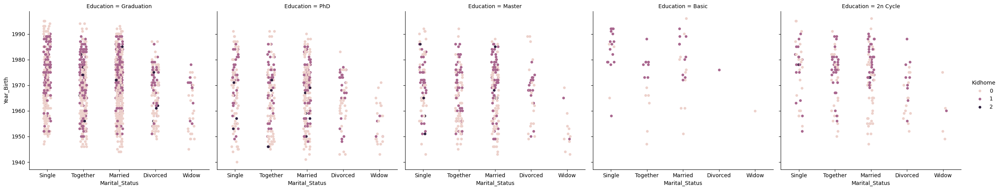

In [27]:
sns.catplot(data, y='Year_Birth', x='Marital_Status', hue='Kidhome', col='Education')

Dropping customer ID, which has been confirmed to be uncorrelated to any of our other variables.

In [28]:
data=data.drop(['ID'], axis=1)


In [29]:
data_dums=pd.get_dummies(data, drop_first=True)
data_dums.describe().T

,count,mean,std,min,25%,50%,75%,max
Year_Birth,2240.0,1968.901526,11.694076,1940.0,1959.00,1970.0,1977.00,1996.0
Income,2240.0,51978.877309,21420.317931,1730.0,35538.75,51411.5,68289.75,162397.0
Kidhome,2240.0,0.444196,0.538398,0.0,0.00,0.0,1.00,2.0
Teenhome,2240.0,0.506250,0.544538,0.0,0.00,0.0,1.00,2.0
Recency,2240.0,49.109375,28.962453,0.0,24.00,49.0,74.00,99.0
MntWines,2240.0,303.935714,336.597393,0.0,23.75,173.5,504.25,1493.0
MntFruits,2240.0,26.302232,39.773434,0.0,1.00,8.0,33.00,199.0
MntMeatProducts,2240.0,166.950000,225.715373,0.0,16.00,67.0,232.00,1725.0
MntFishProducts,2240.0,37.525446,54.628979,0.0,3.00,12.0,50.00,259.0
MntSweetProducts,2240.0,27.062946,41.280498,0.0,1.00,8.0,33.00,263.0


## **Questions:**

**1.** What is the summary statistics of the data? Explore summary statistics for numerical variables and the categorical variables


We note a large number of dummy variable columns, where the value is equal to 0 or 1, where the mean is simply the percentage of people having that attribute (e.g. 0.9% of correspondents had complained).

**2.** Find out number of unique observations in each category of categorical columns? Write your findings/observations/insights



In [30]:
data['Marital_Status'].value_counts(), data['Marital_Status'].value_counts()/len(data)

(Marital_Status
 Married     868
 Together    580
 Single      483
 Divorced    232
 Widow        77
 Name: count, dtype: int64,
 Marital_Status
 Married     0.387500
 Together    0.258929
 Single      0.215625
 Divorced    0.103571
 Widow       0.034375
 Name: count, dtype: float64)

In [31]:
data['Education'].value_counts(), data['Education'].value_counts()/len(data)

(Education
 Graduation    1127
 PhD            486
 Master         370
 2n Cycle       203
 Basic           54
 Name: count, dtype: int64,
 Education
 Graduation    0.503125
 PhD           0.216964
 Master        0.165179
 2n Cycle      0.090625
 Basic         0.024107
 Name: count, dtype: float64)

The largest segment of our customer based (868 of them, 39%) are married, followed by "Together" (580, 26%) and Single (483, 22%).  

The largest segment of our customer base (1127, 50%) had graduated high school, while 486 of them (22%) had PhDs.



**3.** Are all categories different from each other or can we combine some categories? Is 2n Cycle different from Master?

**Though 2n Cycle is essentially the European equivalent of a Masters, we leave the categories as distinct, in the event that they yield some predictive power, if nothing else than as a stand-in for country.**

**4.** There are 8 categories in Marital_Status with some categories having very low count of less than 5. Can we combine these categories with other categories?

**Yes, we have treated this condition.  "Alone" was changed to "Single" while "Absurd" and "YOLO" were converted to "Married" as the modal Marital_Status.**

### **Univariate Analysis on Numerical and Categorical data**

Univariate analysis is used to explore each variable in a data set, separately. It looks at the range of values, as well as the central tendency of the values. It can be done for both numerical and categorical variables.

- Plot histogram and box plot for different numerical features and understand how the data looks like.
-Explore the categorical variables like Education, Kidhome, Teenhome, Complain:
  **About 1% of customers complained.  For KidHome and Teenhome, the median customer had none.  Education has been explored above.**
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Leading Questions**:
1. How does the distribution of Income variable vary across the dataset?
2. The histogram and the box plot are showing some extreme value on the right side of the distribution of the 'Income' feature. Can we consider them as outliers and remove or should we analyze these extreme values?


3. There are only a few rows with extreme values for the Income variable. Is that enough information to treat (or not to treat) them? At what percentile the upper whisker lies?


In [32]:
data[data['Income']>120000]

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,...,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Year
164,1973.0,PhD,Married,157243.0,0,1,98,20,2,1582,...,0,0,0,0,0,0,0,0,0,2014
617,1976.0,PhD,Together,162397.0,1,1,31,85,1,16,...,1,1,0,0,0,0,0,0,0,2013
655,1975.0,Graduation,Divorced,153924.0,0,0,81,1,1,1,...,0,0,0,0,0,0,0,0,0,2014
687,1982.0,PhD,Married,160803.0,0,0,21,55,16,1622,...,1,0,0,0,0,0,0,0,0,2012
1300,1971.0,Master,Together,157733.0,1,0,37,39,1,9,...,1,1,0,0,0,0,0,0,0,2013
1653,1977.0,Graduation,Together,157146.0,0,0,13,1,0,1725,...,0,1,0,0,0,0,0,0,0,2013
2132,1949.0,PhD,Married,156924.0,0,0,85,2,1,2,...,0,0,0,0,0,0,0,0,0,2013


These 7 outliers represent 0.3% of the data.  As such, the right whisker is at the 99.7th percentile. We elect to replace these incomes with incomes normally distributed around the median.  

In [33]:
indices_to_be_updated=data[data['Income']>120000].index
#n.b. meanIncome is actually median, as per above treatment to protect against outlier effects
np.random.seed(42)
data.loc[indices_to_be_updated, 'Income']=np.random.normal( meanIncome, stdIncome, len(indices_to_be_updated))
'''i=0
while len(data[data['Income']<0])>0:
  np.random.seed(i)
  data.loc[indices_to_be_updated, 'Income']=np.random.normal( meanIncome, stdIncome, len(indices_to_be_updated))
  i+=1'''

"i=0\nwhile len(data[data['Income']<0])>0:\n  np.random.seed(i)\n  data.loc[indices_to_be_updated, 'Income']=np.random.normal( meanIncome, stdIncome, len(indices_to_be_updated))\n  i+=1"

Year_Birth
Skew : -0.09


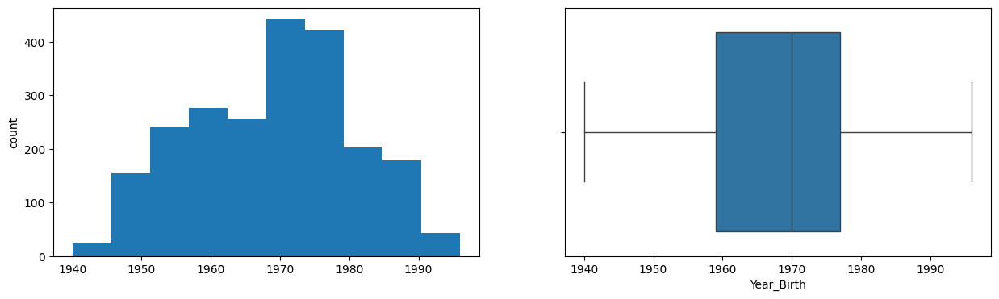

Income
Skew : 0.01


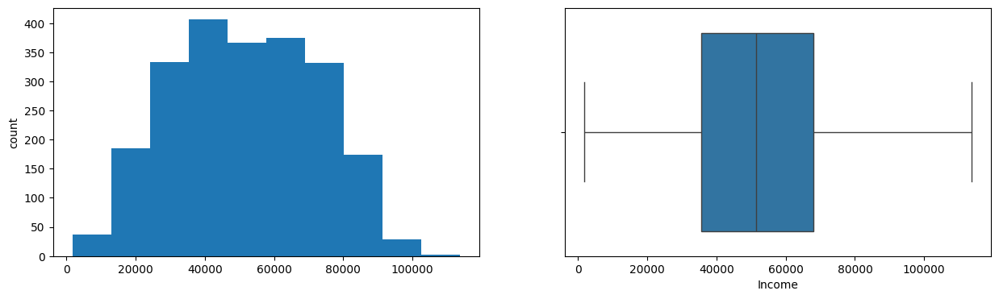

Kidhome
Skew : 0.64


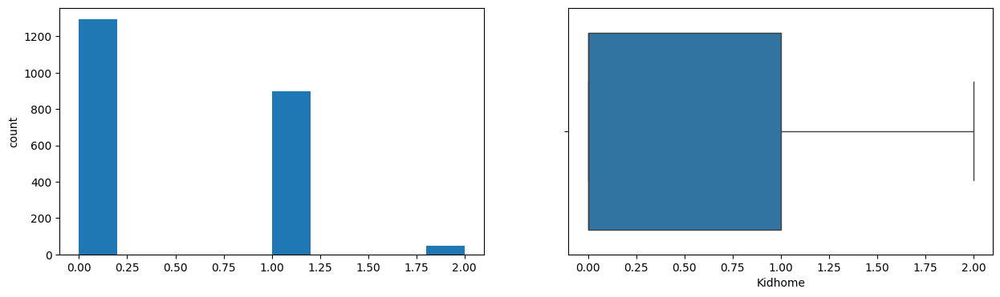

Teenhome
Skew : 0.41


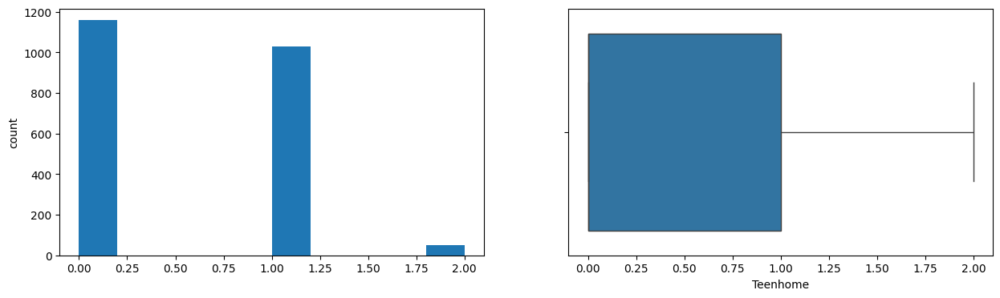

Recency
Skew : -0.0


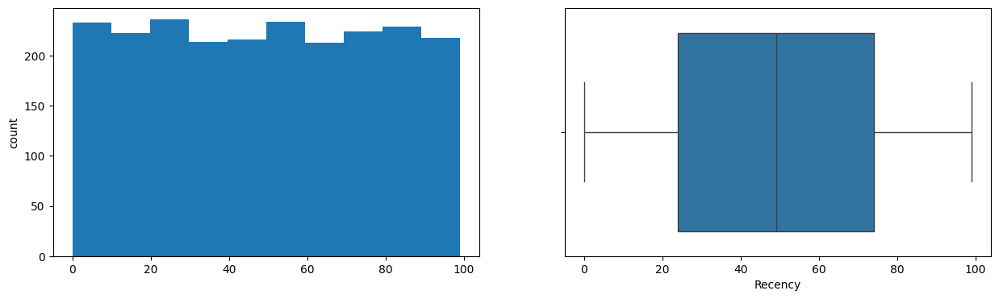

MntWines
Skew : 1.18


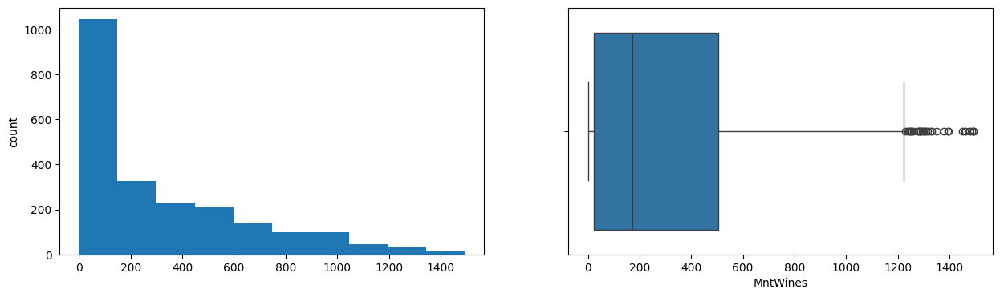

MntFruits
Skew : 2.1


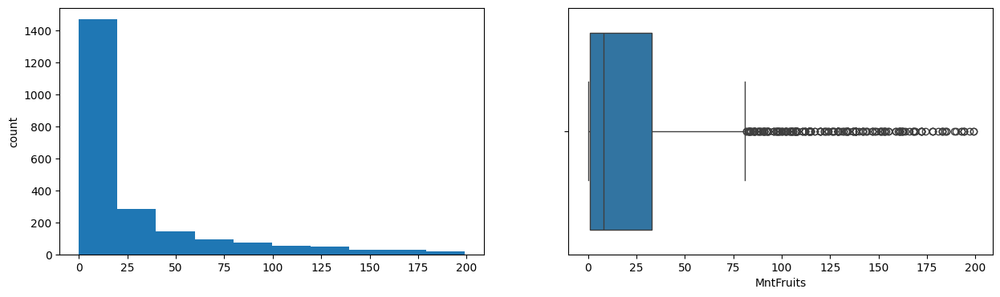

MntMeatProducts
Skew : 2.08


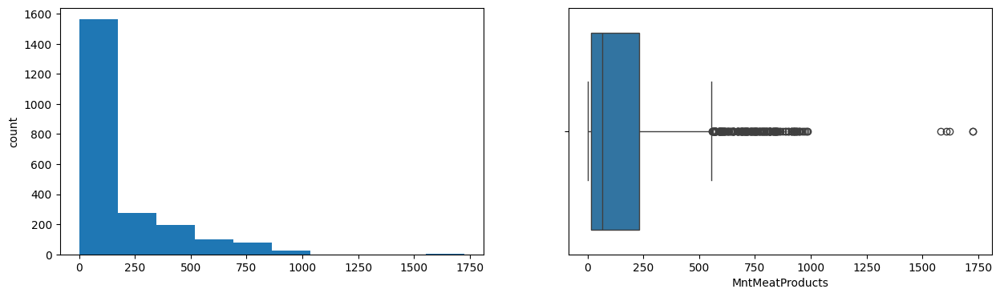

MntFishProducts
Skew : 1.92


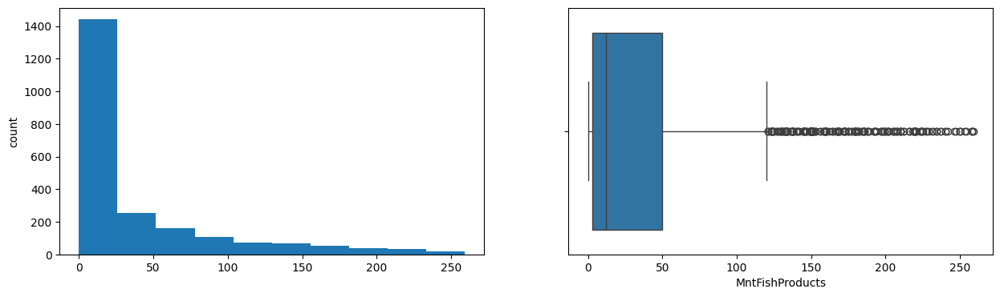

MntSweetProducts
Skew : 2.14


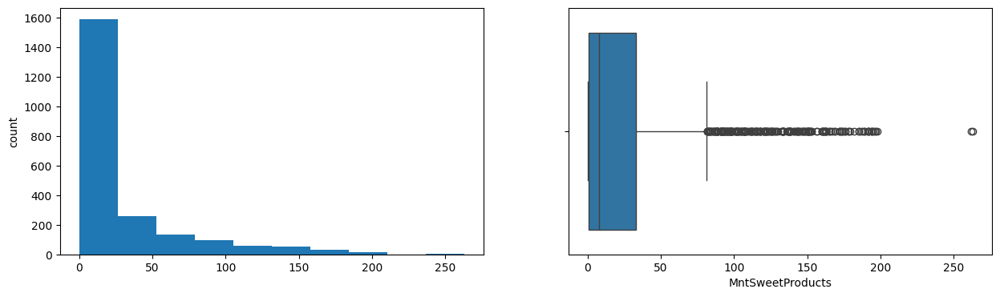

MntGoldProds
Skew : 1.89


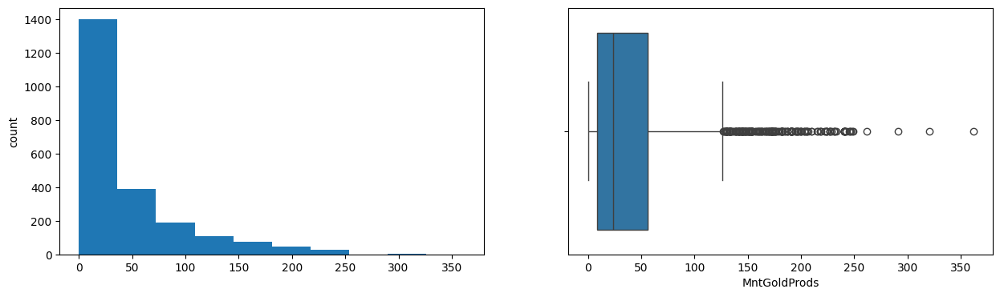

NumDealsPurchases
Skew : 2.42


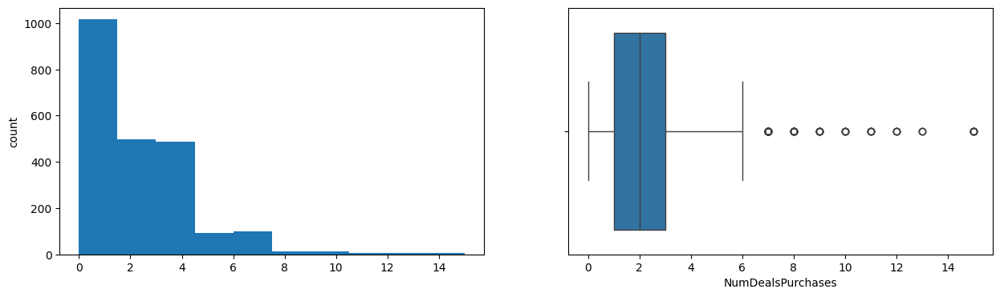

NumWebPurchases
Skew : 1.38


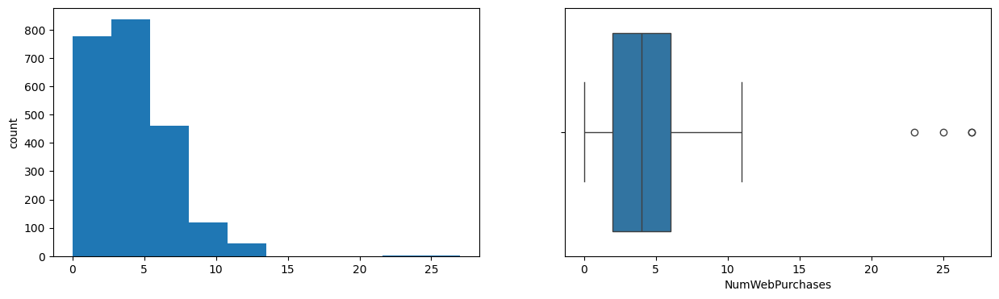

NumCatalogPurchases
Skew : 1.88


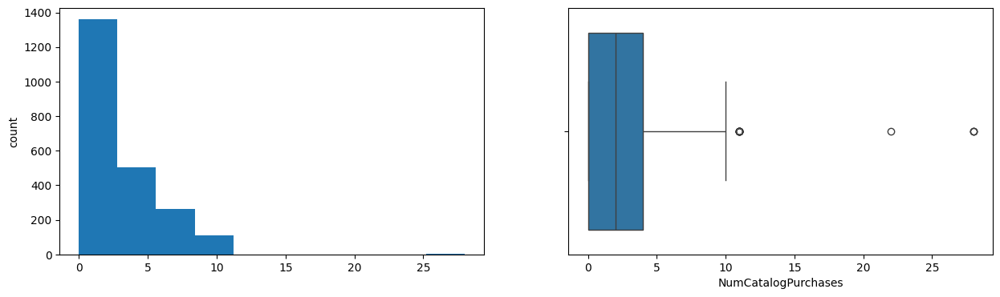

NumStorePurchases
Skew : 0.7


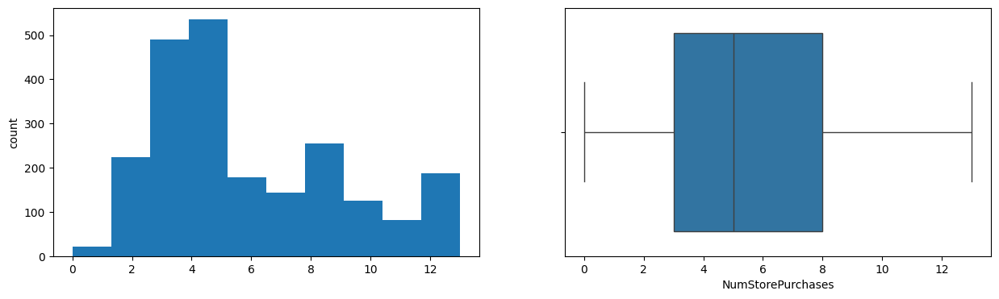

NumWebVisitsMonth
Skew : 0.21


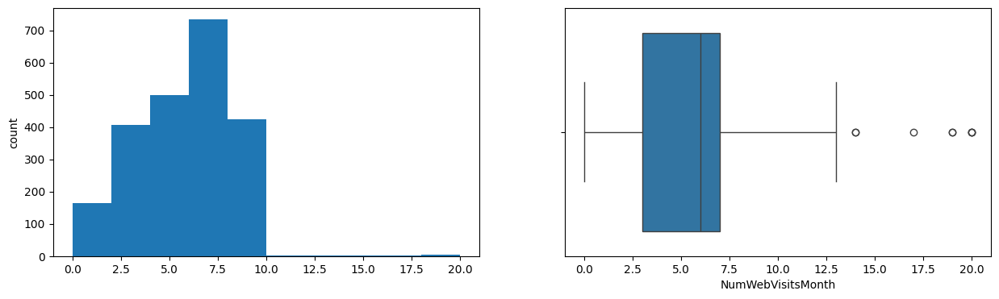

AcceptedCmp3
Skew : 3.29


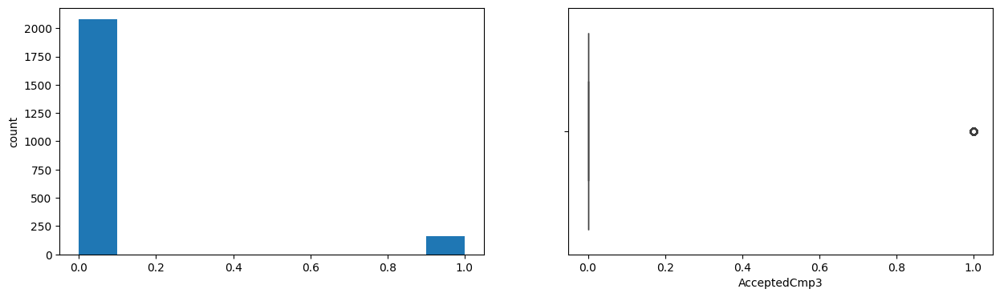

AcceptedCmp4
Skew : 3.24


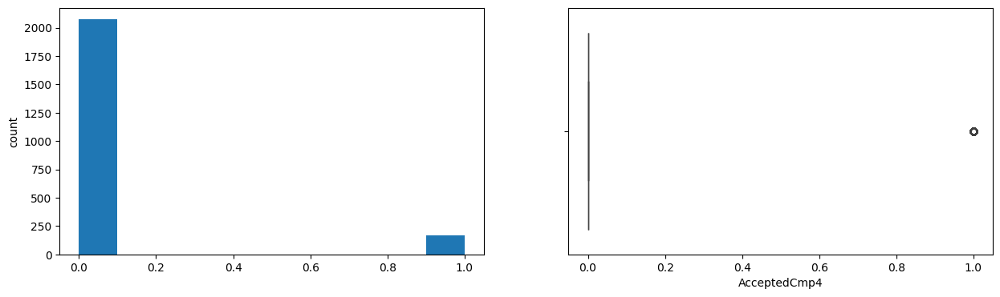

AcceptedCmp5
Skew : 3.29


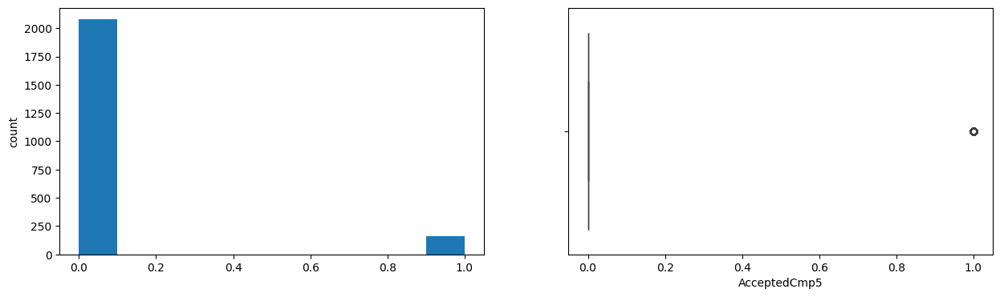

AcceptedCmp1
Skew : 3.56


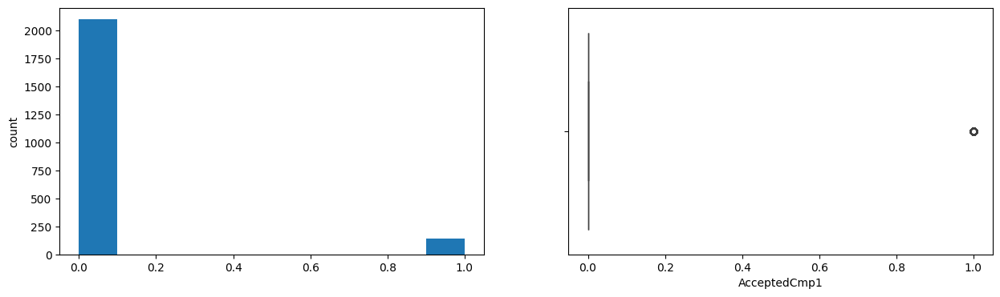

AcceptedCmp2
Skew : 8.62


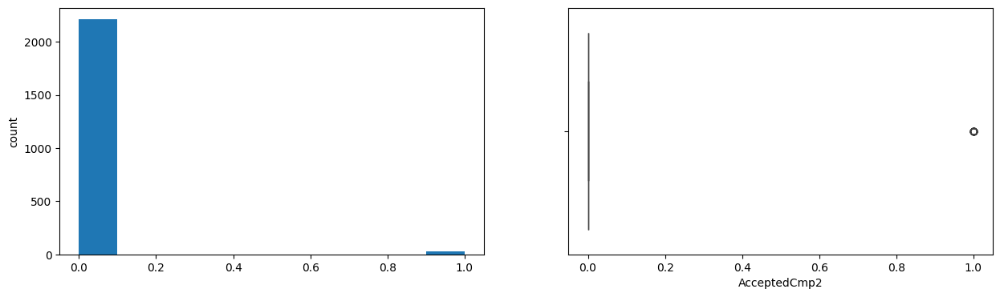

Complain
Skew : 10.19


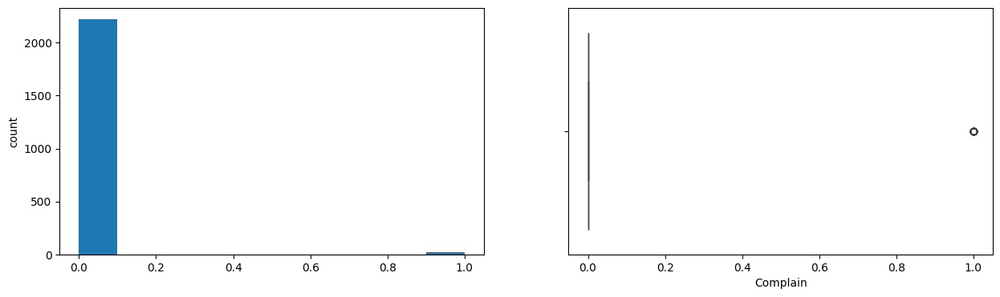

Response
Skew : 1.97


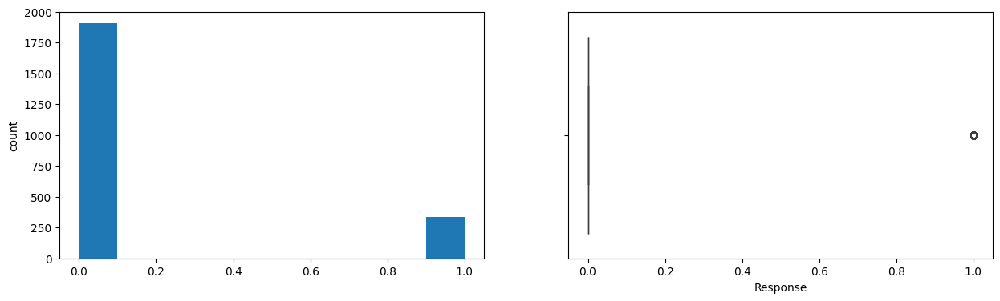

Year
Skew : -0.04


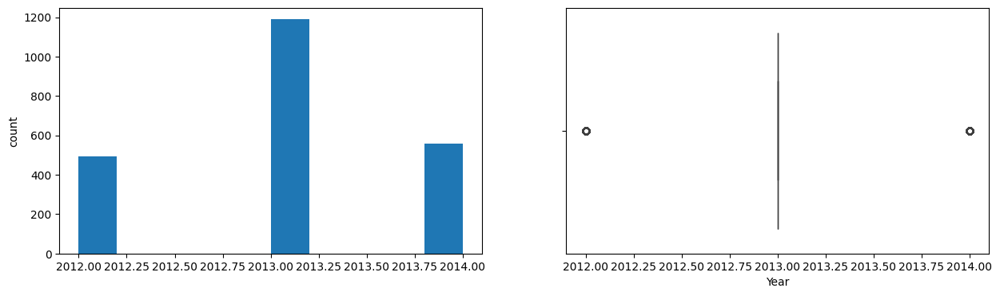

In [34]:
numerical_cols = [col for col in data.columns if pd.api.types.is_numeric_dtype(data[col])]
for col in numerical_cols:
    print(col)

    print('Skew :', round(data[col].skew(), 2))

    plt.figure(figsize = (15, 4))

    plt.subplot(1, 2, 1)

    data[col].hist(bins = 10, grid = False)

    plt.ylabel('count')

    plt.subplot(1, 2, 2)

    sns.boxplot(x = data[col])

    plt.show()

We note the following about the various columns:

* **Year_Birth** skews slightly right, as our customers skew younger


Year_Birth
Skew : -0.09


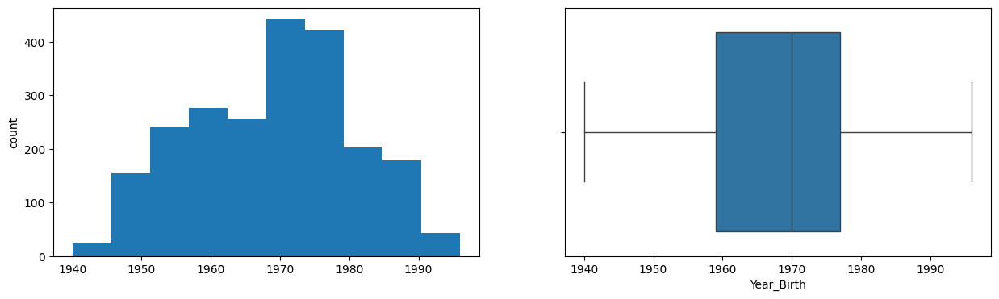

In [35]:
col="Year_Birth"

print(col)

print('Skew :', round(data[col].skew(), 2))

plt.figure(figsize = (15, 4))

plt.subplot(1, 2, 1)

data[col].hist(bins = 10, grid = False)

plt.ylabel('count')

plt.subplot(1, 2, 2)

sns.boxplot(x = data[col])

plt.show()



* **Income** having shaved our outliers, Income is now normally distributed (see below)
* **Recency** of last purchase shows remarkable uniformity in its distribution.
* **Mnts** of various food products all skew strongly right in such a systematic way that the outliers need to be retained, as they are likely power-law distributed a la many economic variables. (See sample below).
* **Kidhome** and **Teenhome** both have median values of 0, in that most customers have no dependents living at home.
* **Purchases** distributions all skew right.

Income
Skew : 0.01


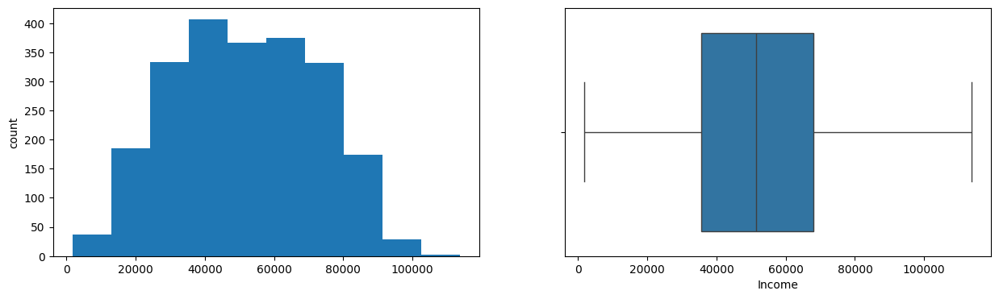

In [36]:
col="Income"
print(col)

print('Skew :', round(data[col].skew(), 2))

plt.figure(figsize = (15, 4))

plt.subplot(1, 2, 1)

data[col].hist(bins = 10, grid = False)

plt.ylabel('count')

plt.subplot(1, 2, 2)

sns.boxplot(x = data[col])

plt.show()

MntWines
Skew : 1.18


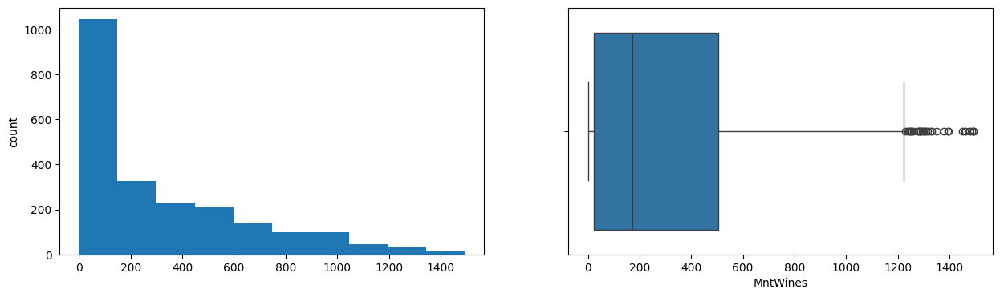

In [37]:
col="MntWines"
print(col)

print('Skew :', round(data[col].skew(), 2))

plt.figure(figsize = (15, 4))

plt.subplot(1, 2, 1)

data[col].hist(bins = 10, grid = False)

plt.ylabel('count')

plt.subplot(1, 2, 2)

sns.boxplot(x = data[col])

plt.show()

### **Bivariate Analysis**

 - Analyze different categorical and numerical variables and check how different variables are related to each other.
 - Check the relationship of numerical variables with categorical variables.

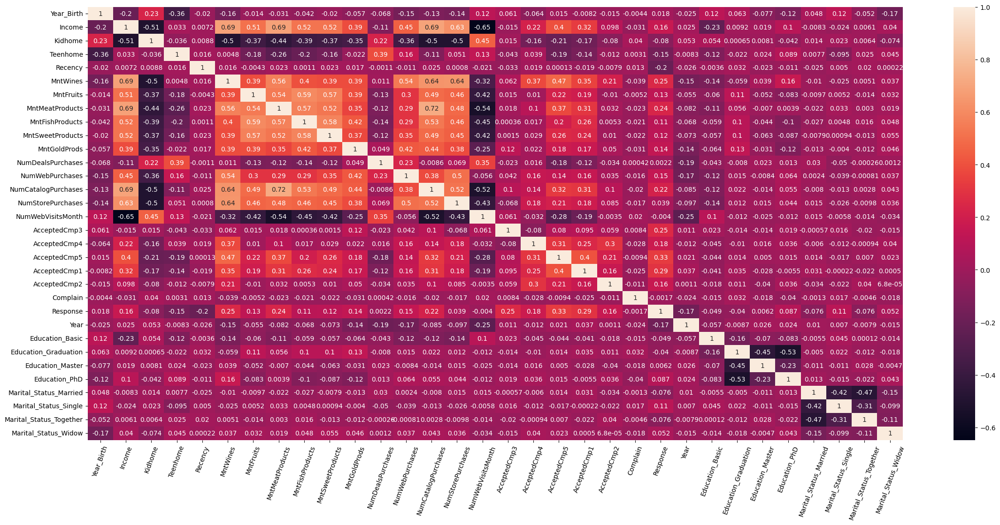

In [38]:
fig = plt.figure(figsize = (28, 12))

sns.heatmap(data_dums.corr(), annot = True);

plt.xticks(rotation = 70);

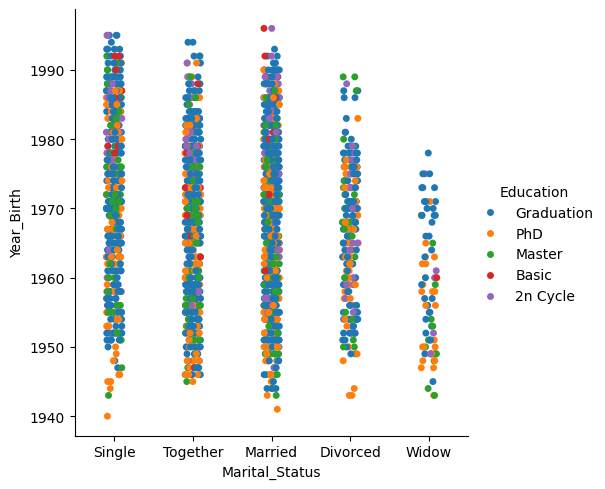

In [39]:
sns.catplot(data, y='Year_Birth', x='Marital_Status', hue='Education')

<Axes: xlabel='Marital_Status', ylabel='Year_Birth'>

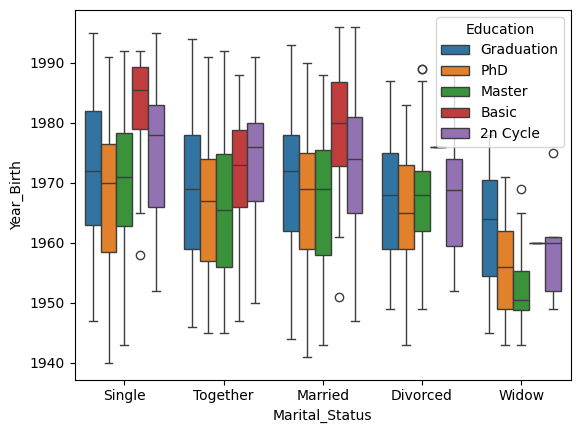

In [40]:
sns.boxplot(data, y='Year_Birth', x='Marital_Status', hue='Education')

Key observations are that PhDs and Masters tend to be older and Basic education tends to be younger.  The 2n Cycles seem consistently a bit older than their masters counterparts, which means keeping them as separate categories is worthwhie.

<Axes: xlabel='Education', ylabel='Income'>

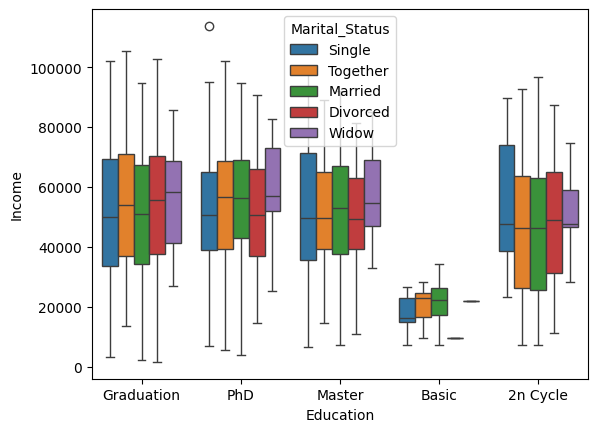

In [41]:
sns.boxplot(data, y='Income', x='Education', hue='Marital_Status')

The only notable difference in education and income is for Basic education to earn a lot less.  We also note that Widows earn more, but then again they are older so this is expected (corr (Income, Year_Birth)=-0.2

Let's see who does the shopping;

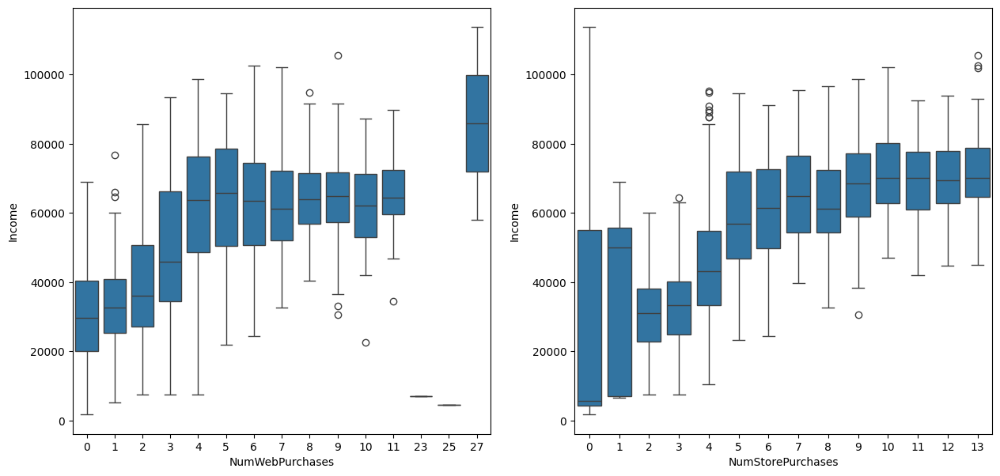

In [42]:
plt.figure(figsize=(15, 7))
plt.subplot(1, 2, 1)
sns.boxplot(data, y='Income', x='NumWebPurchases')
plt.subplot(1, 2, 2)
sns.boxplot(data, y='Income', x='NumStorePurchases')
plt.show()

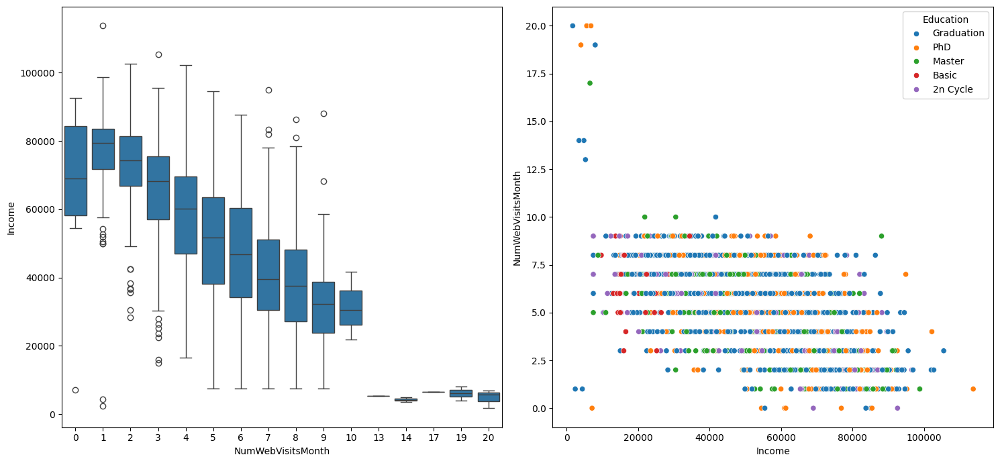

In [43]:
plt.figure(figsize=(15, 7))
plt.subplot(1, 2, 1)
sns.boxplot(data, x='NumWebVisitsMonth', y='Income')
plt.subplot(1, 2, 2)
sns.scatterplot(data, y='NumWebVisitsMonth', x='Income', hue="Education")
plt.tight_layout()
plt.show()

These two graphs tell interesting and complementary stories. The first says that the fewer number web visits per month, the higher income the person while the extreme right skew of customers making a lot of visits earn a lot less.  The graph at right shows this as well, that only the very lowest income customers visit the website more than 10 times per month.  This seems to contradict that the highest income individuals made the most online purchases.

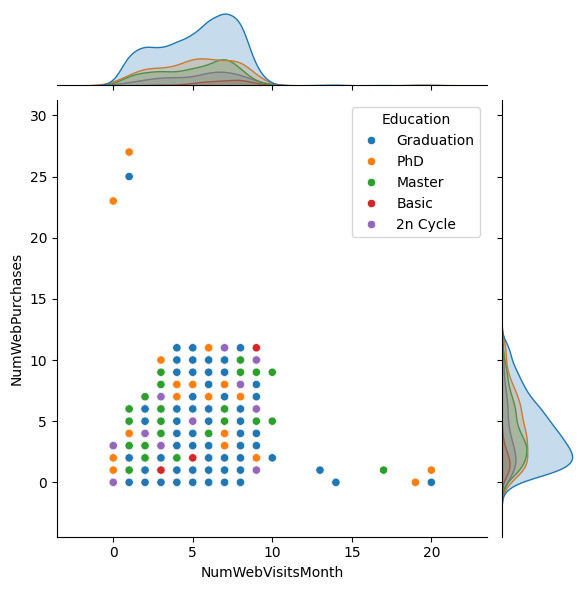

In [44]:
sns.jointplot(data, x='NumWebVisitsMonth', y='NumWebPurchases' ,hue="Education");

Unfortunately, correlation is not robust to outliers, so these 9 people might be constituting the entirety of the -0.52 correlation. Let's check this.

-0.010576900440938886


<Axes: xlabel='NumWebVisitsMonth', ylabel='NumWebPurchases'>

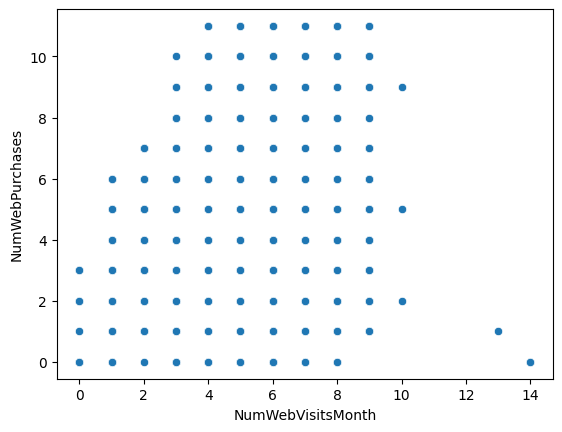

In [45]:
NumWebPurchases_no_outliers=data[data['NumWebPurchases']<15]['NumWebPurchases']
NumWebVisitsMonth_no_outliers=data[data['NumWebVisitsMonth']<15]['NumWebVisitsMonth']
print(NumWebPurchases_no_outliers.corr(NumWebVisitsMonth_no_outliers))
sns.scatterplot(x=NumWebVisitsMonth_no_outliers, y=NumWebPurchases_no_outliers)

The heatmap above is a bit unwieldy, but it may prove useful to look at two subsets of it:
* the various amounts purchased
* the nth responses to campaigns

In [46]:
cols_with_Mnt = [col for col in data.columns if "Mnt" in col]
cols_with_Mnt_Edu = [col for col in data.columns if "Mnt" in col or 'Education' in col]
cols_with_accepted = [col for col in data.columns if "Accepted" in col or "Response" in col]
print(cols_with_Mnt)
print(cols_with_accepted)

['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']
['AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Response']


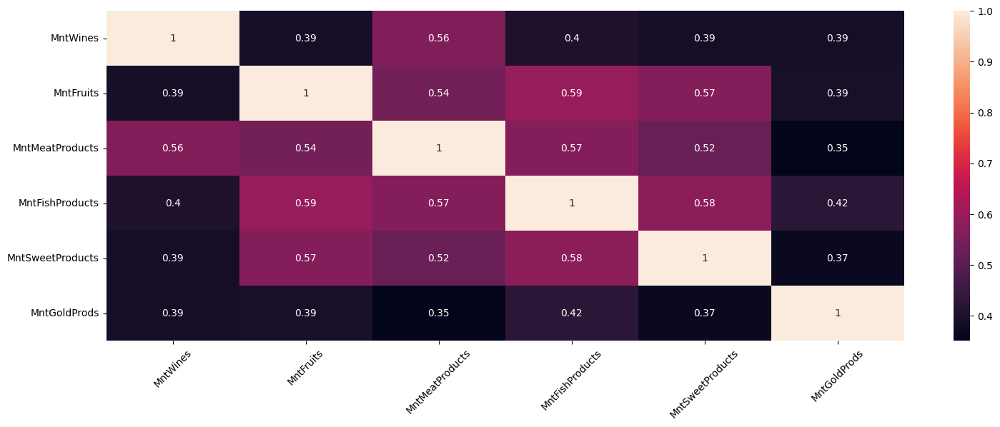

In [47]:
fig = plt.figure(figsize = (18, 6))

sns.heatmap(data[cols_with_Mnt].corr(), annot = True);

plt.xticks(rotation = 45);

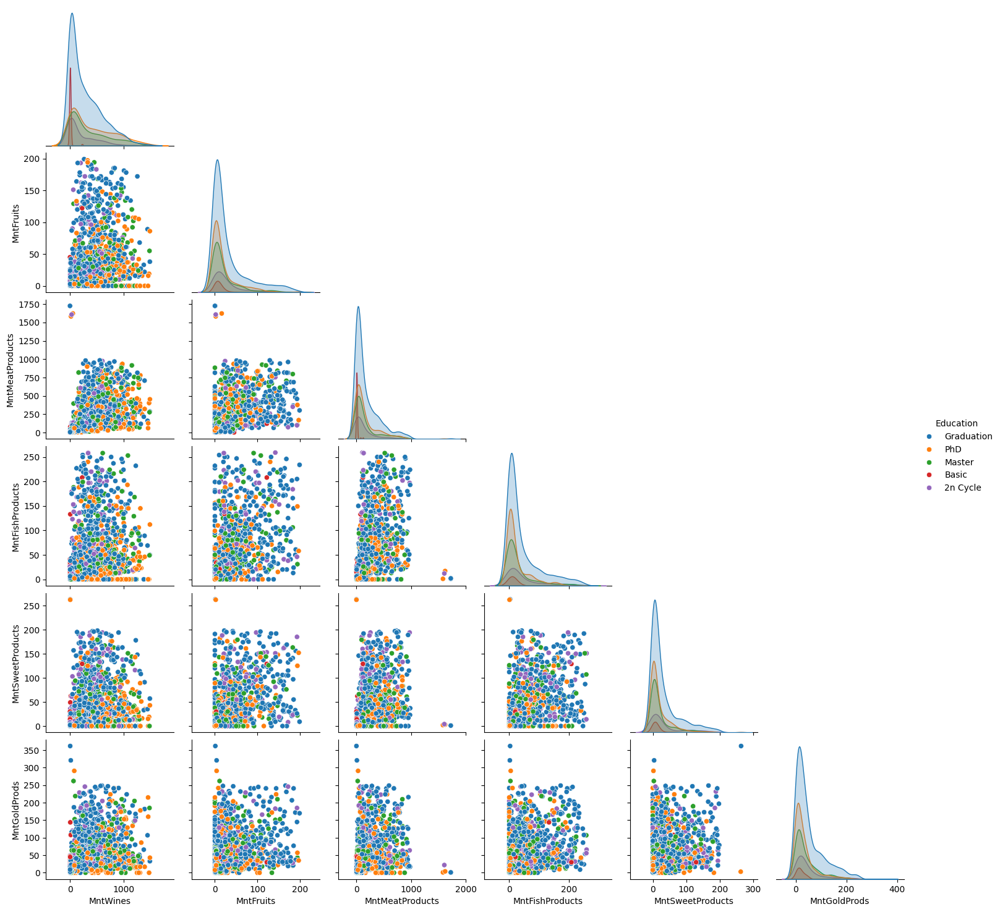

In [48]:
sns.pairplot(data[cols_with_Mnt_Edu], corner=True, hue='Education')

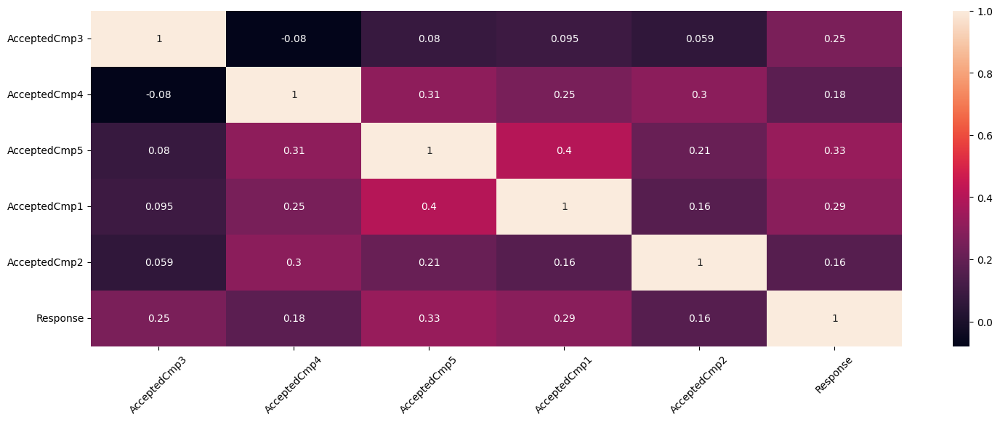

In [49]:
fig = plt.figure(figsize = (18, 6))

sns.heatmap(data[cols_with_accepted].corr(), annot = True);

plt.xticks(rotation = 45);

Not a whole lot of information other than responding to the last campaign was modestly correlated with responding to any prior campaign, though the third campaign also seemed oddly unique in its strategy for not being correlated to other campaigns.  


<Axes: ylabel='Success rate'>

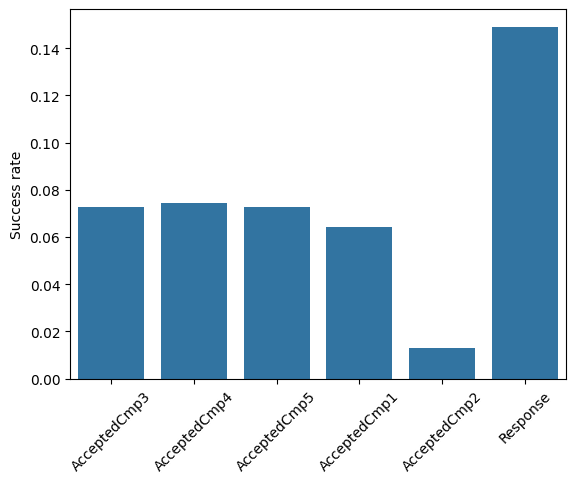

In [50]:
means=data[cols_with_accepted].mean()
plt.xticks(rotation = 45);
plt.ylabel("Success rate")
sns.barplot(means)

Campaign 2 was the least successful.  The last campaign was the most successful. Let's break this down by demographic.

In [51]:
import numpy

AcceptedCmp3


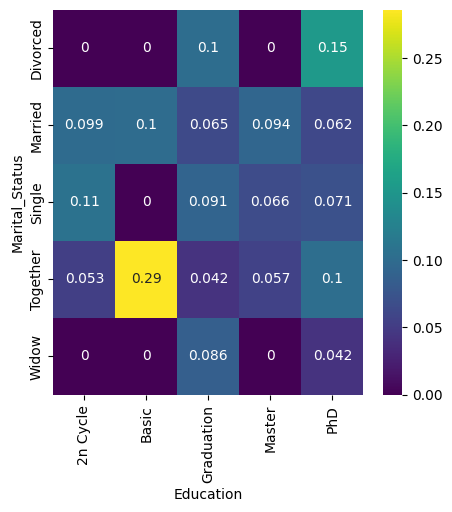

AcceptedCmp4


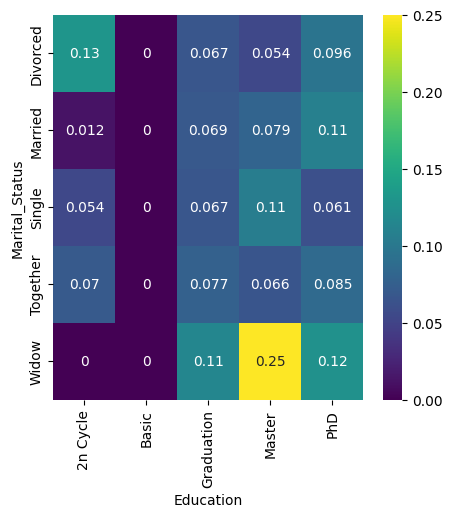

AcceptedCmp5


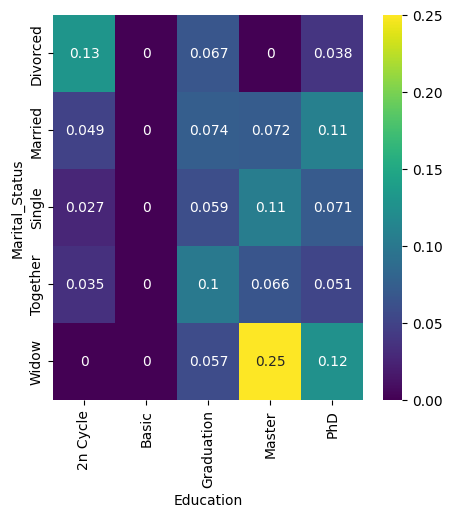

AcceptedCmp1


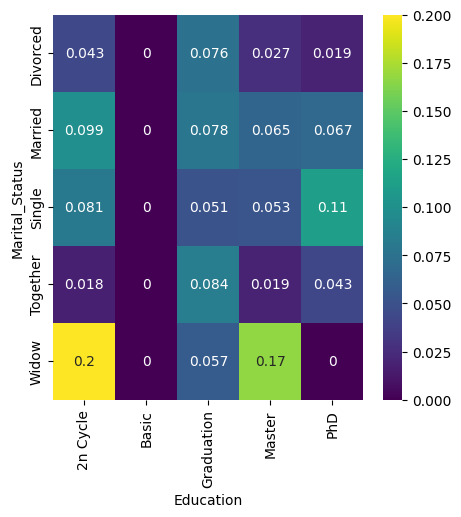

AcceptedCmp2


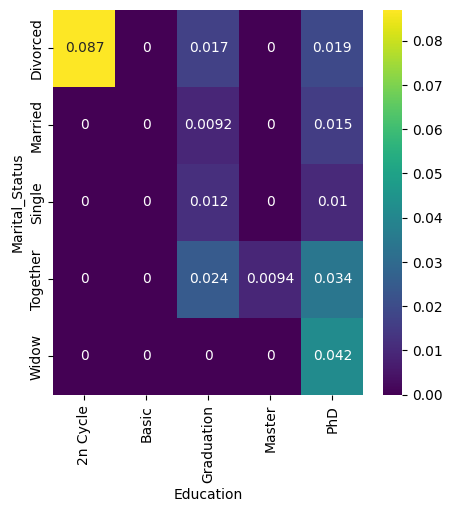

Response


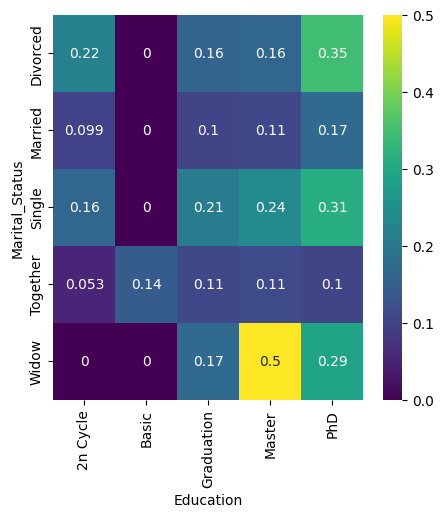

In [52]:
for col in cols_with_accepted:

  print(col)
  demo_data=data.pivot_table(index='Marital_Status', columns='Education', values=col)
  plt.figure(figsize = (5, 5)) # To resize the plot
  sns.heatmap(demo_data, cmap = 'viridis', annot = True)
  plt.show()

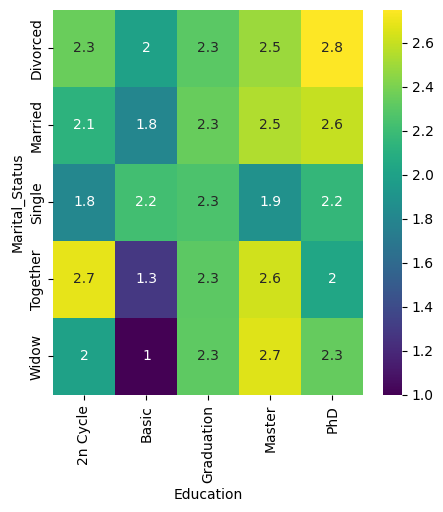

In [53]:
demo_data=data.pivot_table(index='Marital_Status', columns='Education', values='NumDealsPurchases')
plt.figure(figsize = (5, 5)) # To resize the plot
sns.heatmap(demo_data, cmap = 'viridis', annot = True)
plt.show()

* First campaign: was most successful with 2n cycle widows and masters widows
* Second campaign: divorced 2n cycles, but still low success overall
* Third campaign: cohabitating customers with basic education
* Fourth and fifth campaigns: masters widows
* Last campaign: we note that this was the most successful campaign overall and it was most successful with masters widows; divorced, single, and widowed PhDs; but decently successful with divorced and single people in general.
* Discounts were most effective for divorced people and least effective for people with a Basic education. Notably, the Masters students had a higher number of discounted purchases than the 2N cycles.

### **Feature Engineering and Data Processing**

In this section, we will first prepare our dataset for analysis.
- Imputing missing values
Already completed above.

**Think About It:**

- Can we extract the age of each customer and create a new feature?
- Can we find the total kids and teens in the home?
- Can we find out how many members each family has?
- Can we find the total amount spent by the customers on various products?
- Can we find out how long the customer has been with the company?
- Can we find out how many offers the customers have accepted?
- Can we find out amount spent per purchase?



In [54]:
new_cols=[]

In [55]:
#current customer age
data['Age']=2016-data['Year_Birth']

In [56]:
new_cols.append('Age')#keeping a running list of my new cols for EDA

In [57]:
data.drop('Year_Birth', axis=1, inplace=True)

In [58]:
#total kids
data['TotDependents']=data['Kidhome']+data['Teenhome']
new_cols.append('TotDependents')
#family size
data['Adults']=data.apply(lambda x: 1 if x['Marital_Status'] in ['Single ', 'Widow', 'Divorced'] else 2, axis=1)
data['FamilySize']=data['TotDependents']+data['Adults']
new_cols.append('FamilySize')
#total spent
data['TotSpent']=data[cols_with_Mnt].sum(axis=1)
new_cols.append('TotSpent')
#customer longevity
data['Longevity']=2016-data['Year']
new_cols.append('Longevity')
#total offers accepted
#data[cols_with_accepted].corr()>0.5

In [59]:
print(cols_with_accepted)

['AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Response']


In [60]:
data['TotAccepted']=data[cols_with_accepted].sum(axis=1)
new_cols.append('TotAccepted')

In [61]:
data['TotAccepted'].value_counts(normalize=True)

TotAccepted
0    0.728125
1    0.165179
2    0.063393
3    0.022768
4    0.016518
5    0.004018
Name: proportion, dtype: float64

In [62]:
len(data[data['NumDealsPurchases']==1])

970

In [63]:

#Total number purchases
data['TotNumPurchased']=data['NumCatalogPurchases']+data['NumStorePurchases']+data['NumWebPurchases']
new_cols.append('TotNumPurchased')
#Spent per purchase, Divide by 0 exception set to 0
data['AvgPerPurchase']=data.apply(lambda x: 0 if x['TotNumPurchased']==0 else x['TotSpent'] / x['TotNumPurchased'], axis=1)
new_cols.append('AvgPerPurchase')

In [64]:
#data[cols_with_accepted].corr()>0.5

In [65]:
data['AvgPerPurchase'].min()

0.0

Statistics for engineered features.

Age
Skew : 0.09


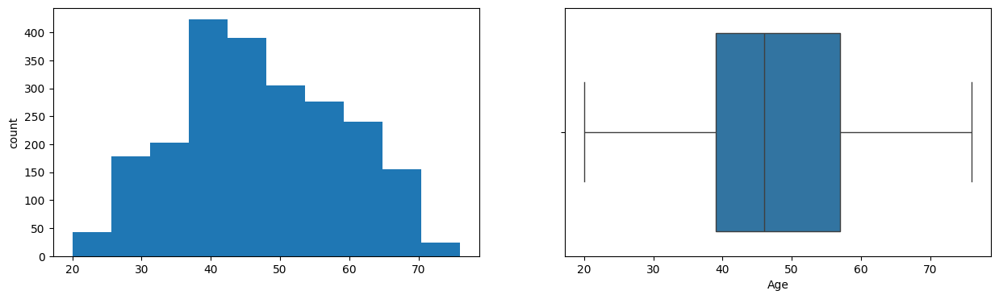

TotDependents
Skew : 0.42


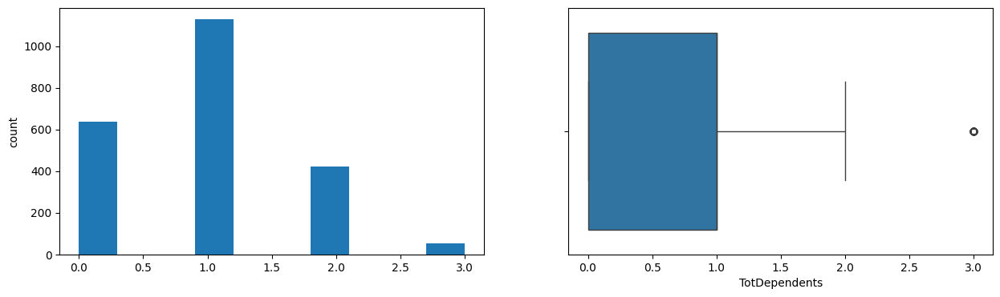

FamilySize
Skew : 0.18


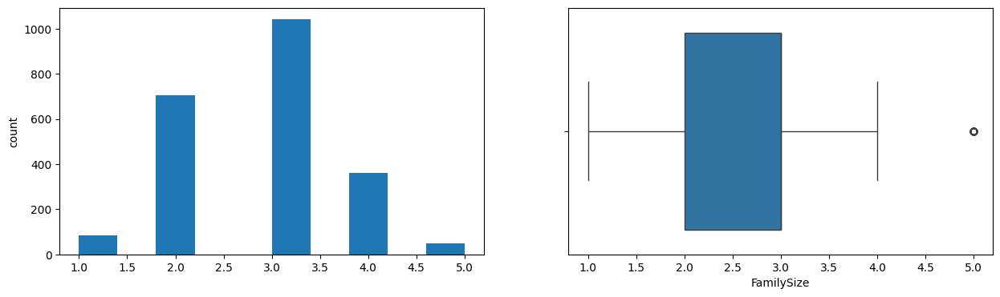

TotSpent
Skew : 0.86


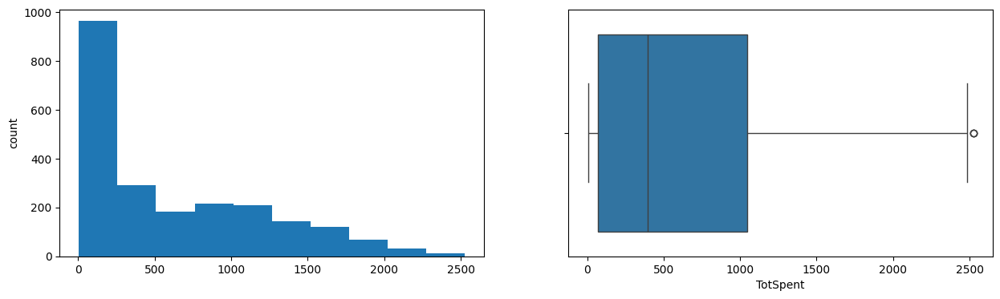

Longevity
Skew : 0.04


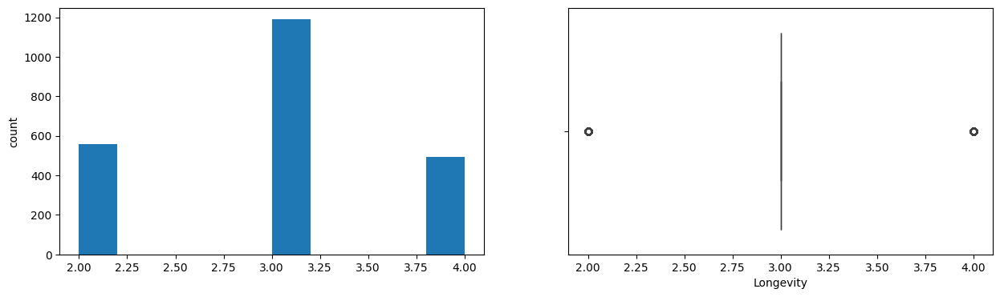

TotAccepted
Skew : 2.43


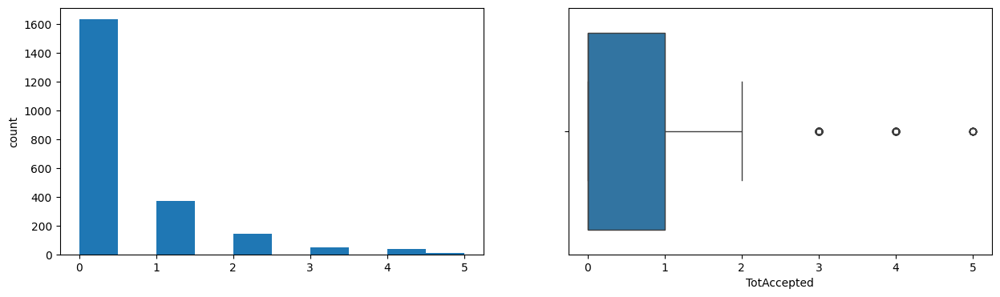

TotNumPurchased
Skew : 0.3


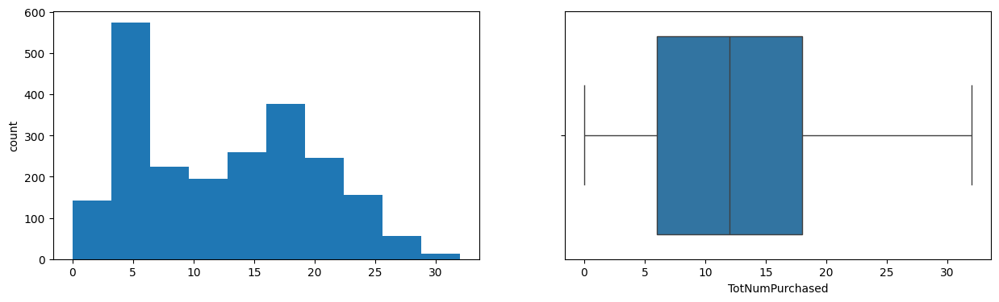

AvgPerPurchase
Skew : 20.75


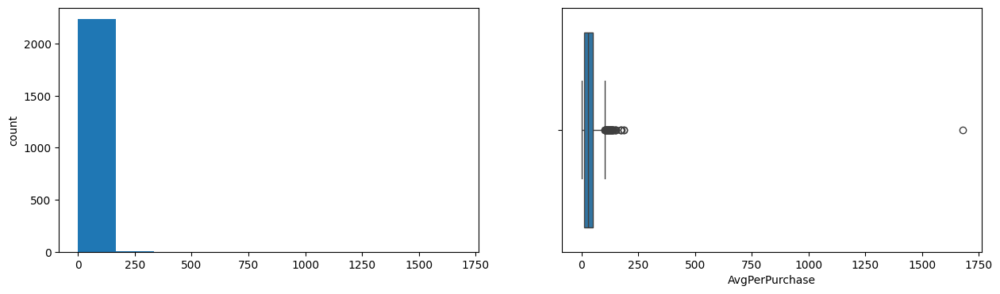

In [66]:
for col in new_cols:
    print(col)

    print('Skew :', round(data[col].skew(), 2))

    plt.figure(figsize = (15, 4))

    plt.subplot(1, 2, 1)

    data[col].hist(bins = 10, grid = False)

    plt.ylabel('count')

    plt.subplot(1, 2, 2)

    sns.boxplot(x = data[col])

    plt.show()

Removing one outlier from AvgPerPurchase.

In [67]:
#data[data['AvgPerPurchase']>500]['AvgPerPurchase']=data['AvgPerPurchase'].mean()
data.loc[data['AvgPerPurchase'] > 500, 'AvgPerPurchase']=data['AvgPerPurchase'].mean()

In [68]:
data[data['AvgPerPurchase']>500]['AvgPerPurchase']

Series([], Name: AvgPerPurchase, dtype: float64)

In [69]:
#data[cols_with_accepted].corr()>0.5

Skew : 1.3


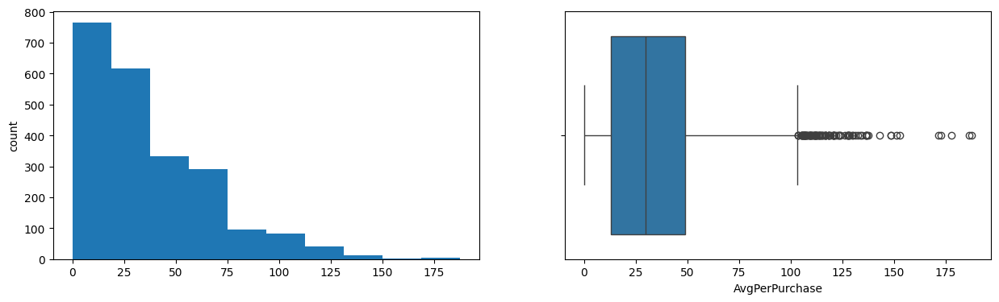

In [70]:
print('Skew :', round(data['AvgPerPurchase'].skew(), 2))

plt.figure(figsize = (15, 4))

plt.subplot(1, 2, 1)

data['AvgPerPurchase'].hist(bins = 10, grid = False)

plt.ylabel('count')

plt.subplot(1, 2, 2)

sns.boxplot(x = data['AvgPerPurchase'])

plt.show()

#**Insights for Engineered Features**
1. Age is roughly normally distributed, as expected from Year_Birth data
2. Graphs of total number of purchases, total amount purchases, and average amount per purchase all skewed strongly right, with a few outlier customers dominating each of these metrics.
3. Demographic variables like family size and number of dependents followed a binomial distribution, as did customer longevity.

## **Important Insights from EDA and Data Preprocessing**

What are the the most important observations and insights from the data based on the EDA and Data Preprocessing performed?

## **Data Preparation for Segmentation**

- The decision about which variables to use for clustering is a critically important decision that will have a big impact on the clustering solution. So we need to think carefully about the variables we will choose for clustering. Clearly, this is a step where a lot of contextual knowledge, creativity, and experimentation/iterations are needed.
- Moreover, we often use only a few of the data attributes for segmentation (the segmentation attributes) and use some of the remaining ones (the profiling attributes) only to profile the clusters. For example, in market research and market segmentation, we can use behavioral data for segmentation (to segment the customers based on their behavior like amount spent, units bought, etc.), and then use both demographic as well as behavioral data for profiling the segments found.
- Plot the correlation plot after we've removed the irrelevant variables
- Scale the Data

Separating out behavior coluns: We note that **cols_with_Mnt** and **cols_with_accepted** are already subsets of behavior.  To this we'll add: **Recency**, all **Num__Purchases**, **NumWebVisitsMonth**, and **Complain** and new columns: **AvgPerPurchase**,**TotSpent** ,**TotAccepted**

In [71]:
#data[cols_with_accepted].corr()>0.5

In [72]:
cols_behavior = cols_with_Mnt+cols_with_accepted+[col for col in data.columns if "Num" in col]+['TotAccepted','Complain','AvgPerPurchase','TotSpent', 'Recency']
print(cols_behavior)

['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Response', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'TotNumPurchased', 'TotAccepted', 'Complain', 'AvgPerPurchase', 'TotSpent', 'Recency']


We also need demographic columns: TotDependents, Age, FamilySize,Education, Marital_Status, Income

In [73]:
data_dums=pd.get_dummies(data, drop_first=True)

In [74]:
cols_demo=['TotDependents', 'Age', 'FamilySize', 'Income']+[cols for cols in data_dums.columns if "Status" in cols]+[cols for cols in data_dums.columns if "Education" in cols]

In [75]:
cols_demo_acc=['TotDependents', 'Age', 'FamilySize', 'Income','TotAccepted', "NumDealsPurchases"]+[cols for cols in data_dums.columns if "Status" in cols]+[cols for cols in data_dums.columns if "Education" in cols]

In [76]:
data_behavior=data[cols_behavior]
data_demo=data_dums[cols_demo]
data_demo_acc=data_dums[cols_demo_acc]

In [77]:
data_demo_acc.head()

,TotDependents,Age,FamilySize,Income,TotAccepted,NumDealsPurchases,Marital_Status_Married,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow,Education_Basic,Education_Graduation,Education_Master,Education_PhD
0,0,59.0,2,58138.0,1,3,False,True,False,False,False,True,False,False
1,2,62.0,4,46344.0,0,2,False,True,False,False,False,True,False,False
2,0,51.0,2,71613.0,0,1,False,False,True,False,False,True,False,False
3,1,32.0,3,26646.0,0,2,False,False,True,False,False,True,False,False
4,1,35.0,3,58293.0,0,5,True,False,False,False,False,False,False,True


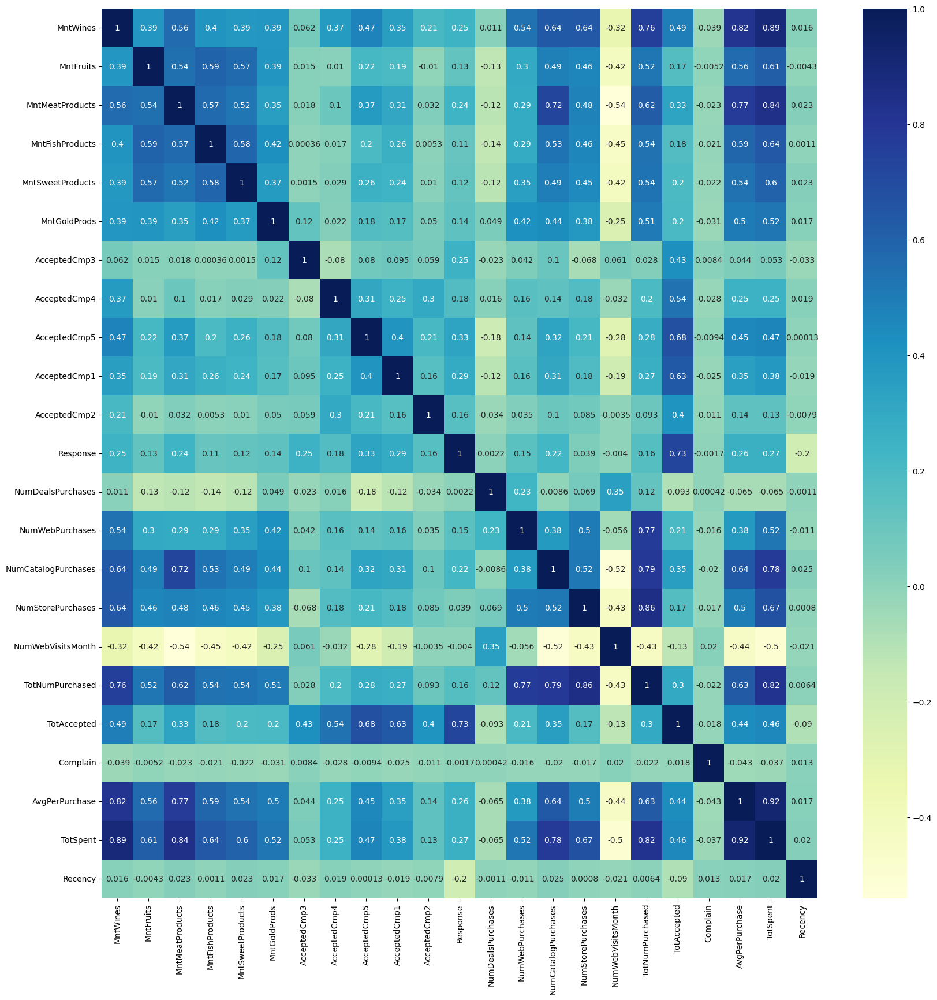

In [78]:
plt.figure(figsize  = (20, 20))

sns.heatmap(data_behavior.corr(), annot = True, cmap = "YlGnBu")

plt.show()

Looking at all the behavior columns, there are some notably strong correlations:

* TotSpent and MntWines
* TotSpent and MntMeatProducts
* TotSpent and NumCatalogPurchases
* TotSpent and TotNumPurchased

From this, we conclude that wine and meat were more expensive than other products and that more of these items were bought through the catalog than through other means.

* Catalog purchases and Meat
* TotNumPurchased and Num purchased through web, catalog, or store.

Meat purchases were mostly done through catalog and total number of purchases did not vary strongly by means (web, catalog, or store).

* Most of the Mnts were strongly correlated to each other.

Very little substitional effect: big shoppers in one category were also big shoppers in the next category.

On the other hand, Accepted 2, Accepted 3, and Recency, and Complain were all poorly correlated with anything, we will drop them.

In [79]:
data_behavior.drop(columns=['AcceptedCmp2', 'AcceptedCmp3', 'Recency','Complain'], inplace=True)

In [80]:
data_demo_acc.head()

,TotDependents,Age,FamilySize,Income,TotAccepted,NumDealsPurchases,Marital_Status_Married,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow,Education_Basic,Education_Graduation,Education_Master,Education_PhD
0,0,59.0,2,58138.0,1,3,False,True,False,False,False,True,False,False
1,2,62.0,4,46344.0,0,2,False,True,False,False,False,True,False,False
2,0,51.0,2,71613.0,0,1,False,False,True,False,False,True,False,False
3,1,32.0,3,26646.0,0,2,False,False,True,False,False,True,False,False
4,1,35.0,3,58293.0,0,5,True,False,False,False,False,False,False,True


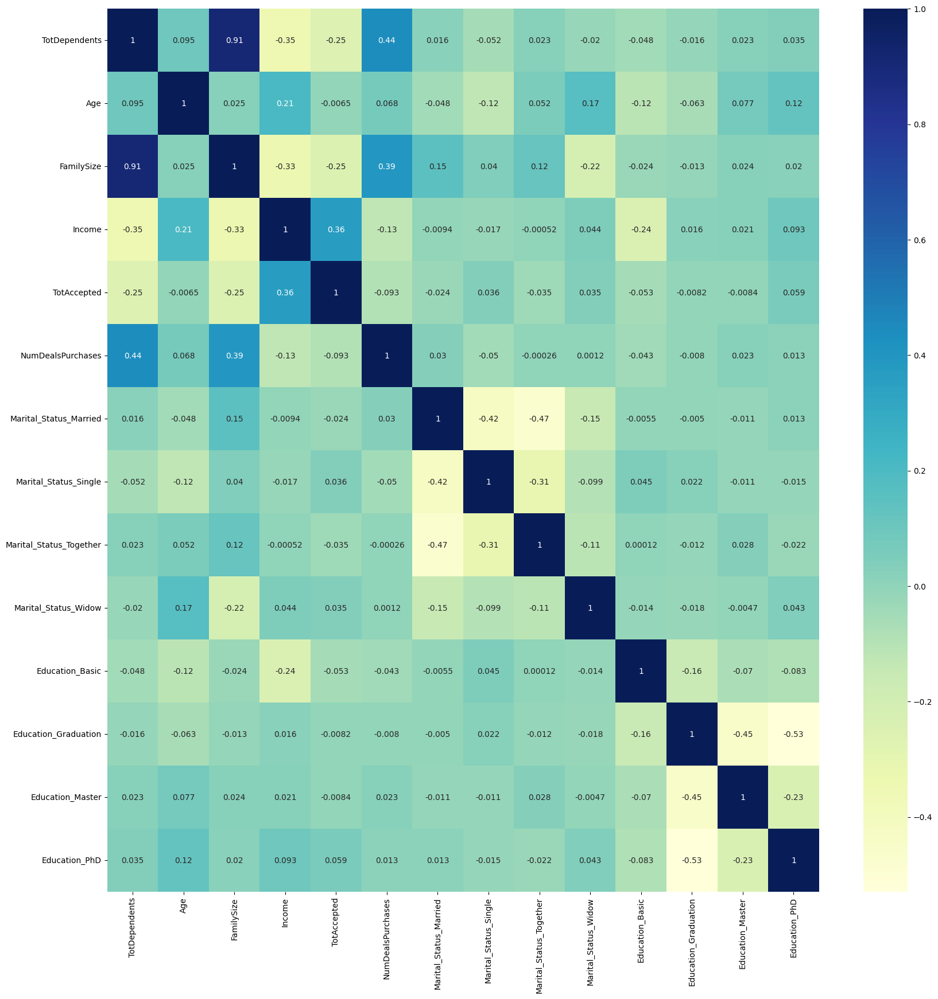

In [81]:
plt.figure(figsize  = (20, 20))

sns.heatmap(data_demo_acc.corr(), annot = True, cmap = "YlGnBu")

plt.show()

## **Applying T-SNE and PCA to the data to visualize the data distributed in 2 dimensions**

#### **Scaling the data**

In [82]:
scaler=StandardScaler()
data_behavior_scaled=pd.DataFrame(scaler.fit_transform(data_behavior), columns=data_behavior.columns)
data_behavior_scaled.head()

,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,Response,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,TotNumPurchased,TotAccepted,AvgPerPurchase,TotSpent
0,0.983781,1.551577,1.679702,2.462147,1.476500,0.843207,-0.28383,-0.28014,-0.262111,2.388846,0.349414,1.409304,2.510890,-0.550785,0.693904,1.313544,0.623174,1.201453,1.679417
1,-0.870479,-0.636301,-0.713225,-0.650449,-0.631503,-0.729006,-0.28383,-0.28014,-0.262111,-0.418612,-0.168236,-1.110409,-0.568720,-1.166125,-0.130463,-1.185022,-0.502560,-1.018283,-0.961275
2,0.362723,0.570804,-0.177032,1.345274,-0.146905,-0.038766,-0.28383,-0.28014,-0.262111,-0.418612,-0.685887,1.409304,-0.226541,1.295237,-0.542647,1.035926,-0.502560,0.047523,0.282673
3,-0.870479,-0.560857,-0.651187,-0.503974,-0.583043,-0.748179,-0.28383,-0.28014,-0.262111,-0.418612,-0.168236,-0.750450,-0.910898,-0.550785,0.281720,-0.907403,-0.502560,-0.949003,-0.918094
4,-0.389085,0.419916,-0.216914,0.155164,-0.001525,-0.556446,-0.28383,-0.28014,-0.262111,-0.418612,1.384715,0.329427,0.115638,0.064556,-0.130463,0.203070,-0.502560,-0.240366,-0.305254


In [83]:
data_behavior_scaled.describe().T

,count,mean,std,min,25%,50%,75%,max
MntWines,2240.0,-7.612958e-17,1.000223,-0.903167,-0.832592,-0.387599,0.595248,3.533390
MntFruits,2240.0,-2.379049e-17,1.000223,-0.661449,-0.636301,-0.460265,0.168436,4.343008
MntMeatProducts,2240.0,4.123686e-17,1.000223,-0.739813,-0.668912,-0.442913,0.288259,6.904261
MntFishProducts,2240.0,1.506731e-17,1.000223,-0.687068,-0.632140,-0.467355,0.228401,4.055064
MntSweetProducts,2240.0,-1.506731e-17,1.000223,-0.655733,-0.631503,-0.461894,0.143854,5.716737
MntGoldProds,2240.0,-1.110223e-17,1.000223,-0.844046,-0.671486,-0.383886,0.229660,6.096698
AcceptedCmp4,2240.0,5.551115e-17,1.000223,-0.283830,-0.283830,-0.283830,-0.283830,3.523233
AcceptedCmp5,2240.0,-3.013462e-17,1.000223,-0.280140,-0.280140,-0.280140,-0.280140,3.569640
AcceptedCmp1,2240.0,6.264830e-17,1.000223,-0.262111,-0.262111,-0.262111,-0.262111,3.815174
Response,2240.0,-7.295751e-17,1.000223,-0.418612,-0.418612,-0.418612,-0.418612,2.388846


In [84]:
# Creating copy of the data to store labels from each algorithm
data_behavior_scaled_copy = data_behavior_scaled.copy(deep = True)

### **Applying PCA**

In [85]:
# Defining the number of principal components to generate
n = data_behavior_scaled.shape[1]
print("Max number of principal components", n)

# Finding principal components for the data
cols=['PC1','PC2']
pca1 = PCA(n_components = n, random_state = 1)
data_pca = pd.DataFrame(pca1.fit_transform(data_behavior_scaled))
#transformed_data=pd.DataFrame(data_pca, columns=cols)

# The percentage of variance explained by each principal component
exp_var1 = pca1.explained_variance_ratio_

Max number of principal components 19


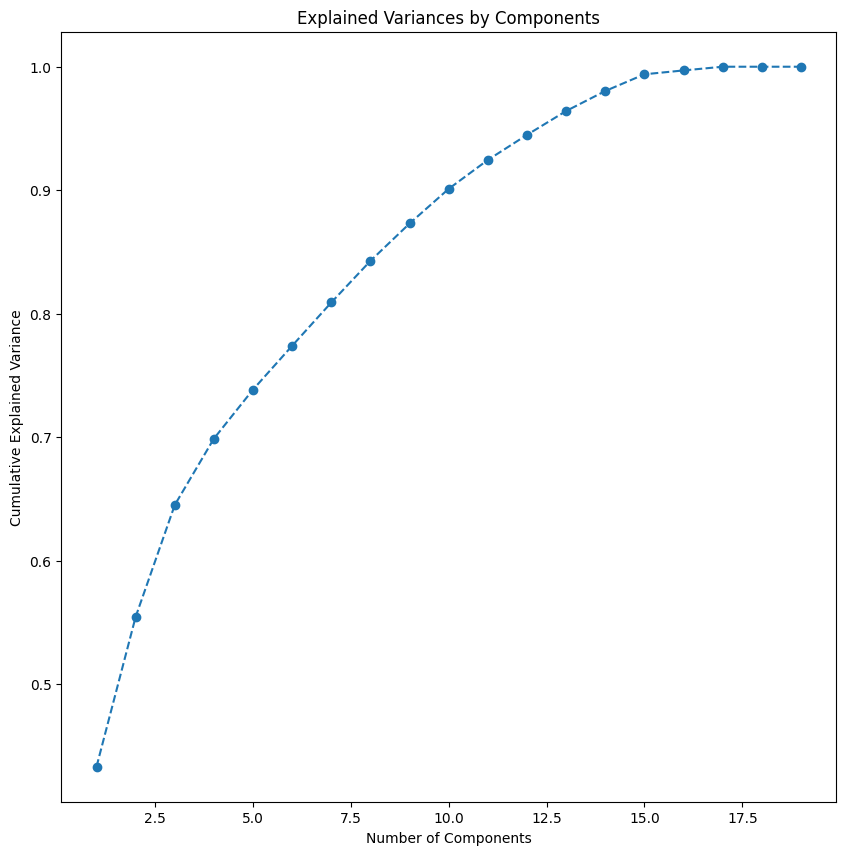

In [86]:
# Visualize the explained variance by individual components
plt.figure(figsize = (10, 10))

plt.plot(range(1, n+1), pca1.explained_variance_ratio_.cumsum(), marker = 'o', linestyle = '--')

plt.title("Explained Variances by Components")

plt.xlabel("Number of Components")

plt.ylabel("Cumulative Explained Variance")

plt.show()

In [87]:
# Find the least number of components that can explain more than 70% variance
sum = 0

for ix, i in enumerate(exp_var1):

    sum = sum + i
    print(i, sum)
    if(sum>0.70):
        print("Number of PCs that explain at least 70% variance: ", ix + 1)
        break

0.43315864706841356 0.43315864706841356
0.12136306680420306 0.5545217138726166
0.09061677039937804 0.6451384842719947
0.05372784202593959 0.6988663262979343
0.039727082771396215 0.7385934090693306
Number of PCs that explain at least 70% variance:  5


In [88]:
colsall=[]
for i in range(1,ix+2):
  colsall.append("PC"+ str(i))
print(colsall)

['PC1', 'PC2', 'PC3', 'PC4', 'PC5']


In [89]:
pc1 = pd.DataFrame(np.round(pca1.components_.T[:, 0:ix+1], 2), index = data_behavior_scaled.columns, columns = colsall)
pc1

,PC1,PC2,PC3,PC4,PC5
MntWines,0.29,0.08,0.18,0.25,0.13
MntFruits,0.23,-0.18,-0.17,-0.21,-0.15
MntMeatProducts,0.28,-0.06,-0.17,-0.02,0.40
MntFishProducts,0.24,-0.18,-0.18,-0.20,-0.17
MntSweetProducts,0.23,-0.16,-0.15,-0.19,-0.29
MntGoldProds,0.20,-0.12,0.11,-0.32,-0.21
AcceptedCmp4,0.10,0.36,0.17,0.48,-0.19
AcceptedCmp5,0.18,0.35,-0.14,0.11,0.02
AcceptedCmp1,0.16,0.32,-0.10,-0.09,-0.40
Response,0.11,0.40,0.03,-0.51,0.23


Let's look at a plot of the first two of these:

<Axes: xlabel='PC1', ylabel='PC2'>

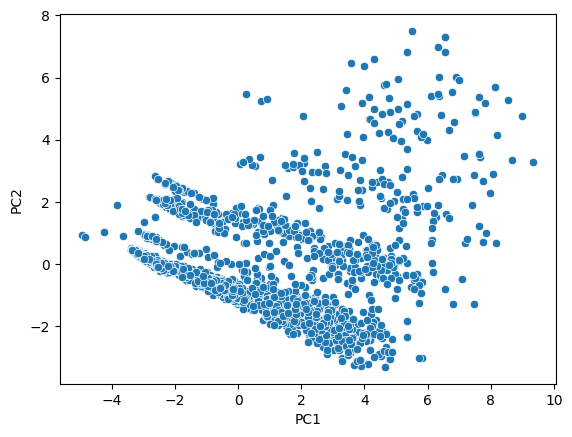

In [90]:
pca2 = PCA(n_components = 2, random_state = 2)
data_pca = pca2.fit_transform(data_behavior_scaled)
transformed_data = pd.DataFrame(data_pca,  columns = cols)
sns.scatterplot(transformed_data, x='PC1', y='PC2')

We note that PCA's first two components - comprising 41% and 12% of the variance respectively, of the 72% explained -  do produce interesting patterns that we expect to come out in our clustering algorithms.

**Think about it:**
- Should we apply clustering algorithms on the current data or should we apply PCA on the data before applying clustering algorithms? How would this help?

**Observation and Insights:**

**First PCA dimension**: largely centered around how much the customer spends overall.

**Second PCA dimension**: mostly relates to how targettable the customer is to marketing campaigns, this is obviously a highly useful dimension to know.  

**Third PCA dimension**: largely about website usage and responsiveness to deals.

The other PCA dimensions don't have an easily interpretatable meaning beyond specific products being bought (wine vs. meat respectively).  

Knowing this, we can start to make sense of our plot above.  We note a gap in the lower left corner of the plot for the first 2 PCA components. This corner represents the customers who would be smaller spenders but are also targetable by marketing campaigns.  The emptiness of this corner reflects that these customers are not discretionary spenders and can't be recruited by marketing campaigns. The straight lines in this part of the chart reflect that response to campaigns is strongly limited by disposible income.

### **Applying T-SNE**

In [91]:
#trying various values of perplexity
#commenting out for reruns
'''for i in range(5, 65, 7):
    tsne = TSNE(n_components = 2, random_state = 2, perplexity = i)

    data_tsne = tsne.fit_transform(data_behavior_scaled)

    data_tsne = pd.DataFrame(data_tsne)

    data_tsne.columns = ['X1','X2']

    plt.figure(figsize = (7,7))

    sns.scatterplot(x = 'X1', y = 'X2', data = data_tsne)

    plt.title("perplexity = {}".format(i))'''

'for i in range(5, 65, 7):\n    tsne = TSNE(n_components = 2, random_state = 2, perplexity = i)\n\n    data_tsne = tsne.fit_transform(data_behavior_scaled)\n\n    data_tsne = pd.DataFrame(data_tsne)\n\n    data_tsne.columns = [\'X1\',\'X2\']\n\n    plt.figure(figsize = (7,7))\n\n    sns.scatterplot(x = \'X1\', y = \'X2\', data = data_tsne)\n\n    plt.title("perplexity = {}".format(i))'

**Observation and Insights:**
Most tSNE work at perplexity > 33 seems to return similiar clustering topology: one large "continent" in the lower X1 values (bound by x2=-5/2*x1+80) and a chain of maybe 3 main islands for larger X2. Let's stick with perplexity =33.

Text(0.5, 1.0, 'perplexity = 33')

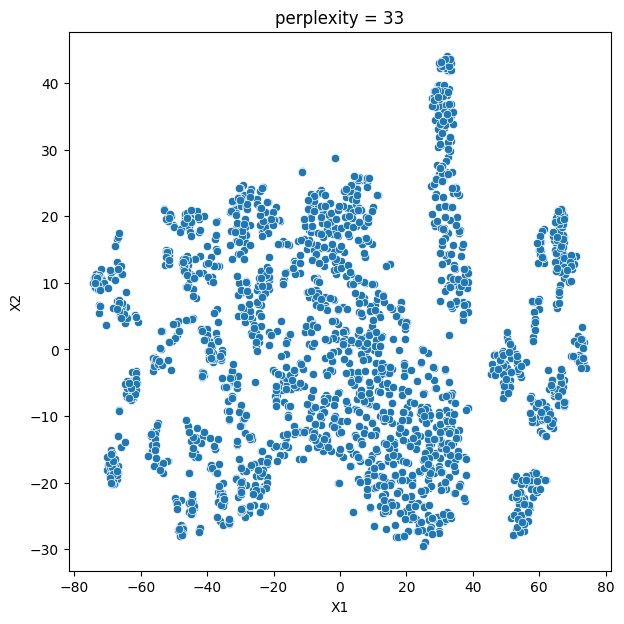

In [92]:
tsne = TSNE(n_components = 2, random_state = 2, perplexity = 33)

data_tsne = tsne.fit_transform(data_behavior_scaled)

data_tsne = pd.DataFrame(data_tsne)

data_tsne.columns = ['X1','X2']

plt.figure(figsize = (7,7))

sns.scatterplot(x = 'X1', y = 'X2', data = data_tsne)

plt.title("perplexity = {}".format(33))

In [93]:
# Let's assign points to 4 different groups
def grouping(x):
    first_component = x['X1']

    second_component = x['X2']

    if (second_component < -5/2*first_component + 80):
      return 'group 1'

    elif first_component < 40:
      return 'group_2'

    elif (second_component < -15):
        return 'group_3'

    else:
        return 'group_4'

In [94]:
data_tsne['groups'] = data_tsne.apply(grouping, axis = 1)

<Axes: xlabel='X1', ylabel='X2'>

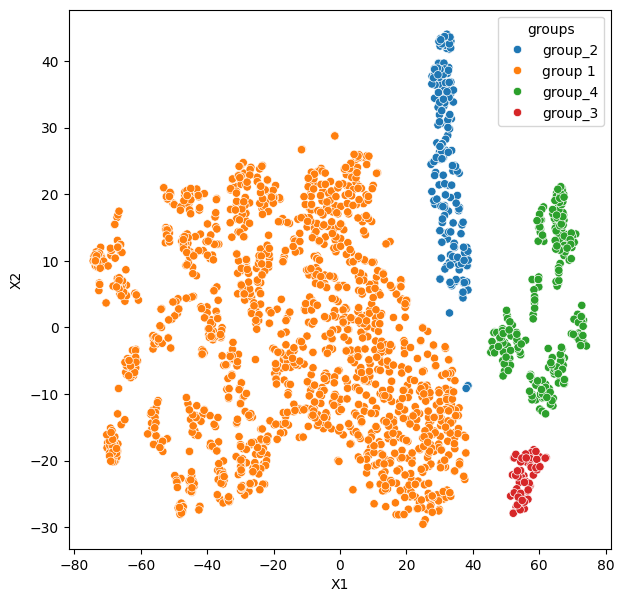

In [95]:
# Scatter plot for two components with hue
plt.figure(figsize = (7, 7))

sns.scatterplot(x = 'X1', y = 'X2', data = data_tsne, hue = 'groups')

In [96]:
#data_tsne.head()
data_tsne['groups'].value_counts()

groups
group 1    1708
group_4     259
group_2     206
group_3      67
Name: count, dtype: int64

This highly uneven splitting of group is not ideal.  Group 1, for instance, contains 76% of all customers.

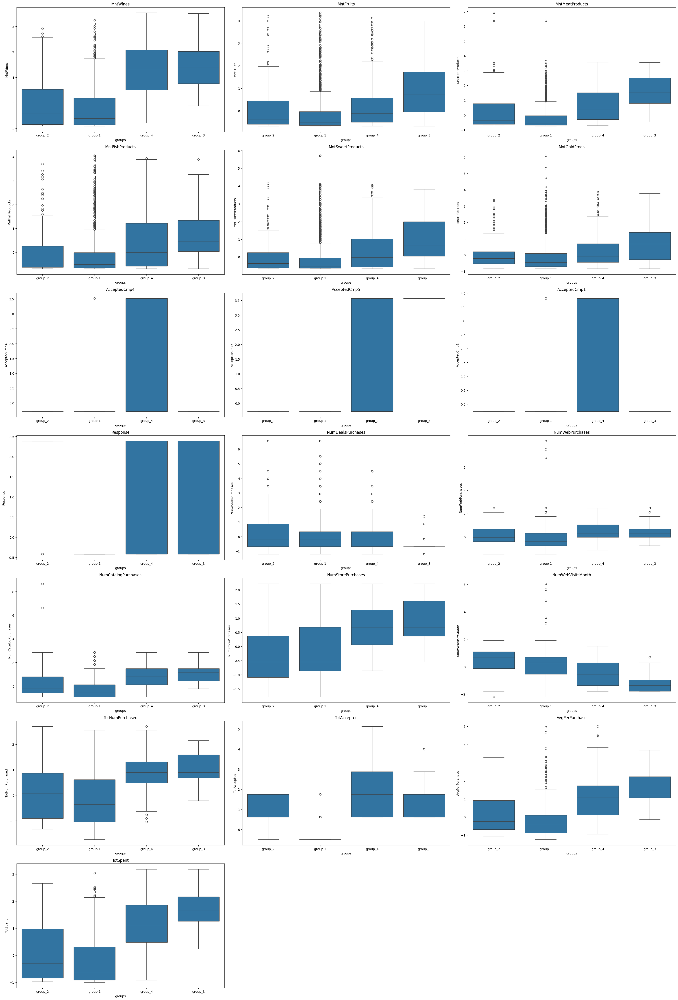

In [97]:
all_col = data_behavior_scaled.columns[:].tolist()

plt.figure(figsize = (30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(8, 3, i + 1)

    sns.boxplot(y=data_behavior_scaled[variable], x=data_tsne['groups'])

    plt.tight_layout()

    plt.title(variable)

plt.show()

In [98]:
# importing plotly
import plotly.express as px

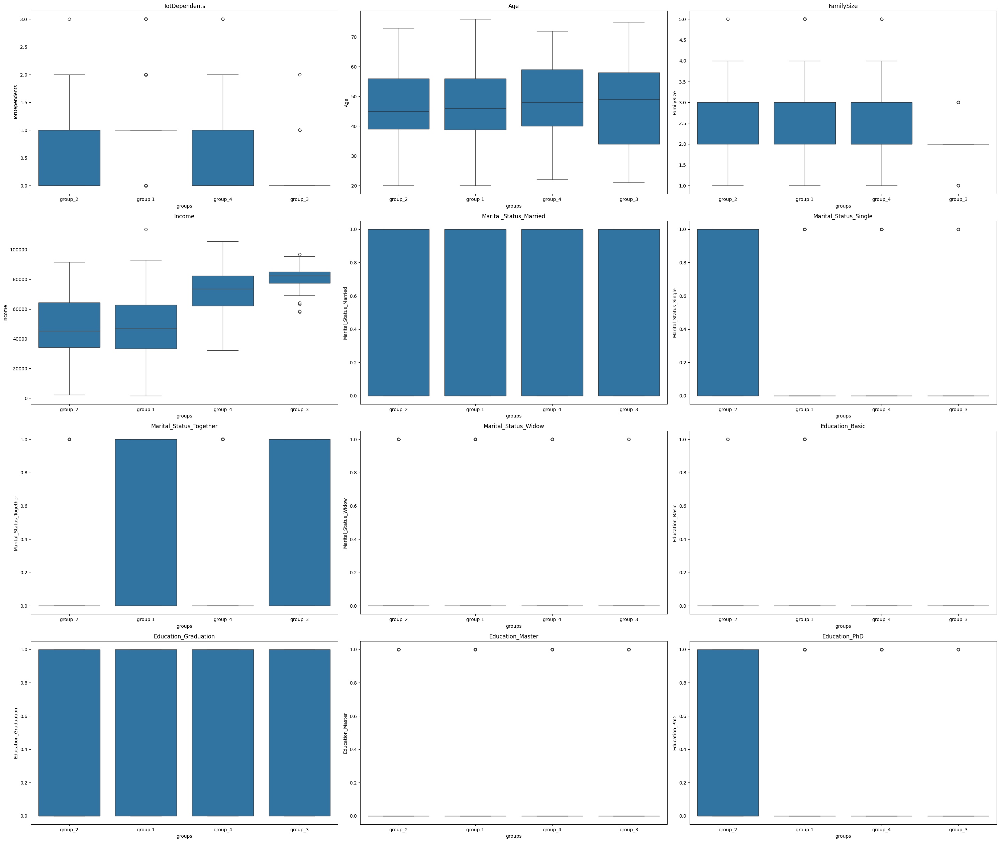

In [99]:
all_col = data_demo.columns[:].tolist()

plt.figure(figsize = (30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(8, 3, i + 1)

    sns.boxplot(y=data_demo[variable], x=data_tsne['groups'])
    #px.box(data_demo, y=data_demo[variable], x=data_tsne['groups'], points="all")
    plt.tight_layout()

    plt.title(variable)

plt.show()

The strongest separation seems to happen by number of web visits:
* **Group 2** is Pepe the Poor Pennypincher. He visits the website the most. He spends the least on everything, but is the most responsive to special deals.  This is consistent with his income being the lowest.  He doesn't have spare money to spend, but his time is cheap enough that he can "window shop" the website until a deal comes.
* **Group 1** is the second largest web user group, but also 76% of all customers.  He also uses the catalog less and buys less meat than others. Unfortunately, the amount of outliers in Group 1 makes it not very useful for marketing.
* **Group 4** uses the website a lot less. Group 4 is sharply delineated by the people who responded to campaigns, making this person Mike the Marketable.  Mike is a top consumer of wine so targeting him is an effective means to clear wine inventory.
* **Group 3** is the most specific cluster and it's Grandpa Simpson. He uses the website the least and likes to come to the store to buy lots of fruits, meat, and sweet things. He buys the most of everything, except for wine, for which the top shopper is Group 4.

## **K-Means**

**Think About It:**

- How do we determine the optimal K value from the elbow curve?
- Which metric can be used to determine the final K value?

### **Applying KMeans on the PCA data and visualize the clusters**

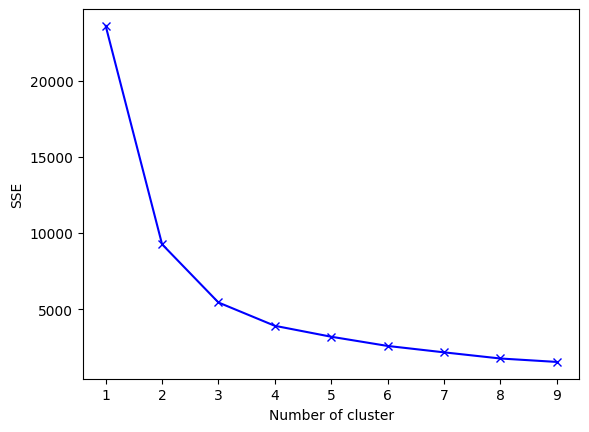

In [100]:
# Empty dictionary to store the SSE for each value of K
sse = {}

# Iterate for a range of Ks and fit the scaled data to the algorithm.
# Use inertia attribute from the clustering object and store the inertia value for that K
for k in range(1, 10):
    kmeans = KMeans(n_clusters = k, random_state = 1).fit(data_pca)

    sse[k] = kmeans.inertia_

# Elbow plotsil
plt.figure()

plt.plot(list(sse.keys()), list(sse.values()), 'bx-')

plt.xlabel("Number of cluster")

plt.ylabel("SSE")

plt.show()

Given the sharp elbow at k=3, 3 clusters seems ideal.

0.5823348058088715
0.5961512301509109
0.5185893378108656
0.5147963464217481
0.5336193717245035
0.5003371759584443
0.5374491442749475
0.5410690201481569


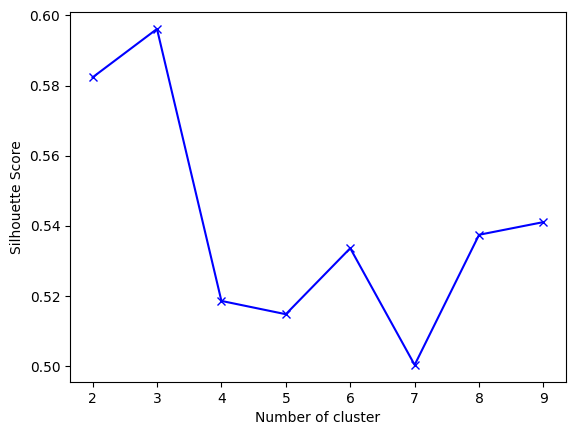

In [101]:
# Empty dictionary to store the Silhouette score for each value of K
sc = {}

# Iterate for a range of Ks and fit the scaled data to the algorithm. Store the Silhouette score for that K
for k in range(2, 10):
    kmeans = KMeans(n_clusters = k, random_state = 1).fit(data_pca)

    labels = kmeans.predict(data_pca)

    sc[k] = silhouette_score(data_pca, labels)
    print(silhouette_score(data_pca, labels))

# Elbow plot
plt.figure()

plt.plot(list(sc.keys()), list(sc.values()), 'bx-')

plt.xlabel("Number of cluster")

plt.ylabel("Silhouette Score")

plt.show()

k=3 is our best clustering for k means.

In [102]:
cols = ['PC1', 'PC2', 'PC3']
pca2 = PCA(n_components = 3, random_state = 1)
data_pca = pca2.fit_transform(data_behavior_scaled)
transformed_data = pd.DataFrame(data_pca,  columns = cols)

### **Cluster Profiling**

In [103]:
transformed_data_copy = data_behavior_scaled.copy(deep = True)

In [104]:
kmeans = KMeans(n_clusters = 3, random_state = 1)
kmeans_trans = KMeans(n_clusters = 3, random_state = 1)
kmeans.fit(data_behavior_scaled)
kmeans_trans.fit(transformed_data)
# Adding predicted labels to the original data and the scaled data
data_behavior_scaled_copy['KMeans_Labels'] = kmeans.predict(data_behavior_scaled)
transformed_data_copy['KMeans_Labels'] = kmeans_trans.predict(transformed_data)
data['KMeans_Labels'] = kmeans.predict(data_behavior_scaled)
transformed_data['KMeans_Labels'] = kmeans_trans.predict(transformed_data)

In [105]:
data['KMeans_Labels'].value_counts()

KMeans_Labels
0    1217
2     803
1     220
Name: count, dtype: int64

<Axes: xlabel='PC1', ylabel='PC2'>

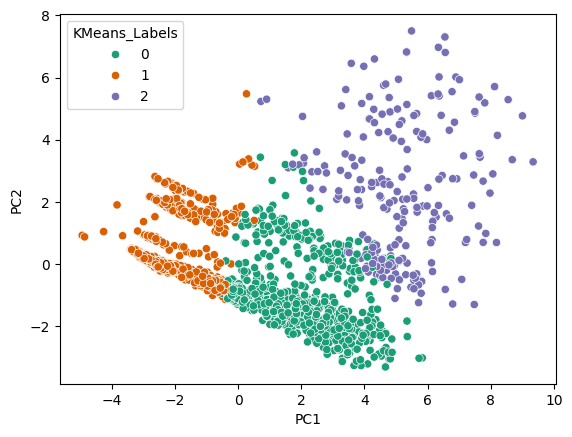

In [106]:
sns.scatterplot(y='PC2', x='PC1', data=transformed_data,  hue='KMeans_Labels', palette='Dark2')

<Axes: xlabel='KMeans_Labels', ylabel='NumDealsPurchases'>

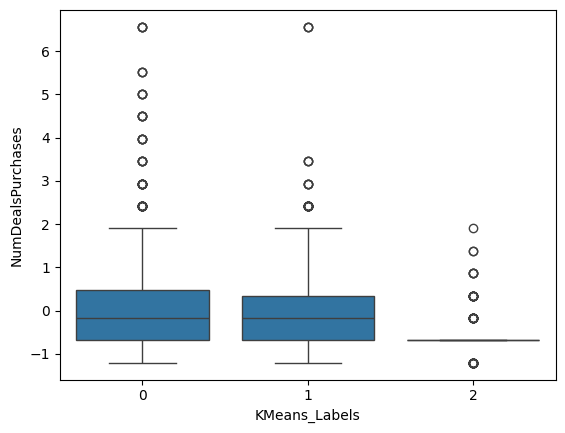

In [107]:
all_col = data_behavior_scaled.columns[:].tolist()

#plt.figure(figsize = (30, 50))

'''for i, variable in enumerate(all_col):
    plt.subplot(8, 3, i + 1)

    sns.boxplot(y=data_behavior_scaled[variable], x=transformed_data['KMeans_Labels'])

    plt.tight_layout()

    plt.title(variable)

plt.show()'''
sns.boxplot(y=data_behavior_scaled['NumDealsPurchases'], x=transformed_data['KMeans_Labels'])

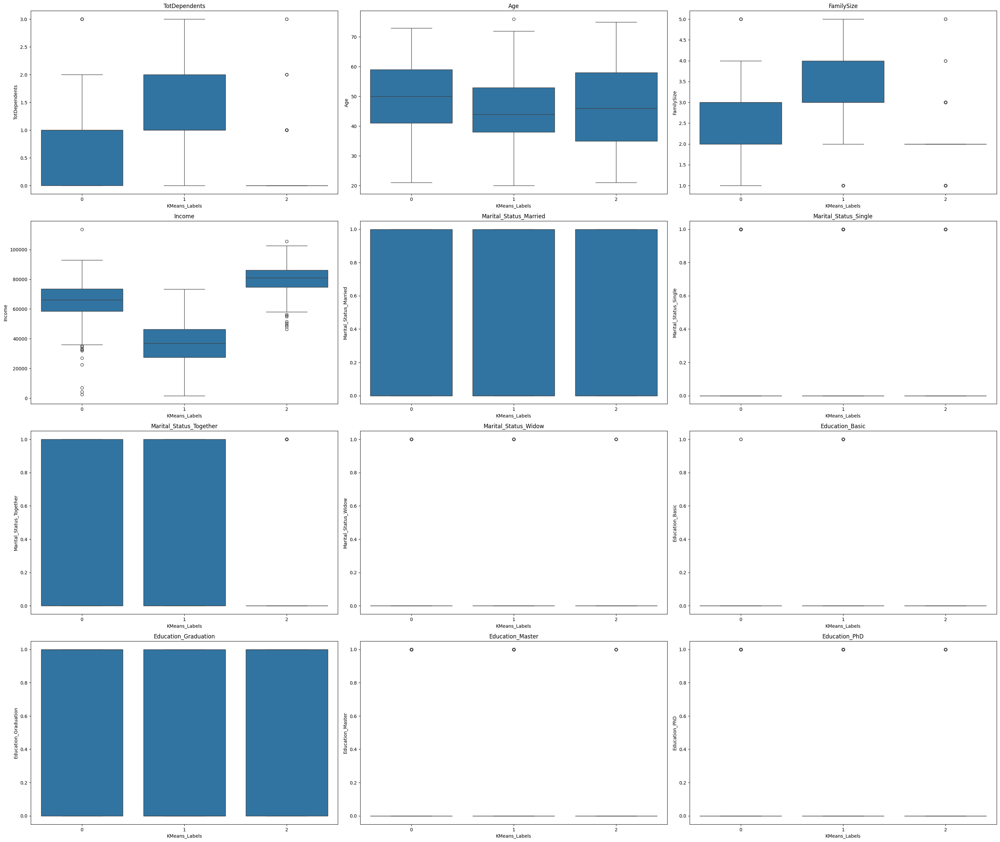

In [108]:
all_col = data_demo.columns[:].tolist()

plt.figure(figsize = (30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(8, 3, i + 1)

    sns.boxplot(y=data_demo[variable], x=transformed_data['KMeans_Labels'])

    plt.tight_layout()

    plt.title(variable)

plt.show()

**Observations and Insights:**

k=3 provided 3 clusters of data, but groups 0 and 1 don't split graphically as expected.  The most conspicuous split is by income: Groups 0, 1, and 2 are low, medium, and high-income, respectively.

### **Describe the characteristics of each cluster**
* Group 0: lowest income, larger family size, more dependents, lots of webvisits, lower spending across the board
* Group 1: middle income, medium family size, medium number of dependents, more catalog and store purchases
* Group 2: highest income, smallest family size and number of dependents, more catalog and store purchases.  Also, the only group to respond to campaigns, but doesn't use deals to buy,

**Think About It:**
- Are the K-Means profiles providing any deep insights into customer purchasing behavior or which channels they are using?
- What is the next step to get more meaningful insights?

**Summary of each cluster:**
We see a similiar grouping to what tSNE produced, in that groups are most strongly stratified by web visits and one group most strongly responds to campaingns

## **K-Medoids**

In [109]:
kmedo = KMedoids(n_clusters = 3, random_state = 5)
kmedo.fit(transformed_data)

data_behavior_scaled_copy['kmedoLabels'] = kmedo.predict(transformed_data)

data['kmedoLabels'] = kmedo.predict(transformed_data)
transformed_data['kmedoLabels']=kmedo.predict(transformed_data)

In [110]:
data['KMeans_Labels'].value_counts()

KMeans_Labels
0    1217
2     803
1     220
Name: count, dtype: int64

In [111]:
data.kmedoLabels.value_counts()

kmedoLabels
2    1079
1     582
0     579
Name: count, dtype: int64

Clusters are a bit more balanced than KMeans.  

### **Visualize the clusters using PCA**

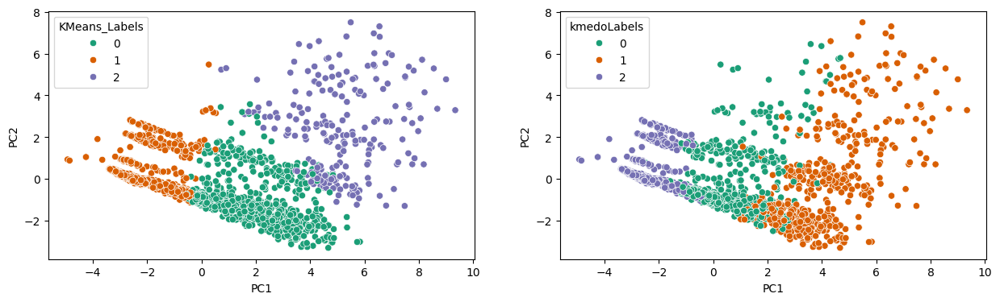

In [112]:
plt.figure(figsize = (15, 4))

plt.subplot(1, 2, 2)
sns.scatterplot(y='PC2', x='PC1', data=transformed_data,  hue='kmedoLabels', palette='Dark2')
plt.subplot(1, 2, 1)
sns.scatterplot(y='PC2', x='PC1', data=transformed_data,  hue='KMeans_Labels', palette='Dark2')
plt.show()

<Axes: xlabel='PC1', ylabel='PC2'>

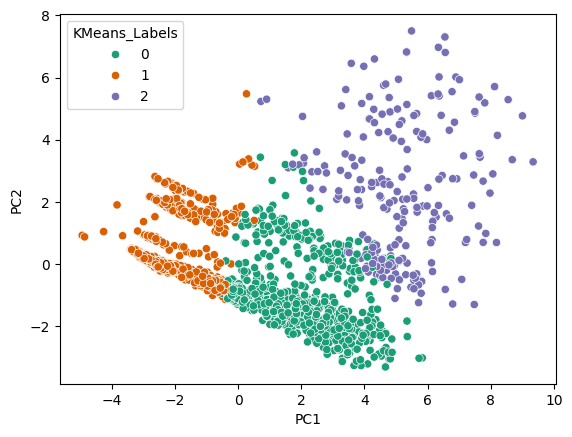

In [113]:
sns.scatterplot(y='PC2', x='PC1', data=transformed_data,  hue='KMeans_Labels', palette='Dark2')

Similiar clustering as before, mostly by income and amount spent, but with KMedoids, the left-most group grew from from 220 to 1079,the right-most group shrank from 802 to 582, while the middle group shrank from 1217 to 579.

0.4889265476721816
0.43059969439048595
0.2960122103355577
0.2982684918570989
0.3275626390263029
0.28114812409759826
0.2724570264059652
0.2910804108671857


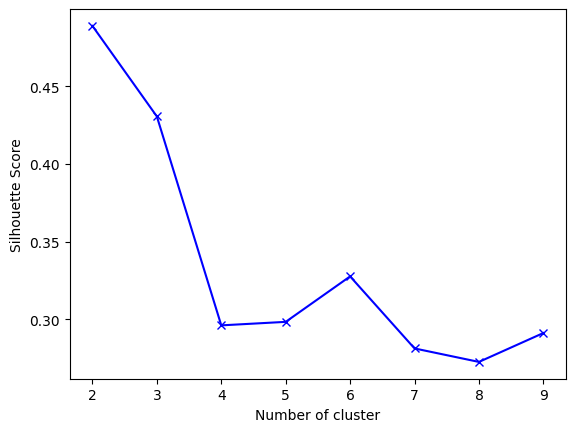

In [114]:
# Empty dictionary to store the Silhouette score for each value of K
sc = {}

# Iterate for a range of Ks and fit the scaled data to the algorithm. Store the Silhouette score for that K
for k in range(2, 10):
    kmeds = KMedoids(n_clusters = k, random_state = 3).fit(data_pca)

    labels = kmeds.predict(data_pca)

    sc[k] = silhouette_score(data_pca, labels)
    print(silhouette_score(data_pca, labels))

# Elbow plot
plt.figure()

plt.plot(list(sc.keys()), list(sc.values()), 'bx-')

plt.xlabel("Number of cluster")

plt.ylabel("Silhouette Score")

plt.show()

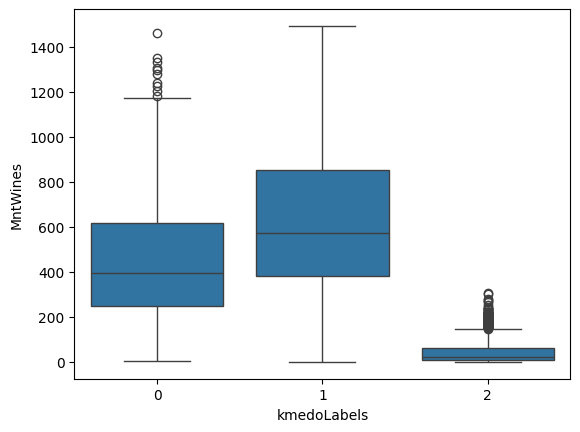

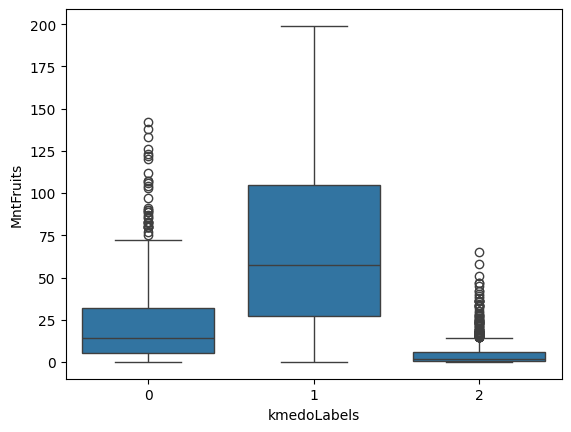

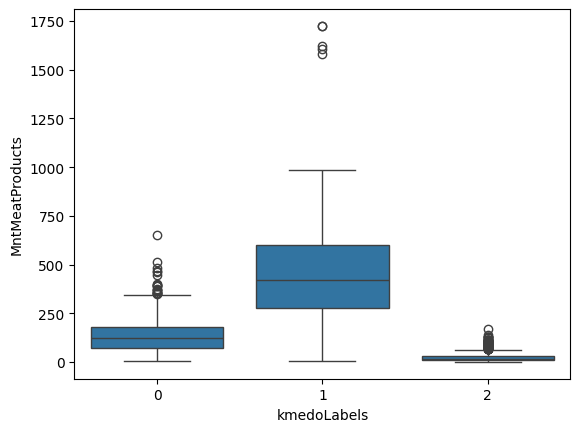

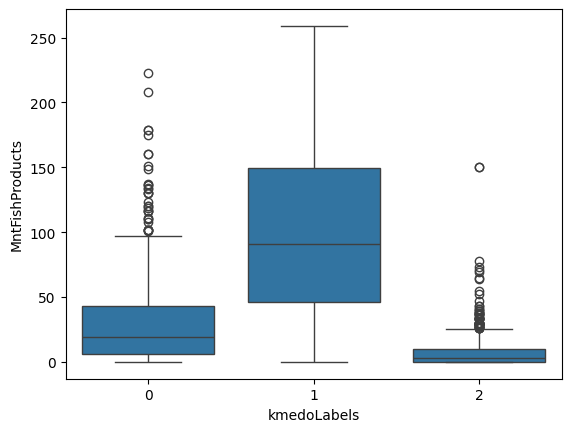

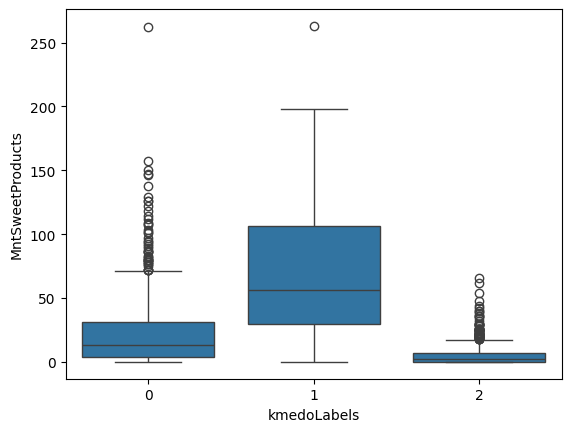

...

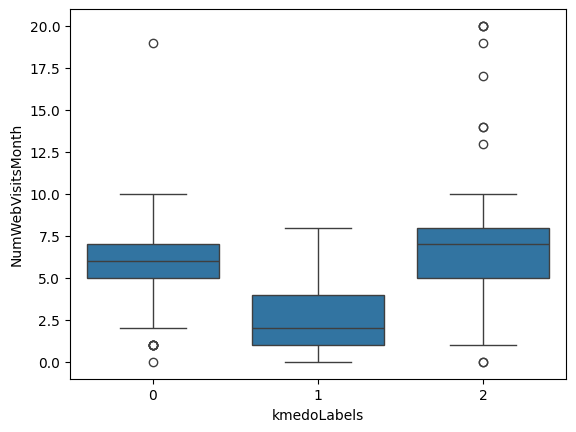

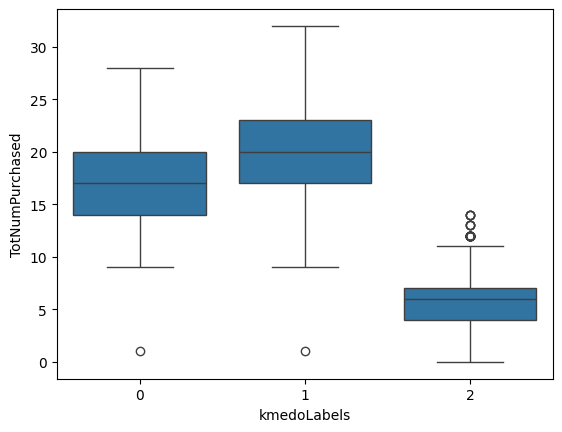

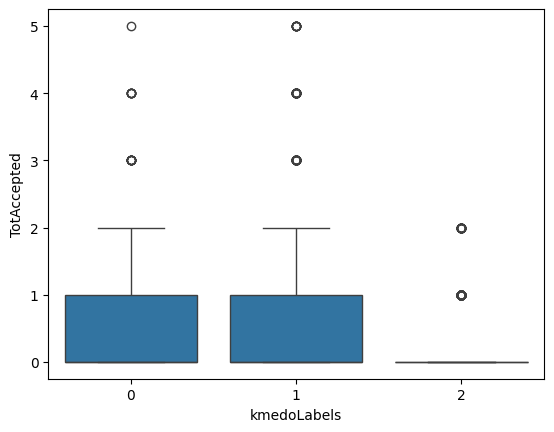

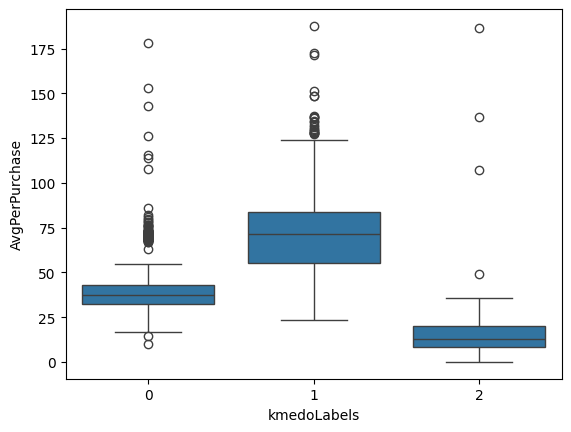

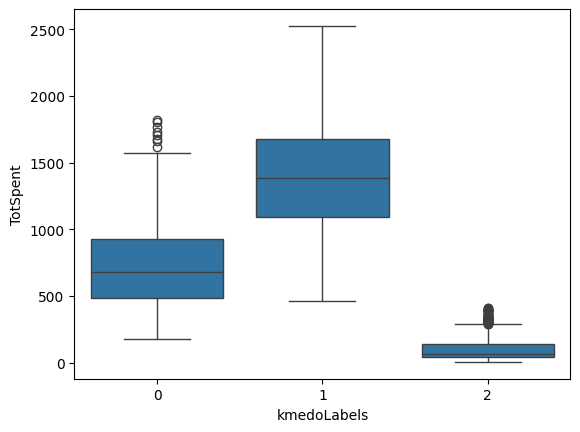

In [115]:
for col in  data_behavior.columns:
    sns.boxplot(x = 'kmedoLabels', y = col, data = data)

    plt.show()

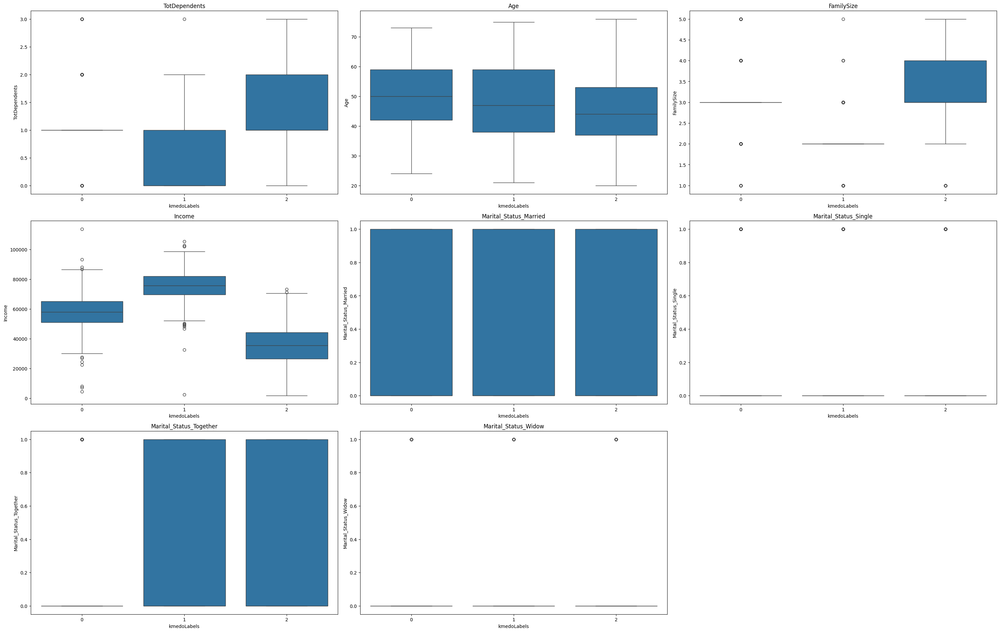

In [116]:
all_col = data_demo.columns[:-4].tolist()

plt.figure(figsize = (30, 50))

for i, variable in enumerate(all_col):
    plt.subplot(8, 3, i + 1)

    sns.boxplot(y=data_demo[variable], x=transformed_data['kmedoLabels'])

    plt.tight_layout()

    plt.title(variable)

plt.show()

### **Cluster Profiling**

**Observations and Insights:**

### **Characteristics of each cluster**

**Summary for each cluster:**

**Observations and Insights:**

## **Hierarchical Clustering**

- Find the Cophenetic correlation for different distances with different linkage methods.
- Create the dendrograms for different linkages
- Explore different linkages with each distance metric

In [117]:
from scipy.cluster.hierarchy import dendrogram, linkage

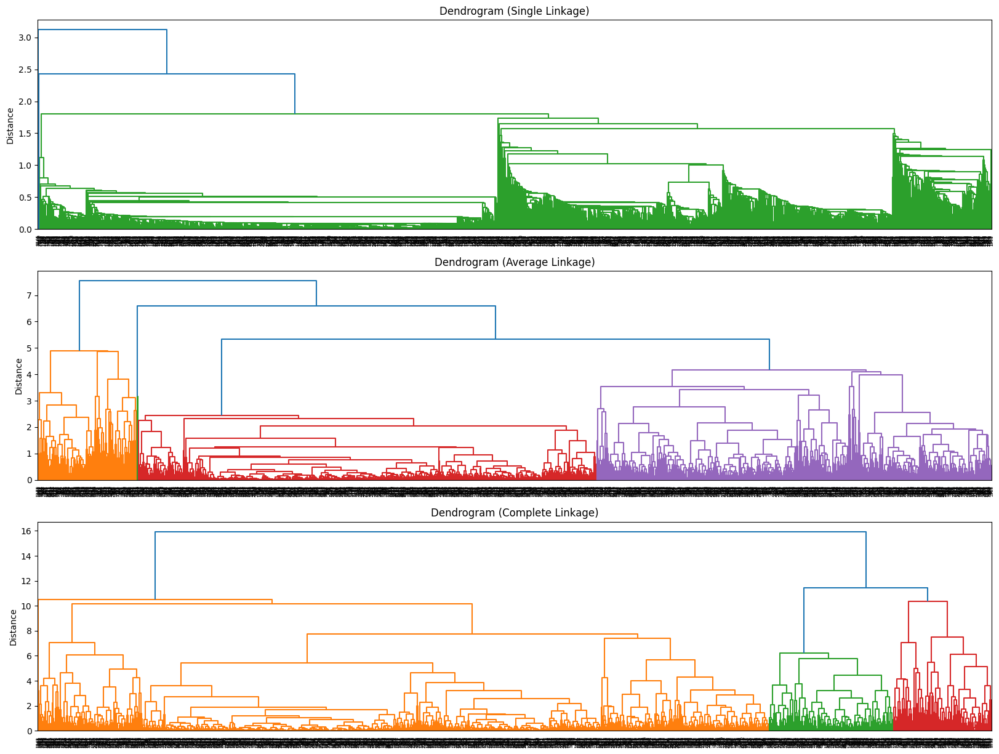

In [118]:
# The List of all linkage methods to check
methods = ['single',
           'average',
           'complete']

# Create a subplot image
fig, axs = plt.subplots(len(methods), 1, figsize = (20, 15))

# Enumerate through the list of all methods above, get linkage and plot dendrogram
for i, method in enumerate(methods):
    Z = linkage(transformed_data, metric = 'euclidean', method = method)

    dendrogram(Z, ax = axs[i]);

    axs[i].set_title(f'Dendrogram ({method.capitalize()} Linkage)')

    axs[i].set_ylabel('Distance')

**Think about it:**

* Single Linkage does not cluster well in this case.

* Complete Linkage does an okay job, but Average Linkage works the best for clustering separation.  Cutting at a distance of 5 gives us 4 cluters.  



- Can we clearly decide the number of clusters based on where to cut the dendrogram horizontally?
- What is the next step in obtaining number of clusters based on the dendrogram?
- Are there any distinct clusters in any of the dendrograms?

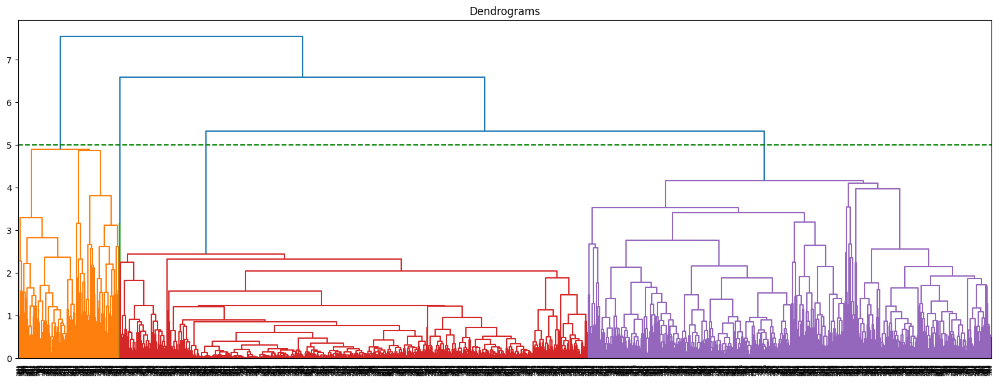

In [119]:
plt.figure(figsize = (20, 7))

plt.title("Dendrograms")

dend = dendrogram(linkage(transformed_data, method = 'average'))

plt.axhline(y = 5, color = 'g', linestyle = '--')

0.473625696192175
0.3605942512311247
0.47212100064634444
0.43642396685740936
0.42610924696389463
0.4340967897476519
0.43259411498859485
0.4177619564849529


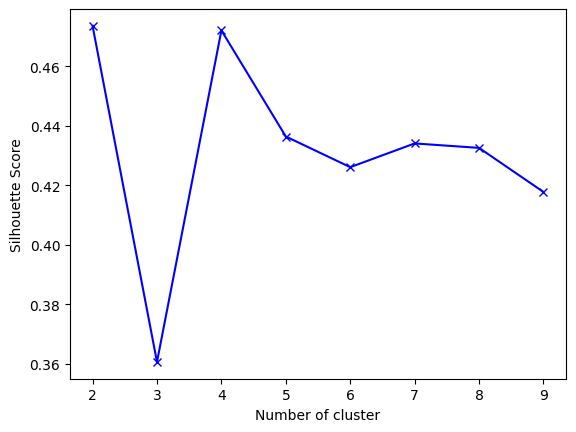

In [120]:
# Empty dictionary to store the Silhouette score for each value of K
sc = {}

# Iterate for a range of Ks and fit the scaled data to the algorithm. Store the Silhouette score for that K
for k in range(2, 10):
    hierarchical = AgglomerativeClustering(n_clusters = k, affinity = 'euclidean', linkage = 'average')
    hierarchical.fit(transformed_data)

    labels = hierarchical.labels_

    sc[k] = silhouette_score(data_pca, labels)
    print(silhouette_score(data_pca, labels))

# Elbow plot
plt.figure()

plt.plot(list(sc.keys()), list(sc.values()), 'bx-')

plt.xlabel("Number of cluster")

plt.ylabel("Silhouette Score")

plt.show()

In [121]:
# Clustering with 4 clusters
hierarchical = AgglomerativeClustering(n_clusters = 4, affinity = 'euclidean', linkage = 'average')

hierarchical.fit(transformed_data)

AgglomerativeClustering(affinity='euclidean', linkage='average', n_clusters=4)

In [122]:
data_behavior_scaled_copy['HCLabels'] = hierarchical.labels_
data_dums['HCLabels'] = hierarchical.labels_
data['HCLabels'] = hierarchical.labels_
transformed_data['HCLabels'] = hierarchical.labels_
data_demo['HCLabels'] = hierarchical.labels_

In [123]:
data.HCLabels.value_counts()

HCLabels
3    1077
1     927
0     233
2       3
Name: count, dtype: int64

### **Visualize the clusters using PCA**

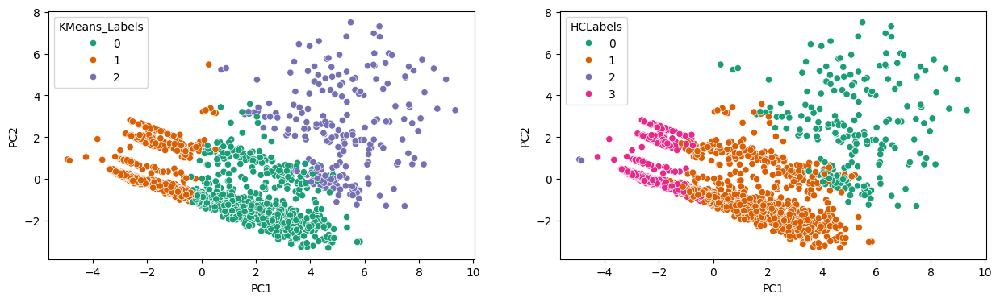

In [124]:
plt.figure(figsize = (15, 4))


plt.subplot(1, 2, 1)
sns.scatterplot(y='PC2', x='PC1', data=transformed_data,  hue='KMeans_Labels', palette='Dark2')
plt.subplot(1, 2, 2)
sns.scatterplot(y='PC2', x='PC1', data=transformed_data,  hue='HCLabels', palette='Dark2')
plt.show()

<Axes: xlabel='PC1', ylabel='PC2'>

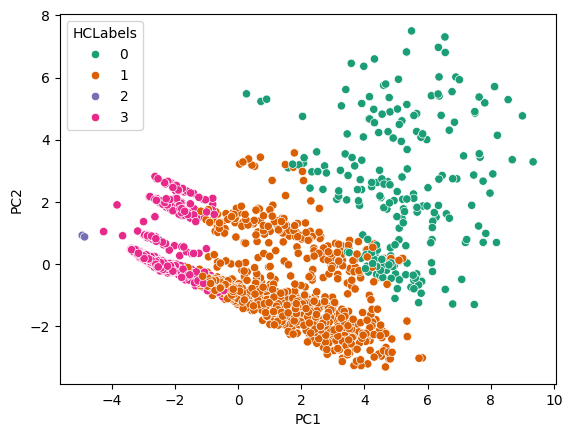

In [125]:
sns.scatterplot(y='PC2', x='PC1', data=transformed_data,  hue='HCLabels', palette='Dark2')

<Axes: xlabel='PC3', ylabel='PC1'>

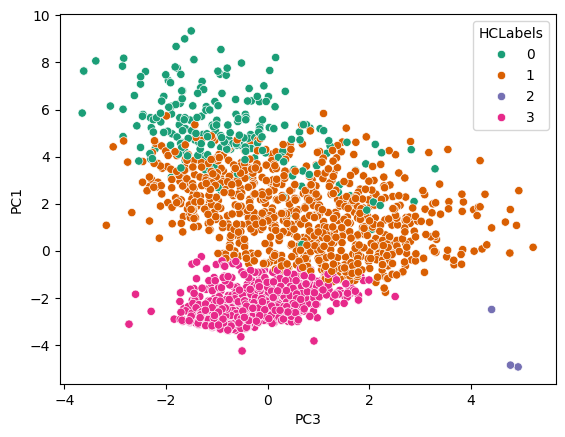

In [126]:
sns.scatterplot(y='PC1', x='PC3', data=transformed_data,  hue='HCLabels', palette='Dark2')

Results very similar to KMeans and KMedoids, in that we are mostly stratifying by how much the consumers spend. HC also located 3 uniquely targetable very high spenders in their own group in what we're calling "Group 2"

### **Cluster Profiling**

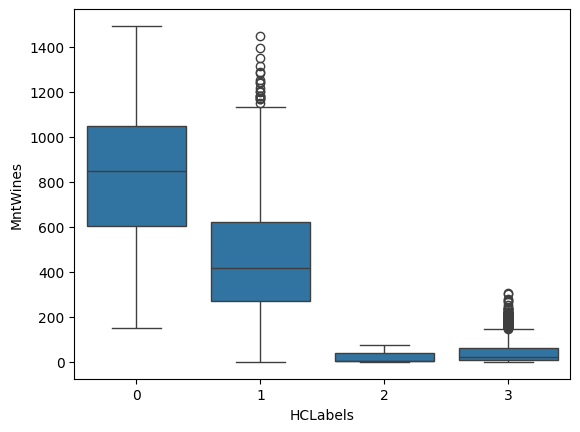

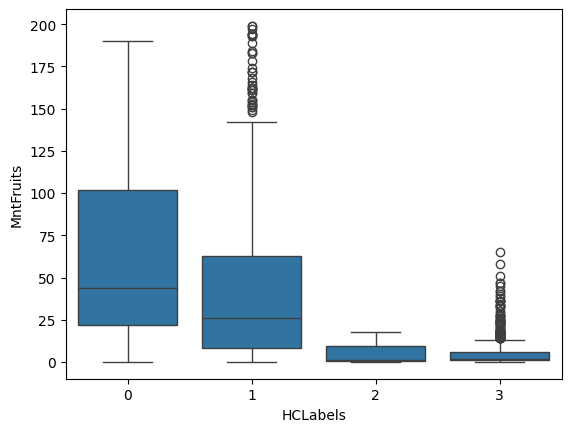

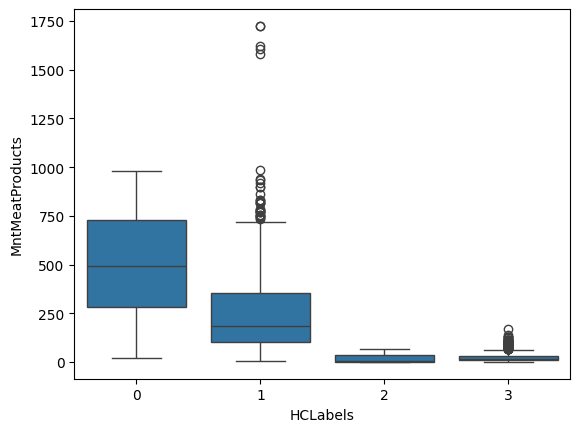

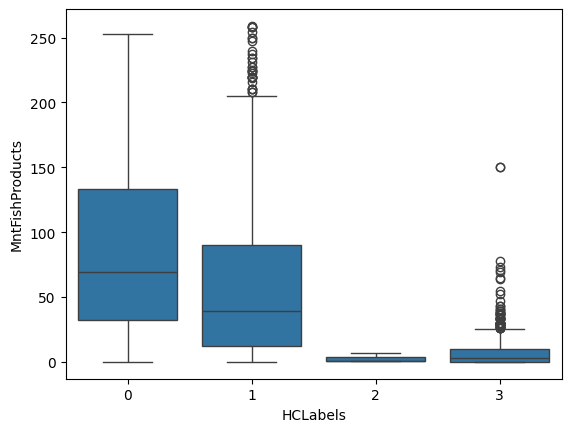

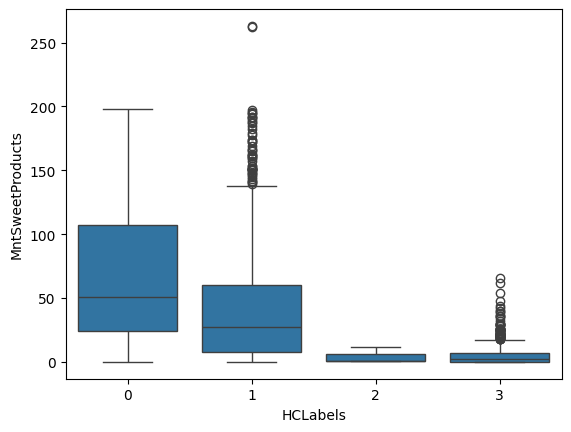

...

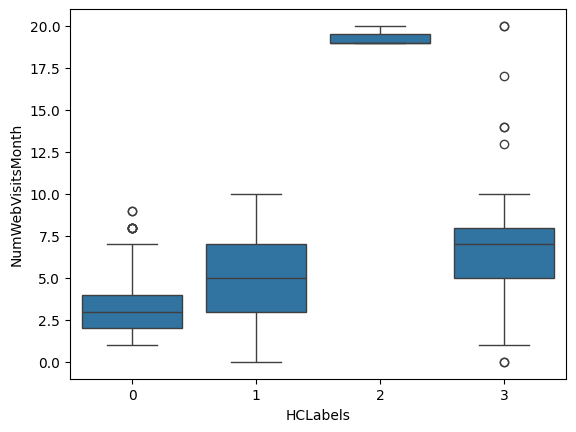

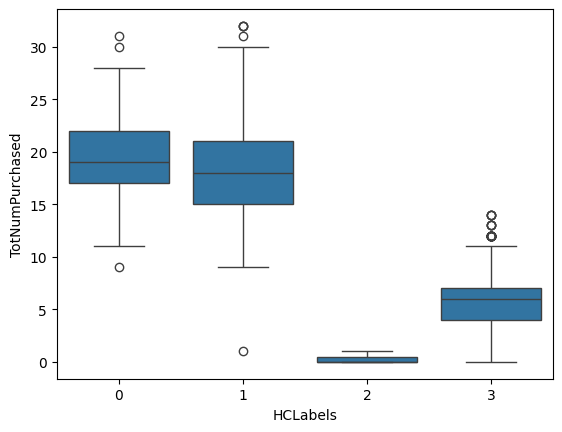

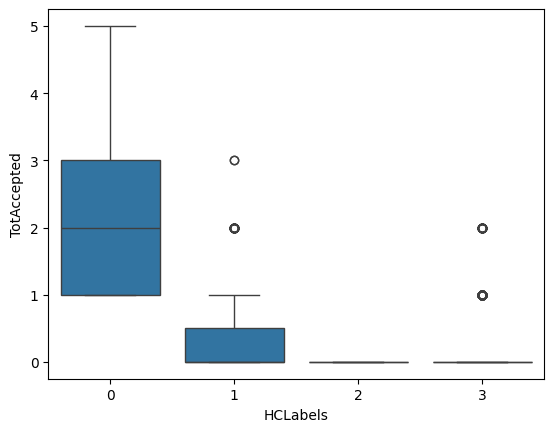

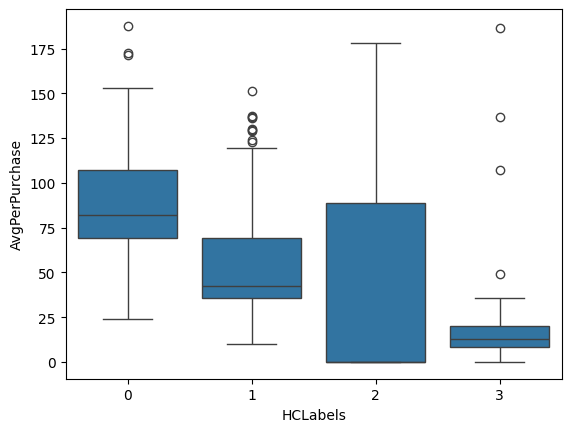

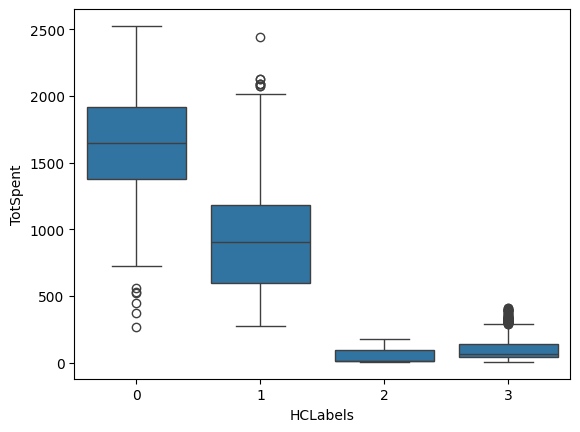

In [127]:
for col in data_behavior.columns:
    sns.boxplot(x = 'HCLabels', y = col, data = data)
    plt.show()

In [128]:
mean = round(data_dums.groupby('HCLabels').mean(), 2)

median = round(data_dums.groupby('HCLabels').median(), 2)

df_hierachical = pd.concat([mean, median], axis = 0)

df_hierachical.index = ['group_0 Mean', 'group_1 Mean', 'group_2 Mean', 'group_3 Mean', 'group_0 Median', 'group_1 Median', 'group_2 Median', 'group_3 Median']

#df_hierachical[data_behavior.columns].T
df_hierachical[data_behavior.columns].T

,group_0 Mean,group_1 Mean,group_2 Mean,group_3 Mean,group_0 Median,group_1 Median,group_2 Median,group_3 Median
MntWines,833.01,470.78,26.33,46.64,847.00,418.00,5.0,23.00
MntFruits,62.64,42.03,6.33,4.96,44.00,26.00,1.0,2.00
MntMeatProducts,495.08,251.17,23.33,23.87,490.00,183.00,3.0,15.00
MntFishProducts,88.24,60.06,3.00,7.25,69.00,39.00,1.0,3.00
MntSweetProducts,68.20,42.29,4.67,5.12,51.00,27.00,1.0,2.00
MntGoldProds,74.97,69.64,1.33,15.40,55.00,50.00,1.0,10.00
AcceptedCmp4,0.36,0.07,0.00,0.01,0.00,0.00,0.0,0.00
AcceptedCmp5,0.65,0.01,0.00,0.00,1.00,0.00,0.0,0.00
AcceptedCmp1,0.51,0.03,0.00,0.00,1.00,0.00,0.0,0.00
Response,0.60,0.11,0.00,0.08,1.00,0.00,0.0,0.00


**Group 2** Those 3 people fitting into Group2 Deal David.  Deal David is an online window shopper, waiting for a deal.  He is 5 times as likely to respond to a deal as anyone in any other category. And while he might spent a lot less overall, his average spent per purchase is more than almost any one else.  

**Group 0** (n=233, 10%) is Heavy Spender Henry. He buys more of more products than anyone else and he is *very* targetable with campaigns.

**Group 1** (n=927, 41%) is a bit thrifty. She's economical Esther. He spends more than Deal David from Group 2 and makes nearly as many purchases as Heavy Spender Henry, but tends to make cheaper purchases in virtually every category. Goes for deals.

**Group 3** (n=1077, 48%) is the largest group, with 1077 of our customers.  This is our Average Joe.  Joe does not respond to campaigns, does not buy very many items or spend very much.  Joe should be a last priority in marketing campaigns.  Goes for deals.

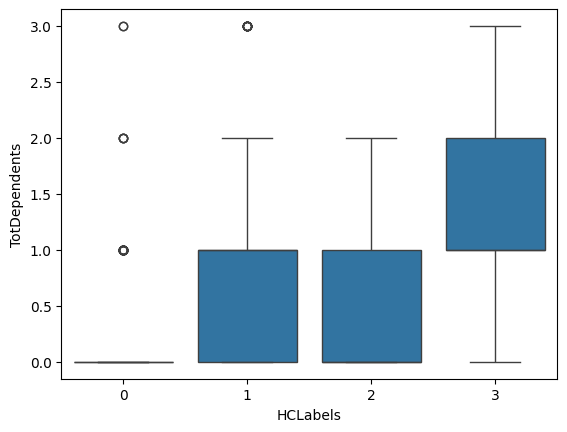

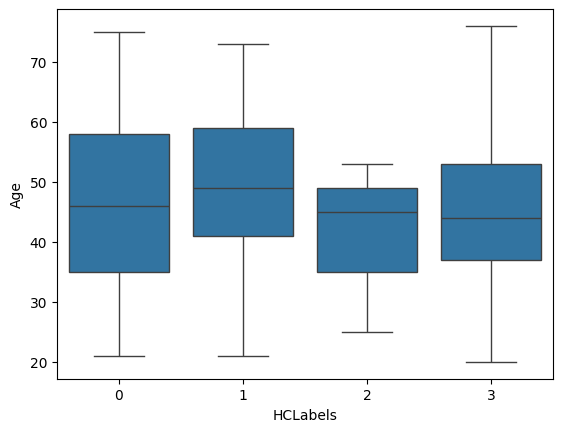

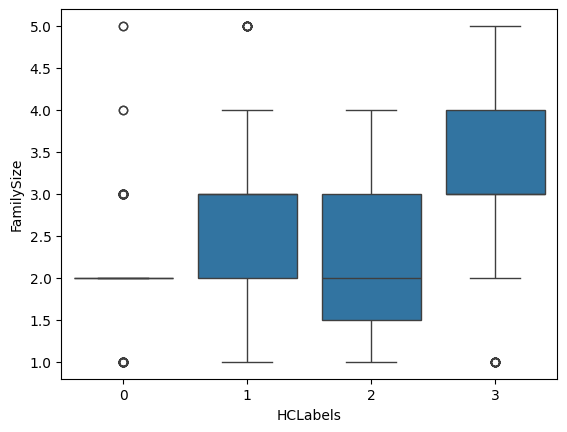

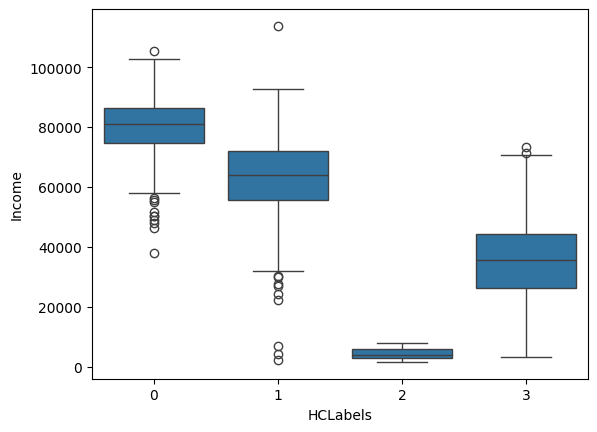

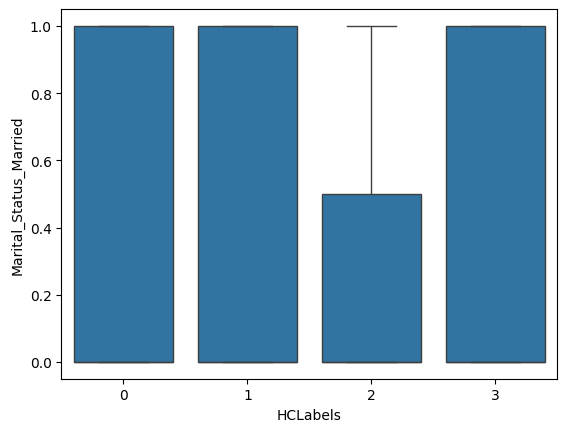

...

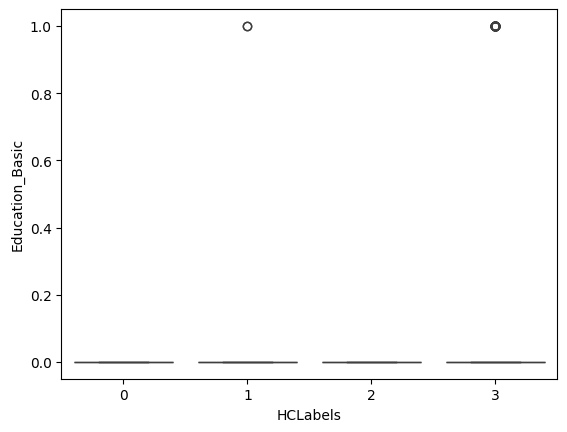

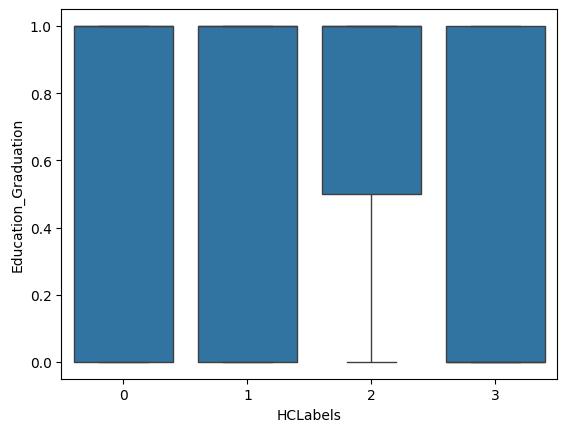

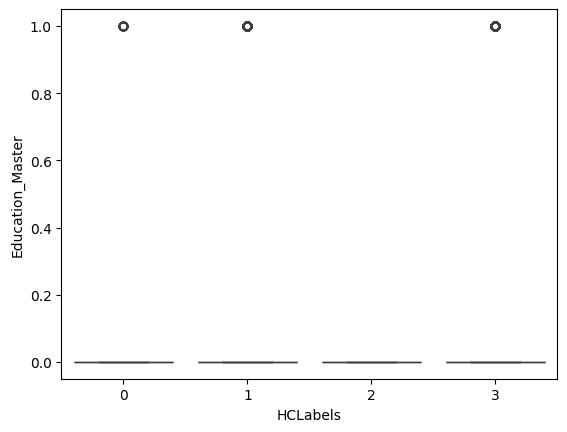

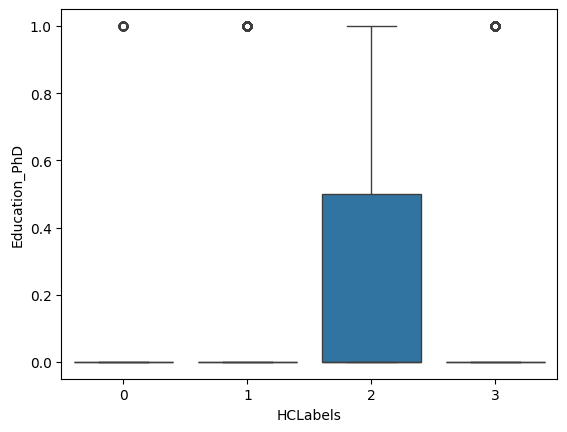

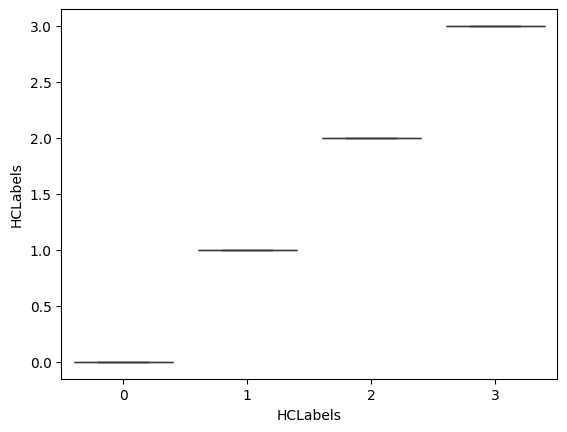

In [129]:
for col in data_demo.columns:
    sns.boxplot(x = 'HCLabels', y = col, data = data_demo)
    plt.show()

**Observations and Insights:**

### **Characteristics of each cluster**
* The very niche Deal David from Group 2 is single and highly educated (up to a PhD but has a very low income.  
* Heavy Spender Henry from Group 0 is high income, married, and has no children.  
* Economical Esther from Group 1 is married or cohabitating, fairly high income and older.
* Group 3 Average Joe is cohabitating or married, like Esther, is a lower income and a larger family.  

**Summary of each cluster:**

## **DBSCAN**

DBSCAN is a very powerful algorithm for finding high-density clusters, but the problem is determining the best set of hyperparameters to use with it. It includes two hyperparameters, `eps`, and `min samples`.

Since it is an unsupervised algorithm, you have no control over it, unlike a supervised learning algorithm, which allows you to test your algorithm on a validation set. The approach we can follow is basically trying out a bunch of different combinations of values and finding the silhouette score for each of them.
### **Hyperparameter Tuning (eps and min_samples)**

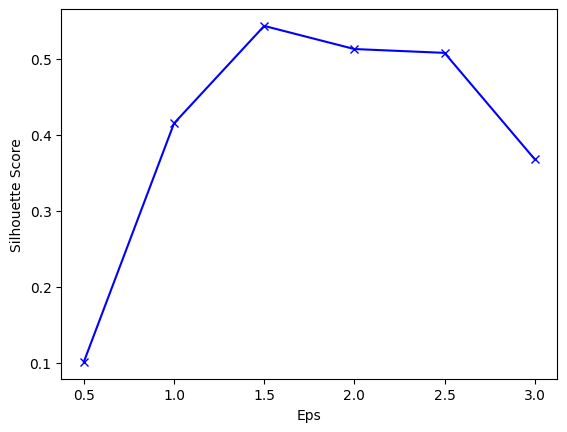

In [130]:
# Empty dictionary to store the Silhouette score for each value of K
sc = {}

# Iterate for a range of Ks and fit the scaled data to the algorithm. Store the Silhouette score for that K
for eps in np.arange(0.5, 5.5, 0.5):
    dbs = DBSCAN(eps=eps)

    data_behavior_scaled_copy['DBSLabels'] = dbs.fit_predict(transformed_data)
    data['DBSLabels'] = dbs.fit_predict(transformed_data)
    labels = dbs.fit_predict(transformed_data)
    #print("no of labels", len(np.unique(labels)))
    if len(np.unique(labels))>1:
      sc[eps] = silhouette_score(transformed_data, labels)

# Elbow plot
plt.figure()

plt.plot(list(sc.keys()), list(sc.values()), 'bx-')

plt.xlabel("Eps")

plt.ylabel("Silhouette Score")

plt.show()






**Eps=1.5** seems to work best, though anything in the range 1.5-2.5 might be plausible, in case we've hit a saddle point. It might be that eps=1.5 is solely due to default min_samples choice. Let's tune min_samples similarly.

0.5248019274845735  with min_samples 2
0.5452855689759257  with min_samples 3
0.5447514240850904  with min_samples 4
0.5432579128696696  with min_samples 5
0.5412803283855557  with min_samples 6
0.5410223044310082  with min_samples 7
0.5404628434072999  with min_samples 8
0.5391239800276781  with min_samples 9
0.5390779377205508  with min_samples 10
0.5387896586947369  with min_samples 11
0.5374682421861766  with min_samples 12
0.5373716247061795  with min_samples 13
0.5048655837504044  with min_samples 14
0.530167407901859  with min_samples 15
0.5296913972273695  with min_samples 16
0.5283344399614528  with min_samples 17
0.5203236807002284  with min_samples 18
0.5201479190091234  with min_samples 19


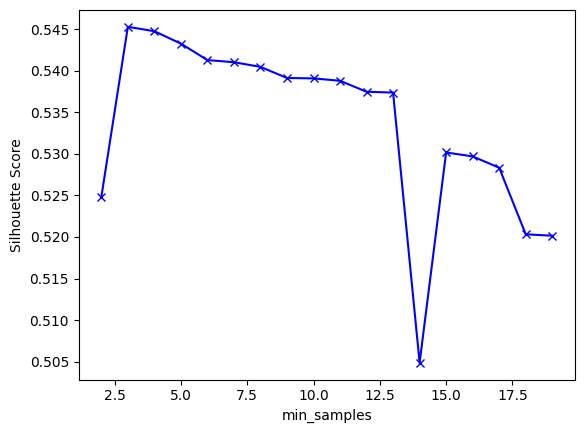

In [131]:
# Empty dictionary to store the Silhouette score for each value of K
sc = {}

# Iterate for a range of Ks and fit the scaled data to the algorithm. Store the Silhouette score for that K
for min_samples in range(2,20,1):
    dbs = DBSCAN(eps=1.5, min_samples=min_samples)

    data_behavior_scaled_copy['DBSLabels'] = dbs.fit_predict(transformed_data)
    data['DBSLabels'] = dbs.fit_predict(transformed_data)
    labels = dbs.fit_predict(transformed_data)
    print(silhouette_score(transformed_data, labels), " with min_samples", min_samples)
    #print("no of labels", len(np.unique(labels)))
    if len(np.unique(labels))>1:#escaping errors from hyperparameters creating too few clusters
      sc[min_samples] = silhouette_score(transformed_data, labels)

# Elbow plot
plt.figure()

plt.plot(list(sc.keys()), list(sc.values()), 'bx-')

plt.xlabel("min_samples")

plt.ylabel("Silhouette Score")

plt.show()


**min_samples**=5 (which is the default) works well.  **min_samples**=3 works slightly better but does not change clustering appearance (see below).  Also, **min_samples**=3 might be an overfit.  (Silh.=0.56)

For **eps** = 2.5, **min_samples**=20 works better (Silh. =0.56)
For **eps** = 2, **min_samples**=5 again works best (Silh.=0.56)

For all the values of **eps** between 1.5 and 2.5, we have checked for robustness of results in clustering.  

### **Apply DBSCAN for the best hyperparameter and visualize the clusters from PCA**

In [132]:
dbs = DBSCAN(eps = 1.5, min_samples=5)

data_behavior_scaled_copy['DBSLabels'] = dbs.fit_predict(transformed_data)
data_dums['DBSLabels'] = dbs.fit_predict(transformed_data)
data['DBSLabels'] = dbs.fit_predict(transformed_data)
transformed_data['DBSLabels']=dbs.fit_predict(transformed_data)
data_demo['DBSLabels'] = dbs.fit_predict(transformed_data)

In [133]:
data['DBSLabels'].value_counts()

DBSLabels
 1    1077
 0     922
 2     228
-1      13
Name: count, dtype: int64

Coincidentally, we also arrive at 4 groups. Let's see how it looks on the first two PCA components.

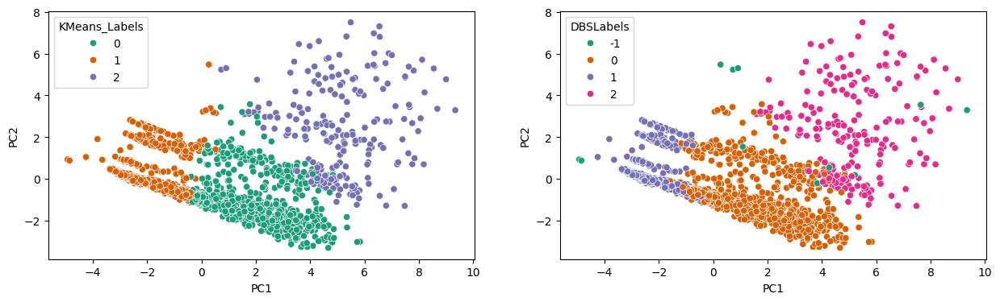

In [134]:
plt.figure(figsize = (15, 4))
plt.subplot(1, 2, 1)
sns.scatterplot(y='PC2', x='PC1', data=transformed_data,  hue='KMeans_Labels', palette='Dark2')
plt.subplot(1, 2, 2)
sns.scatterplot(y='PC2', x='PC1', data=transformed_data,  hue='DBSLabels', palette='Dark2')
plt.show()

<Axes: xlabel='PC1', ylabel='PC2'>

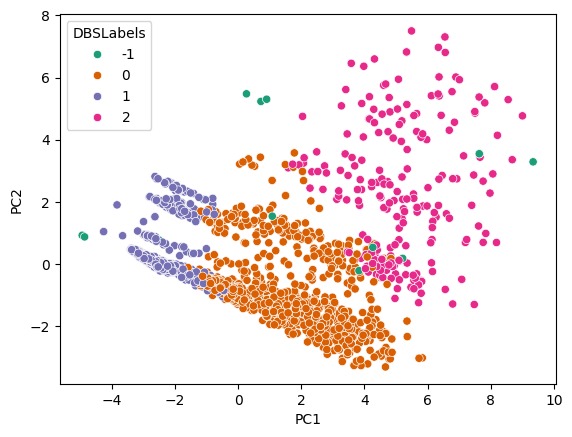

In [135]:
sns.scatterplot(y='PC2', x='PC1', data=transformed_data,  hue='DBSLabels', palette='Dark2')

**Observations and Insights:**
Similar clustering to before, except that the DBSLabel = -1, is pulling 13 customers into their own group for no apparent reason.  Because this is only the first two dimensions of PCA, maybe we're missing something in the next dimension, that the DBSCAN algorithim is picking up for this cluster.

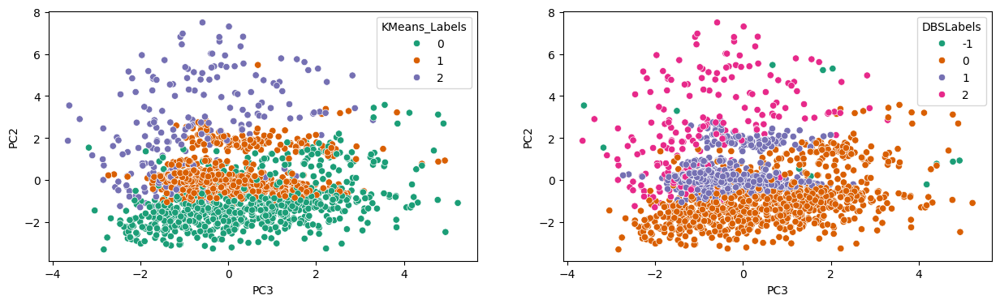

In [136]:
plt.figure(figsize = (15, 4))
plt.subplot(1, 2, 1)
sns.scatterplot(y='PC2', x='PC3', data=transformed_data,  hue='KMeans_Labels', palette='Dark2')
plt.subplot(1, 2, 2)
sns.scatterplot(y='PC2', x='PC3', data=transformed_data,  hue='DBSLabels', palette='Dark2')
plt.show()

PC3 also shows a similar scattering of this -1 category that does not admit simple explanation.

### **Characteristics of each cluster**

In [137]:
mean = round(data_dums.groupby('DBSLabels').mean(), 2)

median = round(data_dums.groupby('DBSLabels').median(), 2)

df_hierachical = pd.concat([mean, median], axis = 0)

df_hierachical.index = ['group_-1 Mean', 'group_0 Mean', 'group_1 Mean', 'group_2 Mean', 'group_-1 Median', 'group_0 Median', 'group_1 Median', 'group_2 Median']

df_hierachical[data_behavior.columns].T

,group_-1 Mean,group_0 Mean,group_1 Mean,group_2 Mean,group_-1 Median,group_0 Median,group_1 Median,group_2 Median
MntWines,595.46,468.15,46.64,838.64,408.00,415.50,23.00,851.50
MntFruits,56.23,42.03,4.96,61.82,14.00,26.00,2.00,43.50
MntMeatProducts,359.00,248.80,23.87,500.89,161.00,181.50,15.00,500.00
MntFishProducts,51.23,60.03,7.25,88.74,12.00,39.00,3.00,69.00
MntSweetProducts,46.69,42.35,5.12,67.78,12.00,26.50,2.00,51.00
MntGoldProds,35.15,69.64,15.40,76.13,22.00,50.00,10.00,56.50
AcceptedCmp4,0.31,0.07,0.01,0.36,0.00,0.00,0.00,0.00
AcceptedCmp5,0.31,0.01,0.00,0.66,0.00,0.00,0.00,1.00
AcceptedCmp1,0.46,0.03,0.00,0.50,0.00,0.00,0.00,0.00
Response,0.62,0.11,0.08,0.59,1.00,0.00,0.00,1.00


Of course, averages will tell us nothing useful about Group -1, because while the points are scattered wildly, their averages will still settle towards centrality on each dimension (application of CLT?)

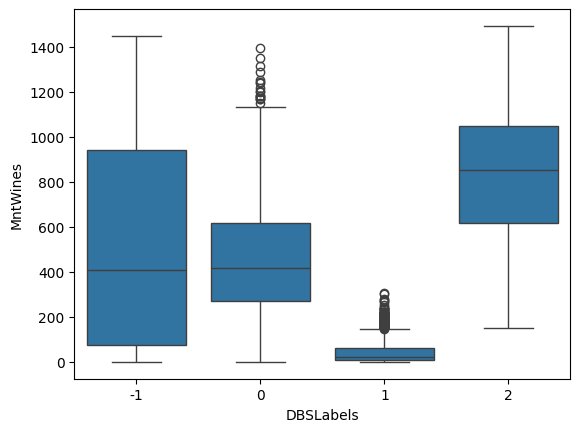

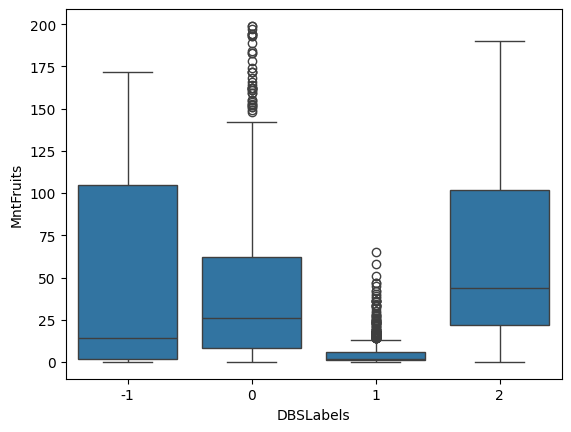

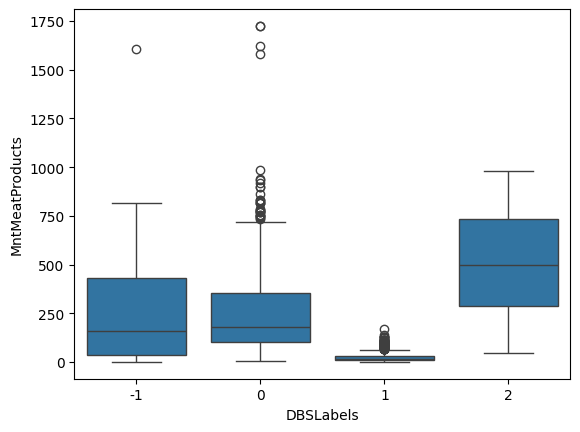

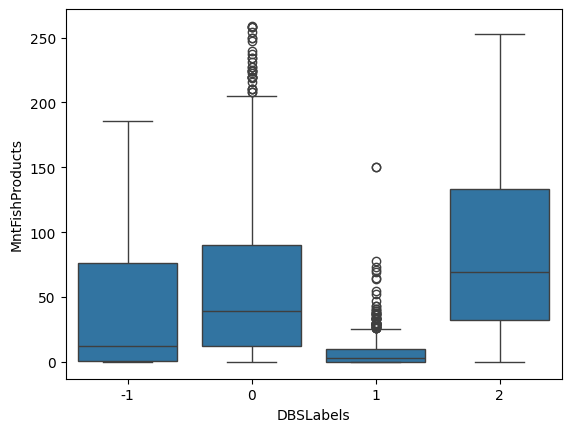

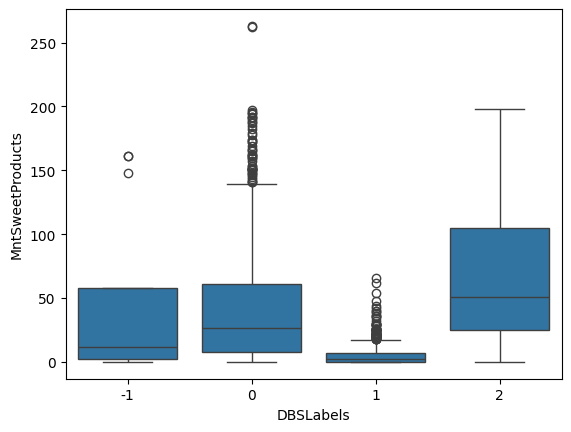

...

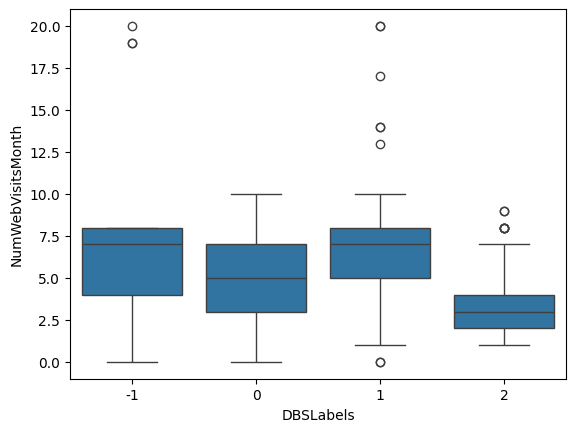

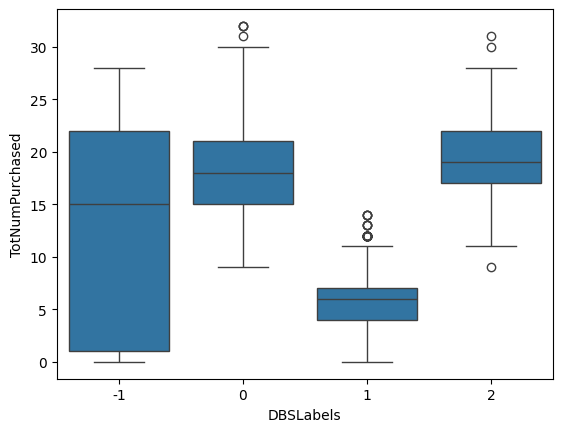

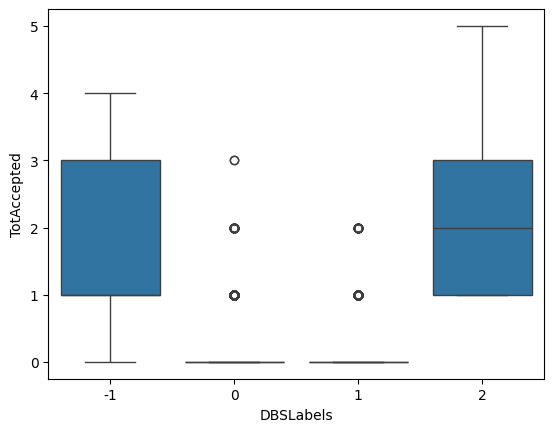

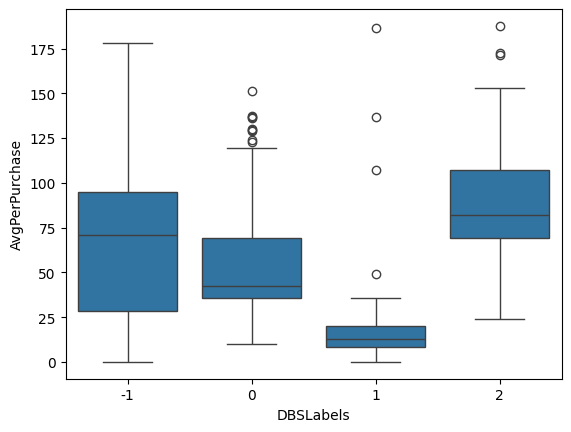

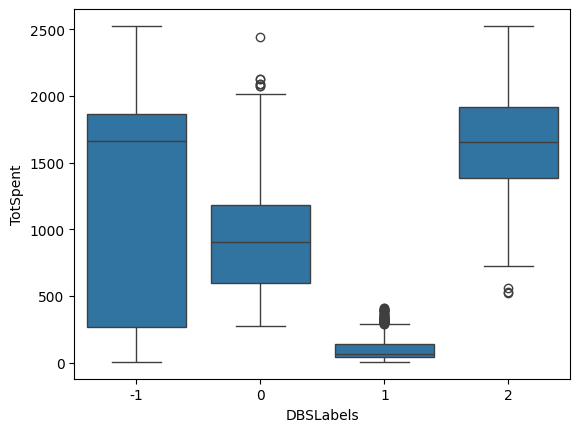

In [138]:
for col in data_behavior.columns:
    sns.boxplot(x = 'DBSLabels', y = col, data = data)
    plt.show()

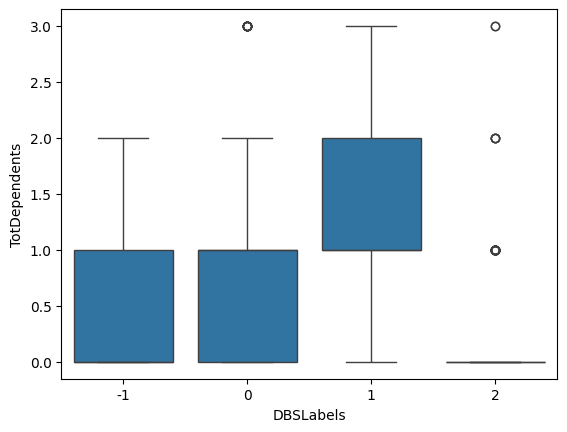

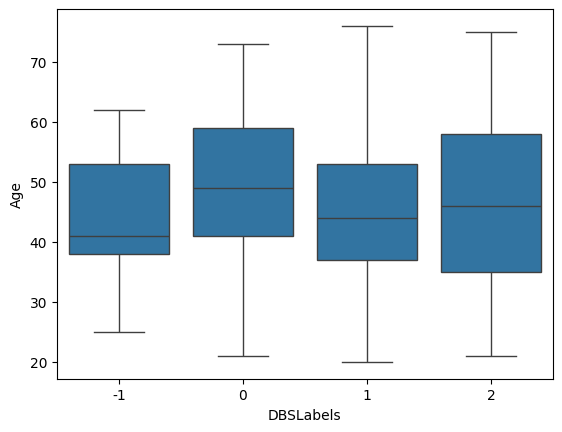

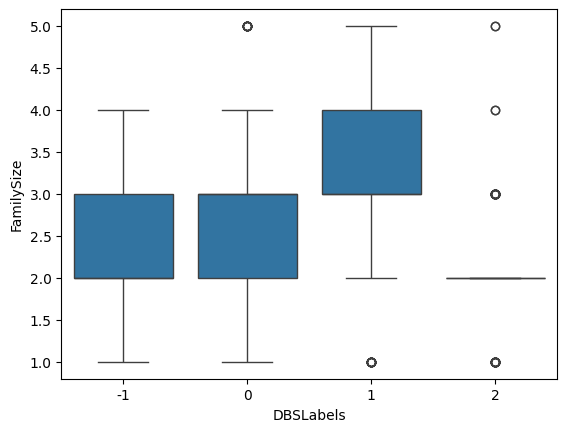

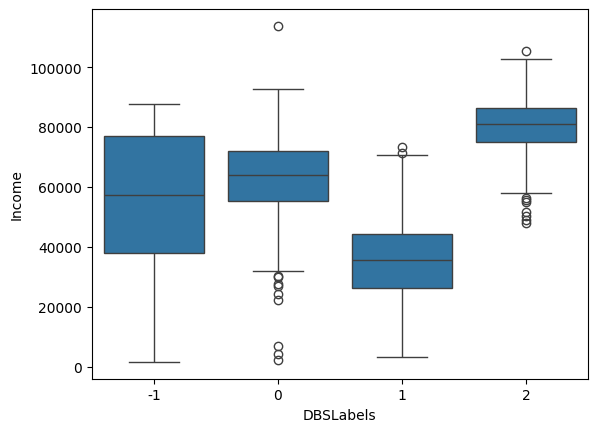

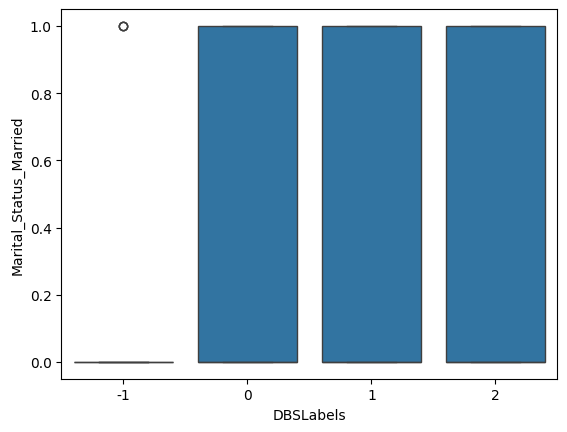

...

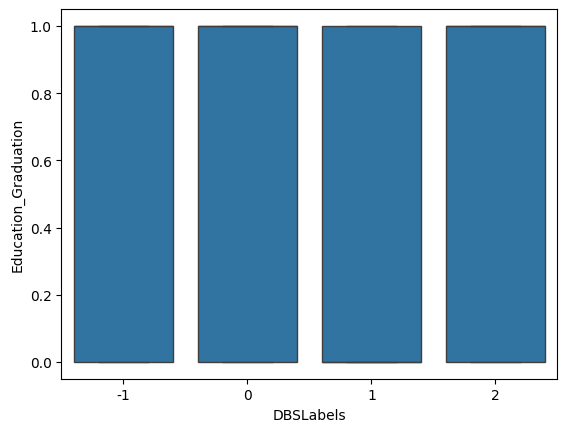

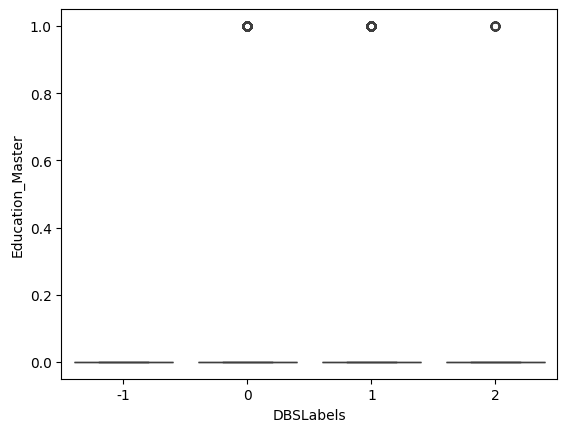

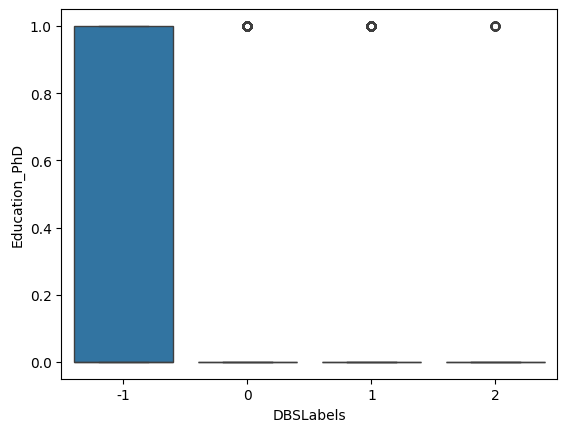

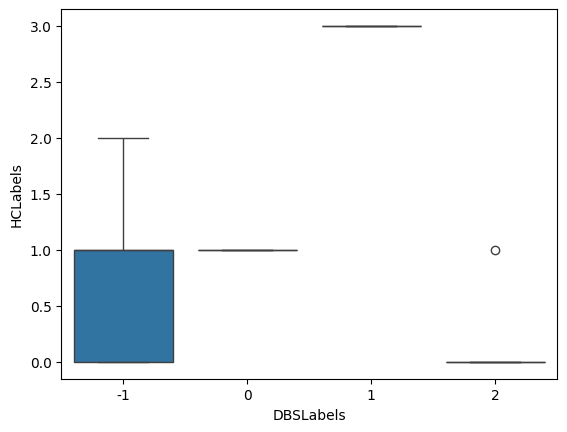

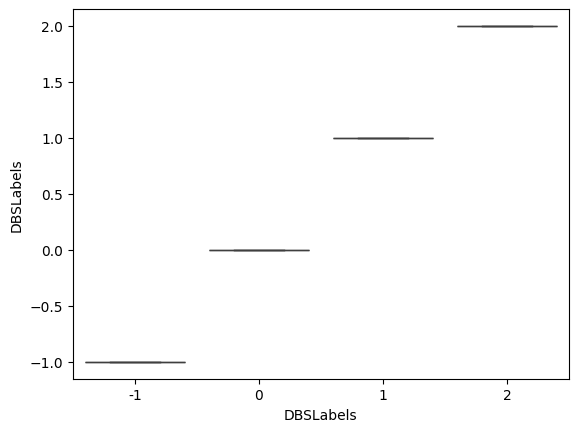

In [139]:
for col in data_demo.columns:
    sns.boxplot(x = 'DBSLabels', y = col, data = data_demo)
    plt.show()

In [140]:
mean = round(data_demo.groupby('DBSLabels').mean(), 2)
print(mean)

           TotDependents    Age  FamilySize    Income  Marital_Status_Married  \
DBSLabels                                                                       
-1                  0.46  43.54        2.15  52268.58                    0.23   
 0                  0.80  49.56        2.65  63320.31                    0.39   
 1                  1.24  45.11        3.11  35586.95                    0.39   
 2                  0.21  46.76        2.07  80355.84                    0.39   

           Marital_Status_Single  Marital_Status_Together  \
DBSLabels                                                   
-1                          0.23                     0.23   
 0                          0.20                     0.26   
 1                          0.22                     0.26   
 2                          0.24                     0.22   

           Marital_Status_Widow  Education_Basic  Education_Graduation  \
DBSLabels                                                               

**Summary of each cluster:**
These clusters aren't as illustrative. Again, we get that the highest income group (**group 2**) (only 228 customers) spends the most, and has the smallest family.  Group 2 responds to campaigns, but not specials deals.

**Group 1** is the largest, with 1077 and they have lowest income, bigger families, and buy a lot less. They don't respond to campaigns or especially to deals.  

**Group 0** has 922 customers.  They don't respond to campaigns or especially to deals.  They are middle income and spent a corresponding amount.

The mysteriously scattered **Group -1** is the most educated (PhD) and the youngest.  The only thing they seem to have in common is that they respond to deals and campaigns.  There are 13 of them.  


## **Gaussian Mixture Model**

Three clusters have so far seems the best, but let's do one last tuning based on sil. score to confirm this.

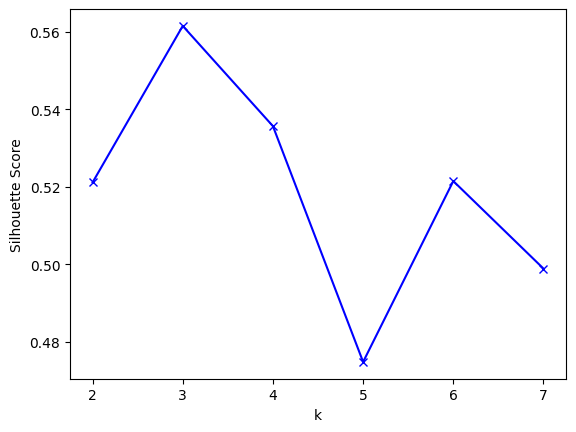

In [141]:
sc = {}

# Iterate for a range of Ks and fit the scaled data to the algorithm. Store the Silhouette score for that K
for k in np.arange(2,8):
    gmm = GaussianMixture(n_components = k, random_state = 1)

    gmm.fit(transformed_data)
    labels = gmm.predict(transformed_data)
    #print("no of labels", len(np.unique(labels)))
    if len(np.unique(labels))>1:
      sc[k] = silhouette_score(transformed_data, labels)

# Elbow plot
plt.figure()

plt.plot(list(sc.keys()), list(sc.values()), 'bx-')

plt.xlabel("k")

plt.ylabel("Silhouette Score")

plt.show()

We confirm that 3 clusters is the best choice for GMM as well. (Silh.=0.56 again)

In [142]:
gmm = GaussianMixture(n_components = 3, random_state = 1)

gmm.fit(transformed_data)

data_behavior_scaled_copy['GmmLabels'] = gmm.predict(transformed_data)
data_behavior['GmmLabels'] = gmm.predict(transformed_data)
data['GmmLabels'] = gmm.predict(transformed_data)
data_demo['GmmLabels'] = gmm.predict(transformed_data)
transformed_data['GmmLabels'] = gmm.predict(transformed_data)

In [143]:
data.GmmLabels.value_counts()

GmmLabels
1    1080
0     925
2     235
Name: count, dtype: int64

**Observations and Insights:**

### **Visualize the clusters using PCA**

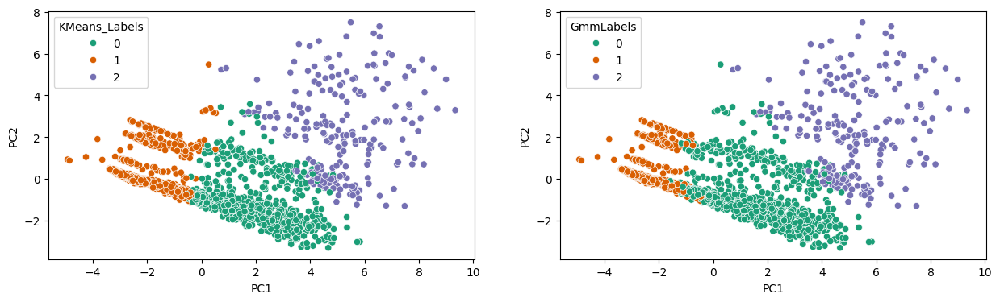

In [144]:
plt.figure(figsize = (15, 4))


plt.subplot(1, 2, 1)
sns.scatterplot(y='PC2', x='PC1', data=transformed_data,  hue='KMeans_Labels', palette='Dark2')
plt.subplot(1, 2, 2)
sns.scatterplot(y='PC2', x='PC1', data=transformed_data,  hue='GmmLabels', palette='Dark2')
plt.show()

<Axes: xlabel='PC1', ylabel='PC2'>

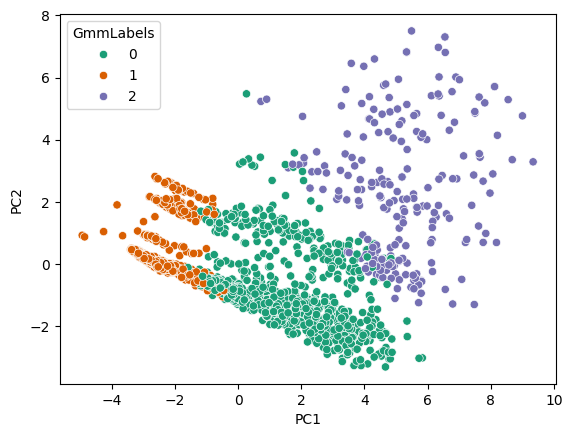

In [145]:
sns.scatterplot(y='PC2', x='PC1', data=transformed_data,  hue='GmmLabels', palette='Dark2')

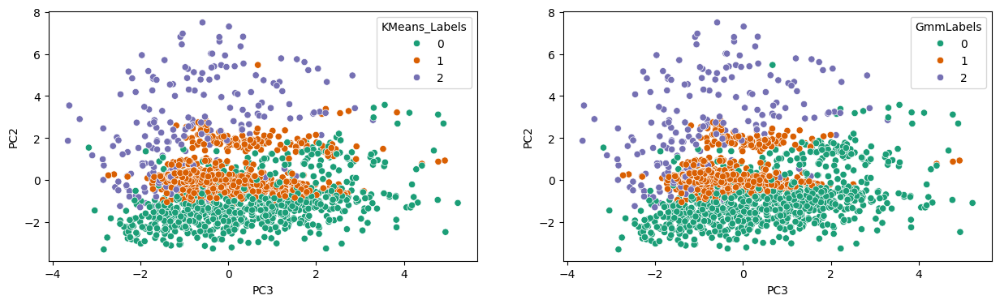

In [146]:
plt.figure(figsize = (15, 4))


plt.subplot(1, 2, 1)
sns.scatterplot(y='PC2', x='PC3', data=transformed_data,  hue='KMeans_Labels', palette='Dark2')
plt.subplot(1, 2, 2)
sns.scatterplot(y='PC2', x='PC3', data=transformed_data,  hue='GmmLabels', palette='Dark2')
plt.show()

Cluster 0 shrunk a bit (n=925 here, n=1217 in Kmeans, n=579 in KMedoids, n=927 in HC, n=922 in DBS), but otherwise they look very similiar.  

### **Cluster Profiling**

In [147]:
mean = round(data_demo.groupby('GmmLabels').mean(), 2)
print(mean)
mean = round(data_behavior.groupby('GmmLabels').mean(), 2)
print(mean)

           TotDependents    Age  FamilySize    Income  Marital_Status_Married  \
GmmLabels                                                                       
0                   0.80  49.54        2.65  63292.55                    0.39   
1                   1.24  45.10        3.11  35500.86                    0.39   
2                   0.21  46.69        2.07  80096.02                    0.39   

           Marital_Status_Single  Marital_Status_Together  \
GmmLabels                                                   
0                           0.20                     0.26   
1                           0.22                     0.26   
2                           0.24                     0.23   

           Marital_Status_Widow  Education_Basic  Education_Graduation  \
GmmLabels                                                                
0                          0.04             0.00                  0.51   
1                          0.03             0.05                  

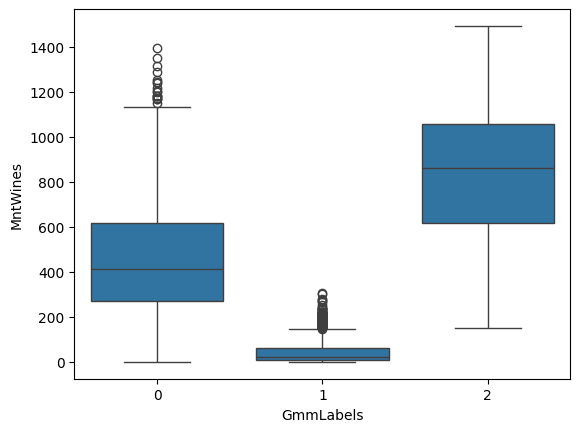

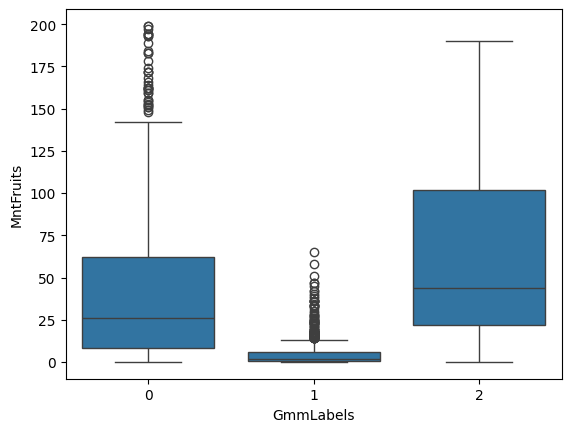

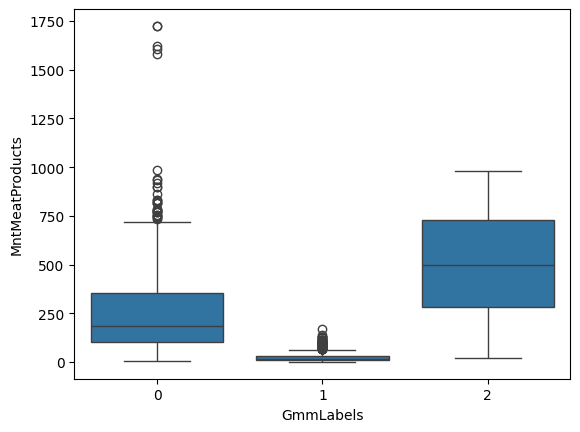

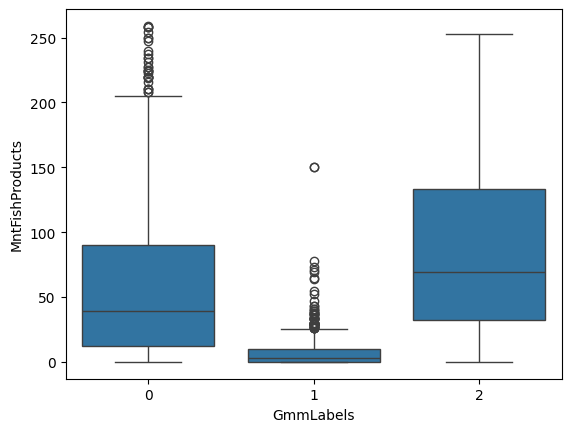

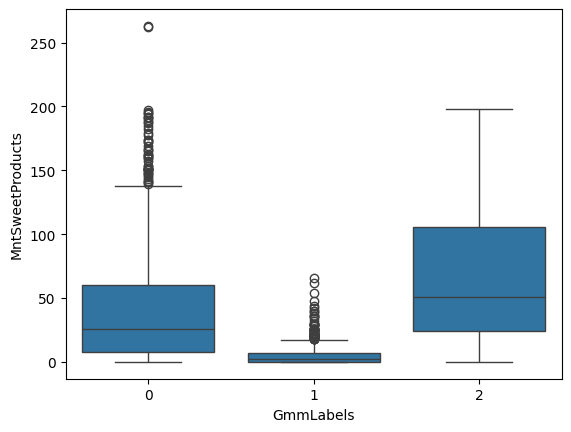

...

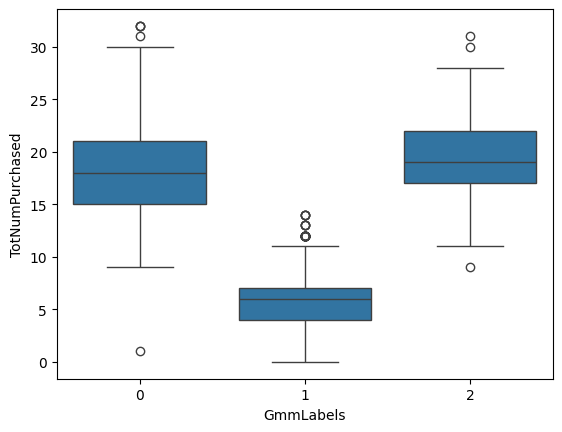

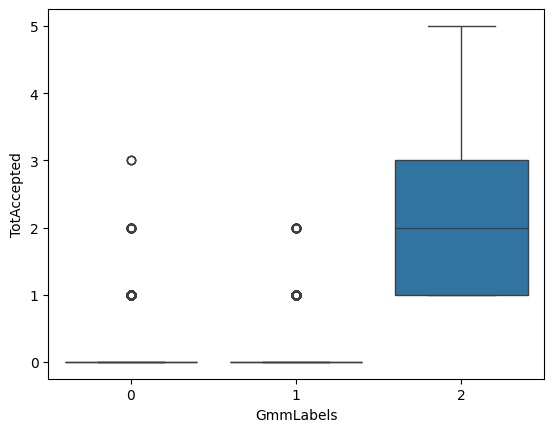

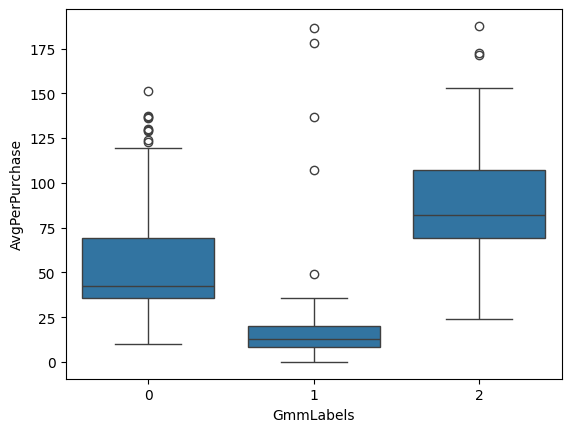

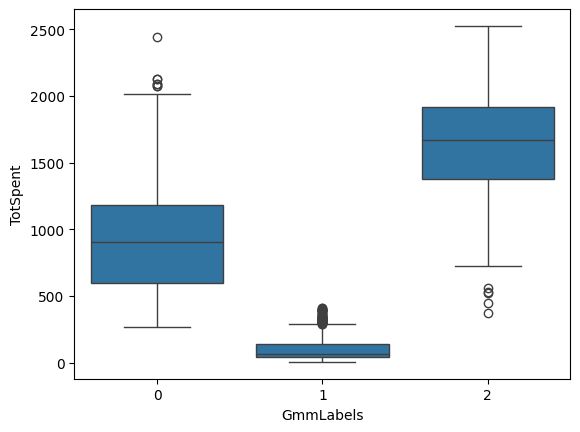

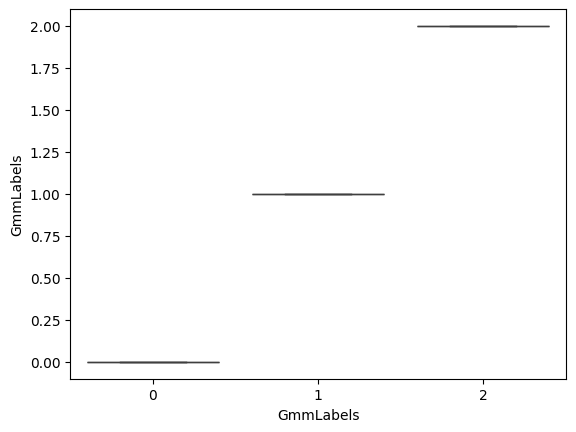

In [148]:
for col in data_behavior.columns:
    sns.boxplot(x = 'GmmLabels', y = col, data = data)
    plt.show()


### **Characteristics of each cluster**

**Summary of each cluster:**

**Observations and Insights:**
Very similar stories to what we've seen before.  

**Group 2** (n=235) here is almost exactly the same group as DBS 2: highest income, smallest families, highest spenders, more store and catalog purchases, fewer website visits.  Not susceptible to deals, but are easily responsive to marketing campaigns.

**Group 1** (n=1080) is again the web window shoppers, lowest income, least educated, largest families, smallest spenders, who spent a lot of time on the website without buying very much.  They are a bit more likely to respond to deals but not campaigns.  This is also the group 1 from DBS.

**Group 0** (n=925). Intermediate income, family size, and amounts of spending highly educated, they don't respond to marketing campaigns but are the most responsive to deals.  

## **Conclusion and Recommendations**

**1. Comparison of various techniques and their relative performance based on chosen Metric (Measure of success)**:
- On the metric of silhouette score, all methods are remarkably similiar (0.56) in their success, meaning all methods are equally good at clustering points towards smaller distances sithin their cluster and larger distances to points in other clusters.  

**2. Refined insights**:
- Across the 6 clustering methods, certain consistent patterns emerged:
  - The largest cluster of our customers are lower income, with large families,and have very little disposible income. Campaigns are a waste of money on them, as they do not respond, but they are very responsive to discounts.  They window shop online for deals but do not actually buy very much.  
  - Another cluster that consistently emerges is the higher income group with smaller families, who don't care for discounts, but who are highly responsive to campaigns.  
- Money spent on marketing campaigns can be much more effectively spent on the higher income cluster than anyone else, and should especially not be spent on lower income individuals, who don't respond to campaigns.
- Money spend on discounts can be much more effectively spent on the lower income cluster, and should especially not be spent on higher income individuals, who don't respond to discounts anyway.


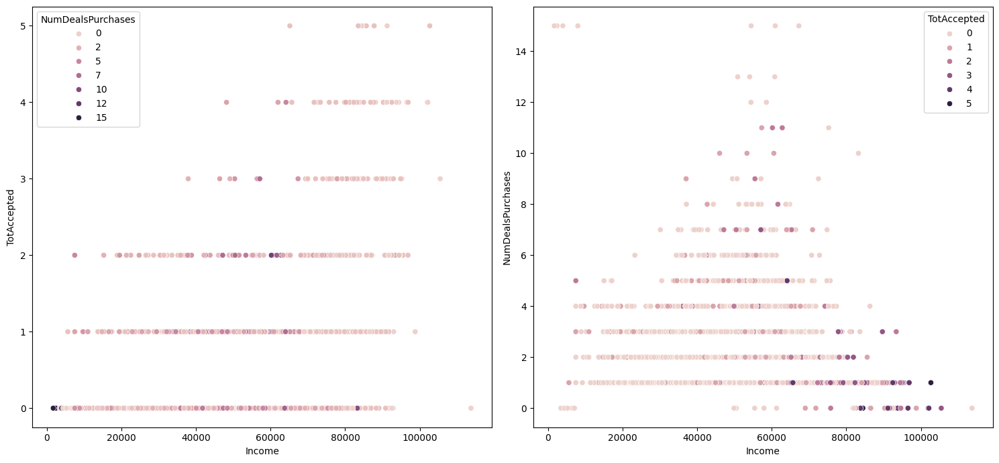

In [149]:
plt.figure(figsize=(15, 7))
plt.subplot(1, 2, 1)
sns.scatterplot(data, x='Income', y='TotAccepted', hue='NumDealsPurchases')
plt.subplot(1, 2, 2)
sns.scatterplot(data, y='NumDealsPurchases', x='Income', hue='TotAccepted')
plt.tight_layout()
plt.show()

The scatterplots above demonstrate that it is the higher income people who accept campaigns and lower income people who respond to deals.  

The left plot shows an absence of lower income people who accept campaigns while showing higher income people taking fewer deals, indicated by a light color.  The right plot shows a sharp dropoff on number of deals taken for higher income customers with the darker dots for higher income show an increasing receptivity to marketing campaigns.  Notably, the middle income people take the most deals, as they both are price conscious while simultaneously having enough money to purchase a lot.

However, we note that that these trends are far from perfect and categorical, so simply segmenting the customer base by income will not be effective, **underscoring the need for the clustering algorithims employed here**.

**3. Proposal for the final solution design:**
- Of all the clustering models, I can most advocate for **hierarchical clustering**, as it produces the largest groups for which specific marketing actions can be taken which are also uniformly distinct in the key characteristics of campaign marketability and deal receptivity.  In particular, each of the other models has limitations:

-- **tSNE** is helpful in that it cleanly removes 1708 people who do not response to campaigns. The problem is that is does not produce any groups with strong tendency to take deals.

-- **Kmeans** chooses a group of 803 people who respond to campaigns, but similarly does not identify a group with strong tendency to take deals.

-- **KMedoids** does not create a cluster of campaignable individuals.  As these will be the highest income individuals who spent the most, any final model necessarily must include individuals who respond to campaigns.

-- **DBSCAN** locates 228 campaignable customers and 1999 who respond to deals we but are discouraged by the hyperfocused group of 13 people (G-1).  They appear both receptive to campaigns and deals, but the fact that they fail to show any kind of localization in the corresponding PCA scatterplots makes us doubtful of the model's creation of this cluster and speculate that this is an instance of overfitting.

-- **Gaussian Mixture** similarly gives 235 campaignable customers and 2005 who respond to deals. This is similar to Hierarchical Clustering (HC), except the HC's clusters also manages to find deals customers with high income, who correspondingly spend more money.

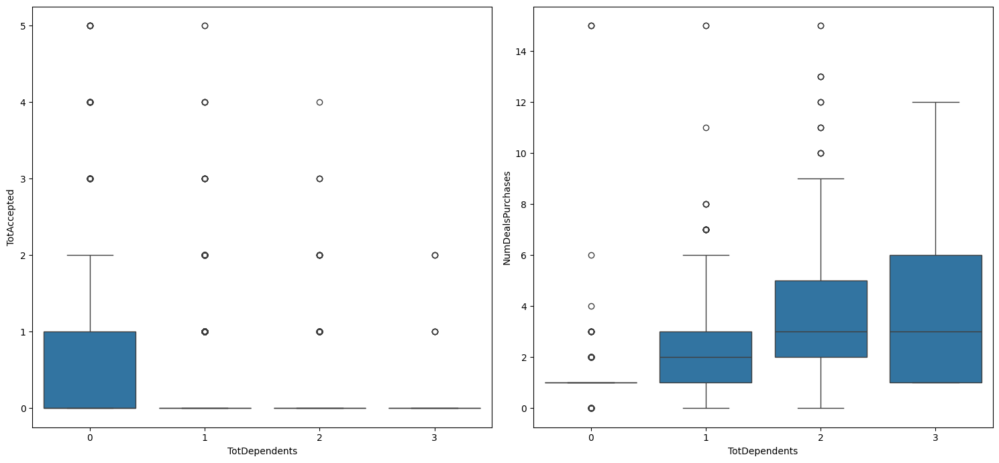

In [150]:
plt.figure(figsize=(15, 7))
plt.subplot(1, 2, 1)
sns.boxplot(data, x='TotDependents', y='TotAccepted')
plt.subplot(1, 2, 2)
sns.boxplot(data, y='NumDealsPurchases', x='TotDependents')
plt.tight_layout()
plt.show()

In [151]:
!pip install nbconvert

In [152]:
import nbconvert
import os
from nbconvert import HTMLExporter

In [153]:
!jupyter nbconvert --to html /content/Capstone_Project_Reference_Notebook_Full_Code_Marketing_Campaign_Analysis.ipynb

[NbConvertApp] WARNING | pattern '/content/Capstone_Project_Reference_Notebook_Full_Code_Marketing_Campaign_Analysis.ipynb' matched no files
This application is used to convert notebook files (*.ipynb)
        to various other formats.


Options
The options below are convenience aliases to configurable class-options,
as listed in the "Equivalent to" description-line of the aliases.
To see all configurable class-options for some <cmd>, use:
    <cmd> --help-all

--debug
    set log level to logging.DEBUG (maximize logging output)
    Equivalent to: [--Application.log_level=10]
--show-config
    Show the application's configuration (human-readable format)
    Equivalent to: [--Application.show_config=True]
--show-config-json
    Show the application's configuration (json format)
    Equivalent to: [--Application.show_config_json=True]
--generate-config
    generate default config file
    Equivalent to: [--JupyterApp.generate_config=True]
-y
    Answer yes to any questions instead of pro